In [1]:
import sys
sys.path.append("../") # adding the path to read the utils file
from sklearnex import patch_sklearn
patch_sklearn(global_patch=True)
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
from sklearn import metrics, tree
from shap import TreeExplainer
import fasttreeshap
from shap import plots, Explanation
import graphviz 
from yellowbrick.model_selection import LearningCurve
import time
import shap
from utils import *
import pickle
import glob
from yellowbrick.classifier import ROCAUC
from yellowbrick.contrib.wrapper import wrap
from daal4py.sklearn.ensemble import GBTDAALClassifier

pd.set_option('display.max_columns', None)

Scikit-learn was successfully globally patched by Intel(R) Extension for Scikit-learn


Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
/home/ludotosk/anaconda3/envs/tesi/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
ds = pd.concat([pd.read_csv(csv_file, engine='pyarrow', index_col='id') for csv_file in glob.glob('../datasets/NFS-2023-TE/*.csv')], ignore_index=True)
ds.head()

,expiration_id,src_ip,src_mac,src_oui,src_port,dst_ip,dst_mac,dst_oui,dst_port,protocol,ip_version,vlan_id,bidirectional_first_seen_ms,bidirectional_last_seen_ms,bidirectional_duration_ms,bidirectional_packets,bidirectional_bytes,src2dst_first_seen_ms,src2dst_last_seen_ms,src2dst_duration_ms,src2dst_packets,src2dst_bytes,dst2src_first_seen_ms,dst2src_last_seen_ms,dst2src_duration_ms,dst2src_packets,dst2src_bytes,bidirectional_min_ps,bidirectional_mean_ps,bidirectional_stddev_ps,bidirectional_max_ps,src2dst_min_ps,src2dst_mean_ps,src2dst_stddev_ps,src2dst_max_ps,dst2src_min_ps,dst2src_mean_ps,dst2src_stddev_ps,dst2src_max_ps,bidirectional_min_piat_ms,bidirectional_mean_piat_ms,bidirectional_stddev_piat_ms,bidirectional_max_piat_ms,src2dst_min_piat_ms,src2dst_mean_piat_ms,src2dst_stddev_piat_ms,src2dst_max_piat_ms,dst2src_min_piat_ms,dst2src_mean_piat_ms,dst2src_stddev_piat_ms,dst2src_max_piat_ms,bidirectional_syn_packets,bidirectional_cwr_packets,bidirectional_ece_packets,bidirectional_urg_packets,bidirectional_ack_packets,bidirectional_psh_packets,bidirectional_rst_packets,bidirectional_fin_packets,src2dst_syn_packets,src2dst_cwr_packets,src2dst_ece_packets,src2dst_urg_packets,src2dst_ack_packets,src2dst_psh_packets,src2dst_rst_packets,src2dst_fin_packets,dst2src_syn_packets,dst2src_cwr_packets,dst2src_ece_packets,dst2src_urg_packets,dst2src_ack_packets,dst2src_psh_packets,dst2src_rst_packets,dst2src_fin_packets,label
0,-1,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1031,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,6,4,0,1499428835357,1499428835358,1,6,800,1499428835357,1499428835358,1,4,473,1499428835357,1499428835358,1,2,327,60,133.333333,109.302638,287,60,118.25,112.535550,287,66,163.5,137.885822,261,0,0.200000,0.447214,1,0,0.333333,0.57735,1,1,1.0,0.000000,1,2,0,0,0,5,2,0,1,1,0,0,0,3,1,0,1,1,0,0,0,2,1,0,0,BENIGN
1,-1,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1031,6,4,0,1499428835358,1499428835358,0,2,120,1499428835358,1499428835358,0,2,120,0,0,0,0,0,60,60.000000,0.000000,60,60,60.00,0.000000,60,0,0.0,0.000000,0,0,0.000000,0.000000,0,0,0.000000,0.00000,0,0,0.0,0.000000,0,0,0,0,0,2,0,1,0,0,0,0,0,2,0,1,0,0,0,0,0,0,0,0,0,BENIGN
2,-1,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1032,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,6,4,0,1499428835374,1499428835375,1,7,2265,1499428835374,1499428835375,1,5,613,1499428835374,1499428835375,1,2,1652,60,323.571429,568.141372,1586,60,122.60,136.648454,367,66,826.0,1074.802307,1586,0,0.166667,0.408248,1,0,0.250000,0.50000,1,1,1.0,0.000000,1,2,0,0,0,6,2,0,1,1,0,0,0,4,1,0,1,1,0,0,0,2,1,0,0,BENIGN
3,-1,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1032,6,4,0,1499428835375,1499428835375,0,2,120,1499428835375,1499428835375,0,2,120,0,0,0,0,0,60,60.000000,0.000000,60,60,60.00,0.000000,60,0,0.0,0.000000,0,0,0.000000,0.000000,0,0,0.000000,0.00000,0,0,0.0,0.000000,0,0,0,0,0,2,0,1,0,0,0,0,0,2,0,1,0,0,0,0,0,0,0,0,0,BENIGN
4,-1,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1033,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,6,4,0,1499428835416,1499428835417,1,8,3550,1499428835416,1499428835417,1,5,1852,1499428835416,1499428835417,1,3,1698,60,443.750000,706.926901,1606,60,370.40,690.726284,1606,60,566.0,871.226721,1572,0,0.142857,0.377964,1,0,0.250000,0.50000,1,0,0.5,0.707107,1,2,0,0,0,7,2,0,1,1,0,0,0,4,1,0,1,1,0,0,0,3,1,0,0,BENIGN


In [3]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3153360 entries, 0 to 3153359
Data columns (total 76 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   expiration_id                 int64  
 1   src_ip                        object 
 2   src_mac                       object 
 3   src_oui                       object 
 4   src_port                      int64  
 5   dst_ip                        object 
 6   dst_mac                       object 
 7   dst_oui                       object 
 8   dst_port                      int64  
 9   protocol                      int64  
 10  ip_version                    int64  
 11  vlan_id                       int64  
 12  bidirectional_first_seen_ms   int64  
 13  bidirectional_last_seen_ms    int64  
 14  bidirectional_duration_ms     int64  
 15  bidirectional_packets         int64  
 16  bidirectional_bytes           int64  
 17  src2dst_first_seen_ms         int64  
 18  src2dst_last_seen_ms  

In [4]:
compute_ratio(ds,'label')

                            Ratio
label                            
BENIGN                      83.71
PortScan                     7.34
DoS Hulk                     5.03
DDoS                         3.03
FTP-Patator                  0.25
DoS GoldenEye                0.25
DoS slowloris                0.16
SSH-Patator                  0.09
DoS Slowhttptest             0.09
Bot                          0.02
Web Attack - Brute Force     0.00
Infiltration                 0.00
Web Attack - XSS             0.00
Web Attack - Sql Injection   0.00
Heartbleed                   0.00


In [5]:
ds.label.value_counts()

label
BENIGN                        2639806
PortScan                       231572
DoS Hulk                       158546
DDoS                            95685
FTP-Patator                      7963
DoS GoldenEye                    7917
DoS slowloris                    5192
SSH-Patator                      2980
DoS Slowhttptest                 2732
Bot                               738
Web Attack - Brute Force          151
Infiltration                       28
Web Attack - XSS                   27
Web Attack - Sql Injection         12
Heartbleed                         11
Name: count, dtype: int64

In [6]:
ds = ds.drop(columns=feature_to_remove_NFS)

In [7]:
sample_weights = ds.label.value_counts().to_dict()

In [8]:
sample_weights['BENIGN'] = 738
sample_weights['PortScan'] = 738
sample_weights['DoS Hulk'] = 738
sample_weights['DDoS'] = 738
sample_weights['FTP-Patator'] = 738
sample_weights['DoS GoldenEye'] = 738
sample_weights['DoS slowloris'] = 738
sample_weights['SSH-Patator'] = 738
sample_weights['DoS Slowhttptest'] = 738

In [9]:
params = {
    'iterations': 40,
    'depth': 11, # 11
    'learning_rate': 0.4,
    'loss_function': 'MultiClass',
    'verbose': True
}

cat = CatBoostClassifier(**params)

rus = RandomUnderSampler(random_state=42, sampling_strategy=sample_weights)
X_res, y_res = rus.fit_resample(ds.drop(columns=['label']), ds['label'])

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size = 0.2, random_state=12, shuffle=True, stratify=y_res)

Fold 0:
0:	learn: 0.4017148	total: 1.74s	remaining: 1m 7s
1:	learn: 0.2898781	total: 2.4s	remaining: 45.6s
2:	learn: 0.2239765	total: 3.43s	remaining: 42.3s
3:	learn: 0.1866616	total: 3.86s	remaining: 34.7s
4:	learn: 0.1589922	total: 5.03s	remaining: 35.2s
5:	learn: 0.1405216	total: 6.17s	remaining: 35s
6:	learn: 0.1261925	total: 7.47s	remaining: 35.2s
7:	learn: 0.1164421	total: 8.73s	remaining: 34.9s


8:	learn: 0.1061132	total: 10.3s	remaining: 35.6s
9:	learn: 0.0928207	total: 10.6s	remaining: 31.7s
10:	learn: 0.0876011	total: 12s	remaining: 31.6s
11:	learn: 0.0824695	total: 13.6s	remaining: 31.7s
12:	learn: 0.0780480	total: 15.1s	remaining: 31.3s
13:	learn: 0.0748461	total: 16.3s	remaining: 30.3s
14:	learn: 0.0712912	total: 17.7s	remaining: 29.6s
15:	learn: 0.0689190	total: 19s	remaining: 28.5s
16:	learn: 0.0663046	total: 20.3s	remaining: 27.5s
17:	learn: 0.0644174	total: 21.5s	remaining: 26.3s
18:	learn: 0.0614111	total: 22.9s	remaining: 25.3s
19:	learn: 0.0597309	total: 24.2s	remaining: 24.2s
20:	learn: 0.0576226	total: 25.5s	remaining: 23.1s
21:	learn: 0.0549849	total: 26.6s	remaining: 21.8s
22:	learn: 0.0535821	total: 28s	remaining: 20.7s
23:	learn: 0.0531022	total: 28.1s	remaining: 18.7s
24:	learn: 0.0514357	total: 29.3s	remaining: 17.6s
25:	learn: 0.0501623	total: 30.5s	remaining: 16.4s
26:	learn: 0.0489233	total: 31.7s	remaining: 15.3s
27:	learn: 0.0473454	total: 33.2s	remai

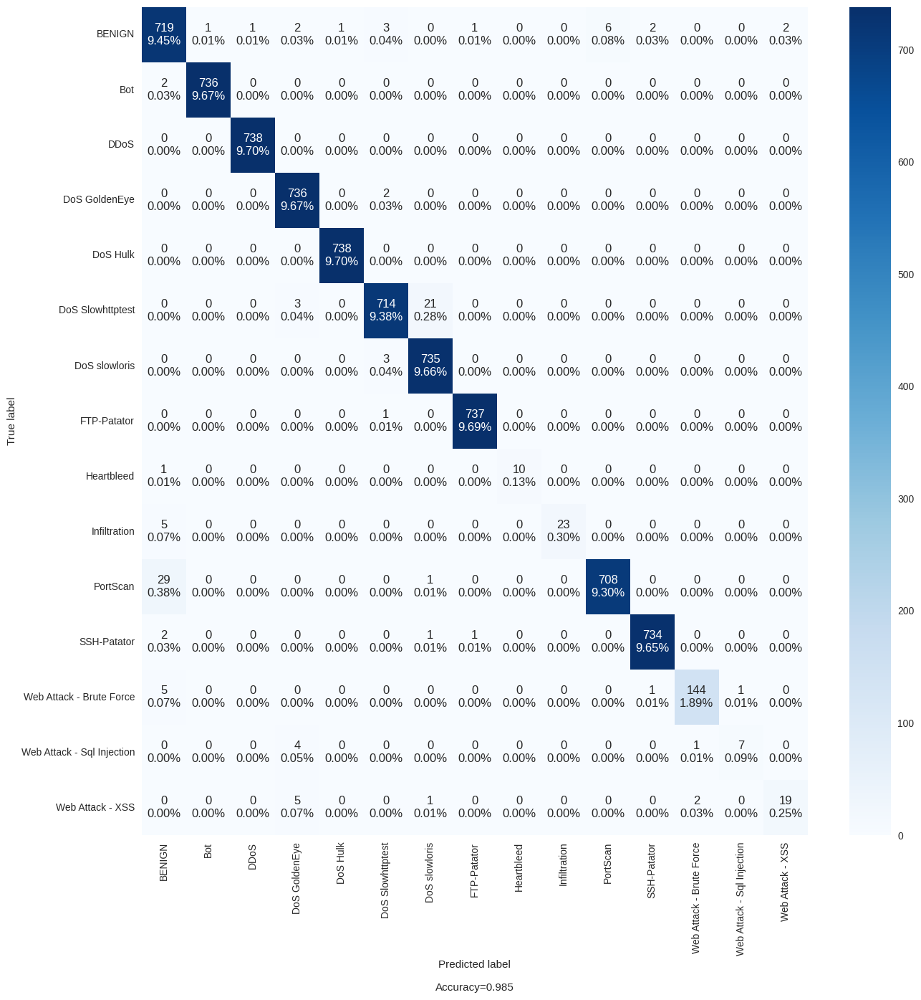

In [11]:
kfold(cat, X_res, y_res)

In [12]:
%time cat.fit(X_train, y_train)

0:	learn: 0.4618382	total: 1.1s	remaining: 43s
1:	learn: 0.3287168	total: 2.29s	remaining: 43.4s
2:	learn: 0.2532631	total: 3.35s	remaining: 41.3s
3:	learn: 0.2062164	total: 4.78s	remaining: 43s
4:	learn: 0.1725142	total: 6.19s	remaining: 43.4s
5:	learn: 0.1490345	total: 7.43s	remaining: 42.1s
6:	learn: 0.1331923	total: 9.01s	remaining: 42.5s
7:	learn: 0.1207329	total: 10.2s	remaining: 40.8s
8:	learn: 0.1111627	total: 11.6s	remaining: 39.9s
9:	learn: 0.1037494	total: 12.7s	remaining: 38.2s
10:	learn: 0.0978396	total: 14.1s	remaining: 37.2s
11:	learn: 0.0929021	total: 15.3s	remaining: 35.7s
12:	learn: 0.0886302	total: 16.7s	remaining: 34.7s
13:	learn: 0.0836524	total: 17.8s	remaining: 33.1s
14:	learn: 0.0801812	total: 19.3s	remaining: 32.2s
15:	learn: 0.0725312	total: 20.5s	remaining: 30.7s
16:	learn: 0.0707107	total: 21.8s	remaining: 29.5s
17:	learn: 0.0690698	total: 23s	remaining: 28.1s
18:	learn: 0.0657293	total: 24.4s	remaining: 27s
19:	learn: 0.0636407	total: 25.6s	remaining: 25.6s

In [15]:
model = GBTDAALClassifier.convert_model(cat)
%timeit model.predict(X_test)

37.1 ms ± 1.24 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [14]:
%time y_predicted_train = cat.predict(X_train)
%timeit cat.predict(X_test)
y_predicted_test = cat.predict(X_test)

CPU times: user 9.1 ms, sys: 6.04 ms, total: 15.1 ms
Wall time: 5.69 ms
2.1 ms ± 330 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [87]:
performanceMetricsDFWeighted(metrics, y_train, y_predicted_train, y_test, y_predicted_test, 'macro')

,Measure,Train,Test
0,ACCURACY,0.991293,0.984231
1,PRECISION,0.994112,0.983127
2,RECALL,0.978713,0.948738
3,F1 SCORE,0.985856,0.961641


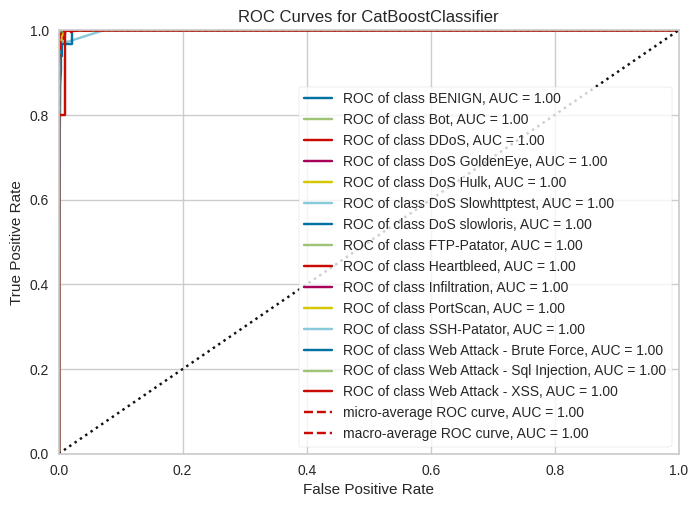

<Axes: title={'center': 'ROC Curves for CatBoostClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [88]:
model = wrap(cat)
visualizer = ROCAUC(model)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

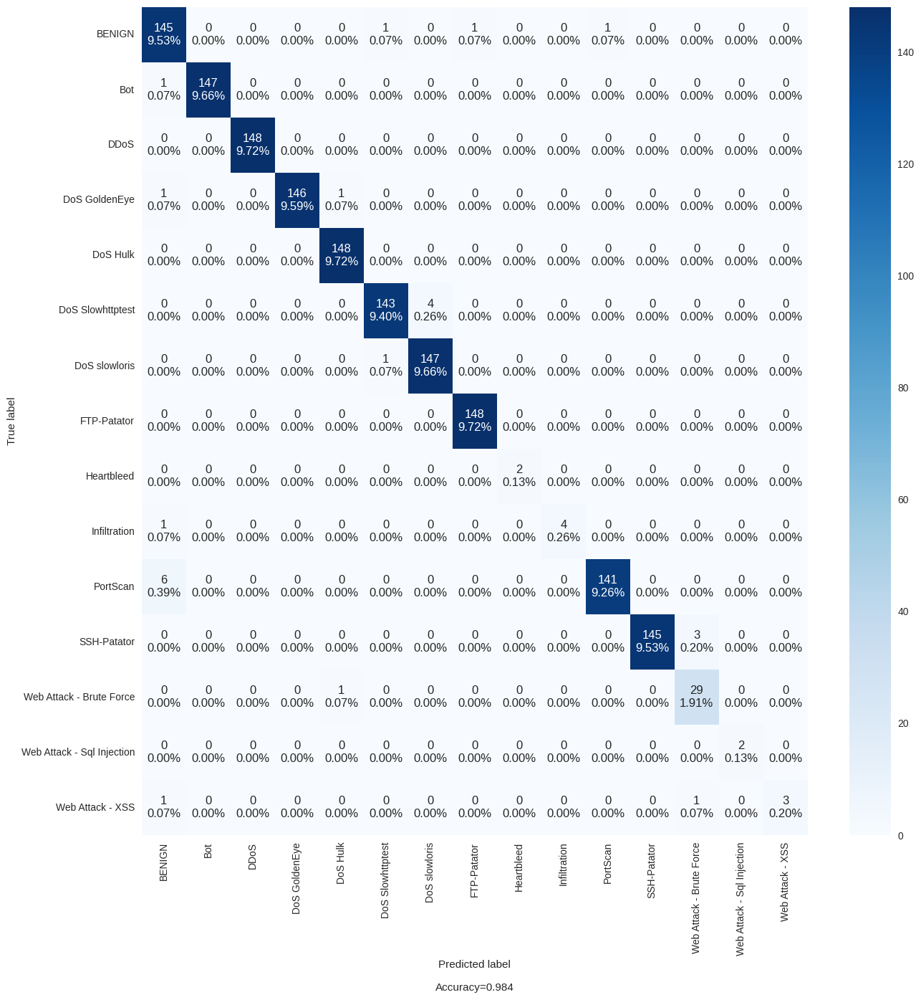

In [89]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(cat.classes_)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

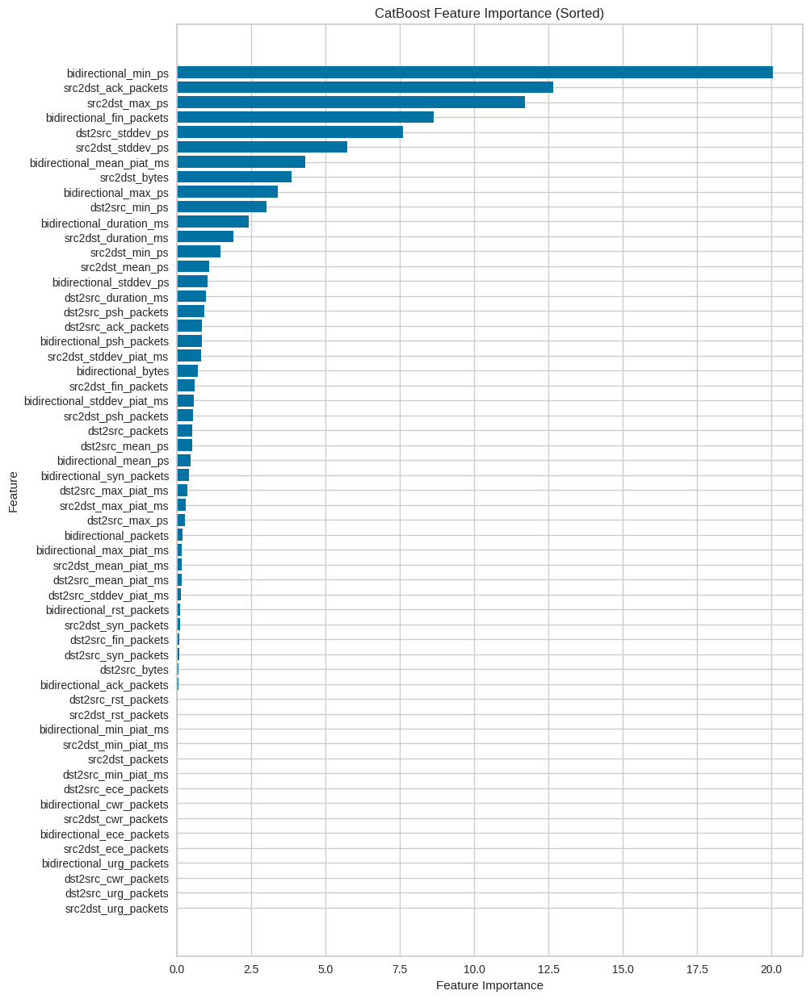

In [90]:
# Retrieve feature importance
feature_importance = model.get_feature_importance(type="FeatureImportance")
feature_names = X_train.columns

# Sort the features and feature importance scores
sorted_indices = np.argsort(feature_importance)
sorted_feature_importance = feature_importance[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

# Plot the sorted feature importance
plt.figure(figsize=(10, 15))
plt.barh(sorted_feature_names, sorted_feature_importance)
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('CatBoost Feature Importance (Sorted)')
plt.show()

Using interventional to stay "true to the model" since we will use this data to do feature reduction and we want also to understand how things work

In [91]:
%%time

explainer = fasttreeshap.TreeExplainer(cat, algorithm='auto', n_jobs=-1) 
sv = explainer(X_train)

CPU times: user 1min 31s, sys: 648 ms, total: 1min 31s
Wall time: 10.9 s


In [92]:
cat.classes_

array(['BENIGN', 'Bot', 'DDoS', 'DoS GoldenEye', 'DoS Hulk',
       'DoS Slowhttptest', 'DoS slowloris', 'FTP-Patator', 'Heartbleed',
       'Infiltration', 'PortScan', 'SSH-Patator',
       'Web Attack - Brute Force', 'Web Attack - Sql Injection',
       'Web Attack - XSS'], dtype=object)

In [93]:
def make_plot(i):
    exp = Explanation(sv.values[:,:,i], 
                  sv.base_values[:,i], 
                  data=X_train, 
                  feature_names=X_res.columns)

    plots.bar(exp, max_display=20, show=False)
    # plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
    plt.show()
    plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)
    plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)
    plots.bar(exp.abs.cohorts(2).mean(0))
    plots.heatmap(exp, instance_order=exp.sum(1))

## Benign shap

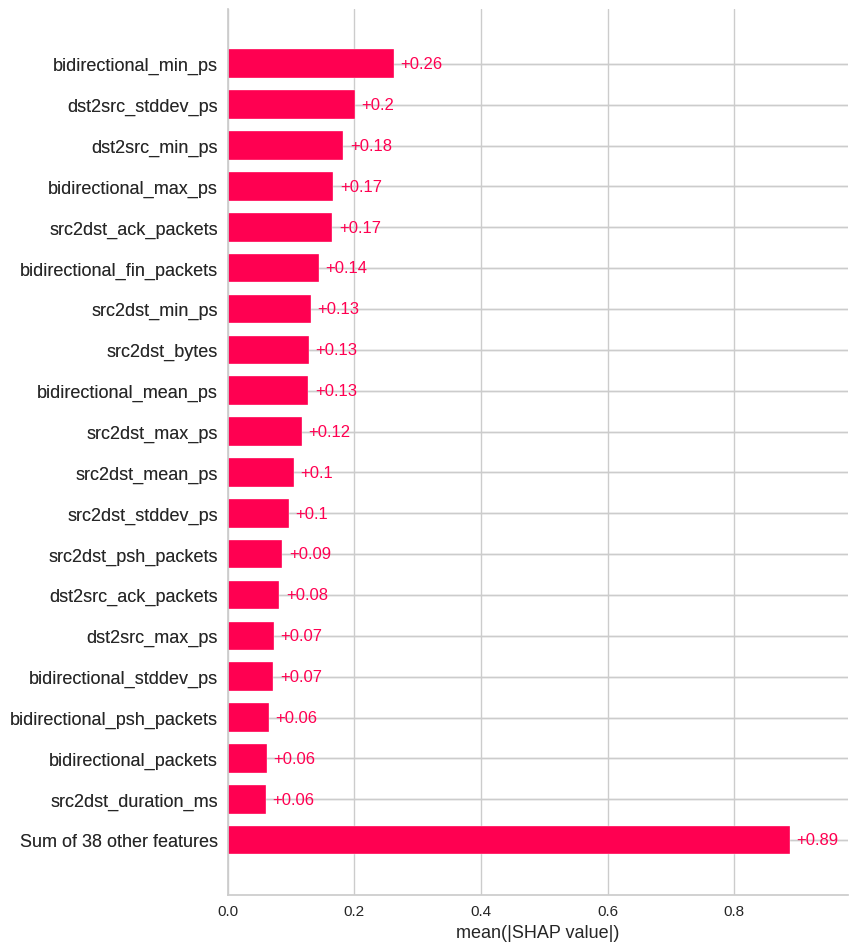

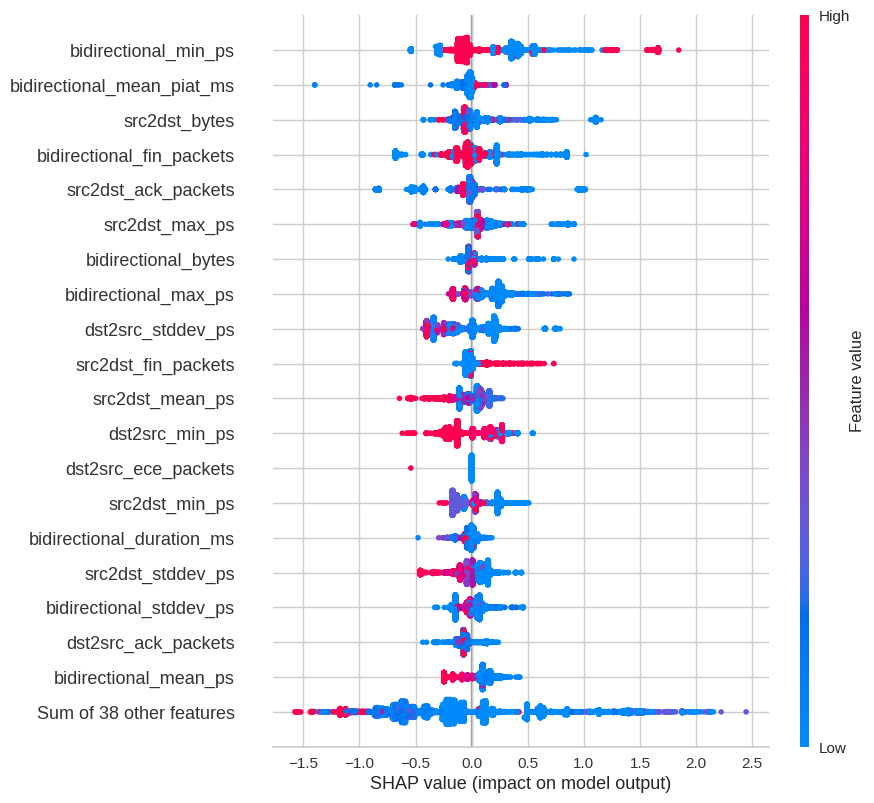

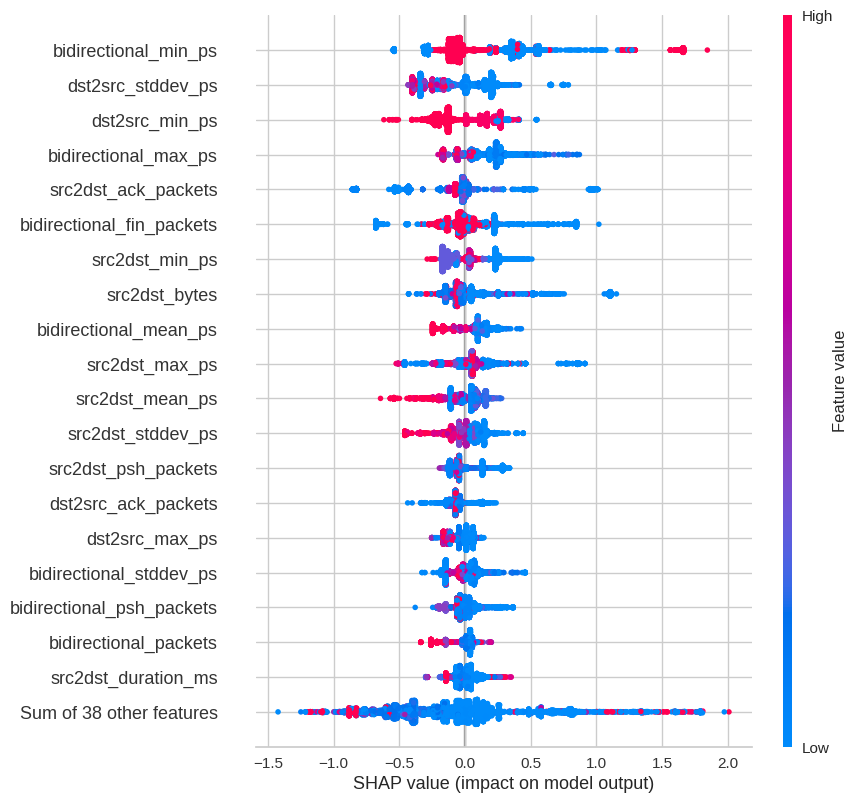

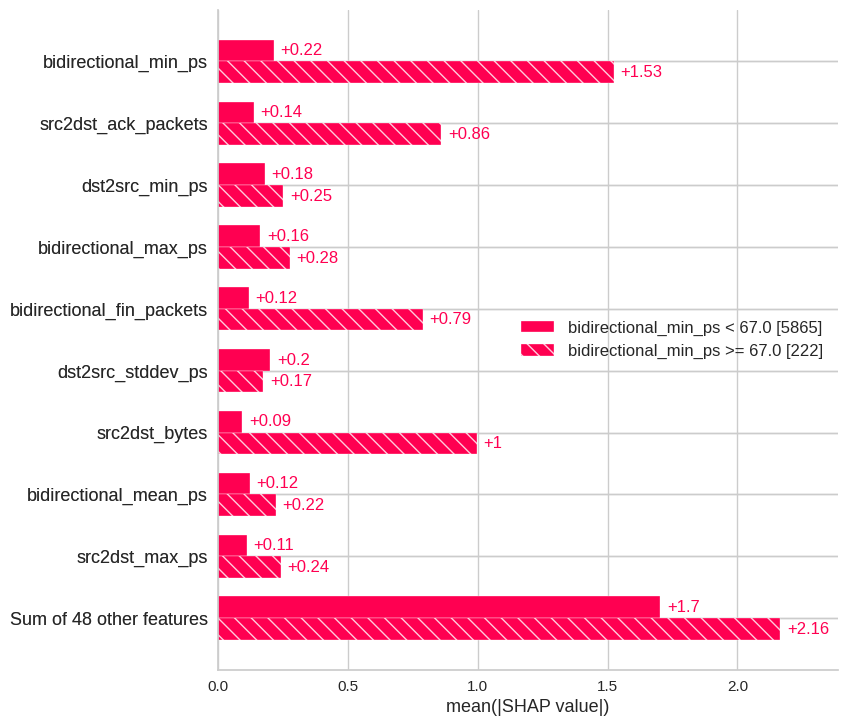

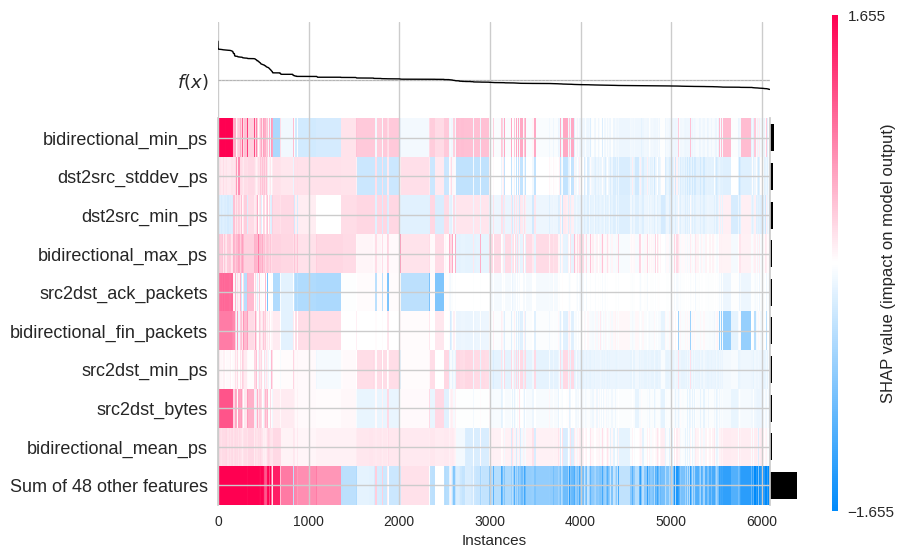

In [94]:
make_plot(0)

## Bot shap

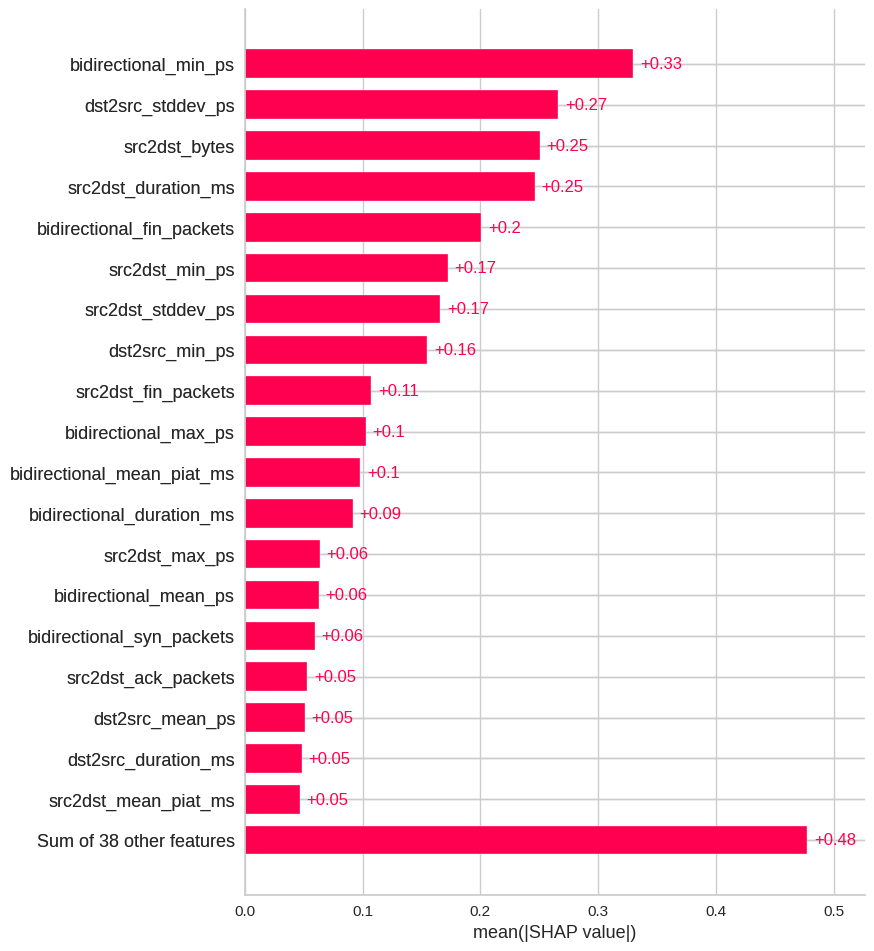

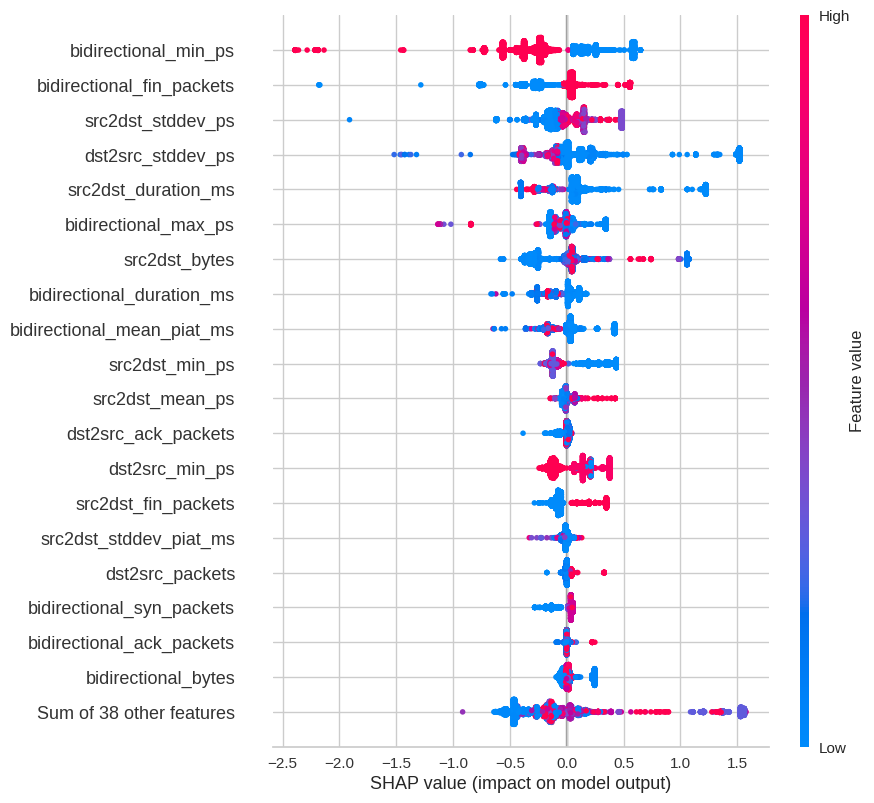

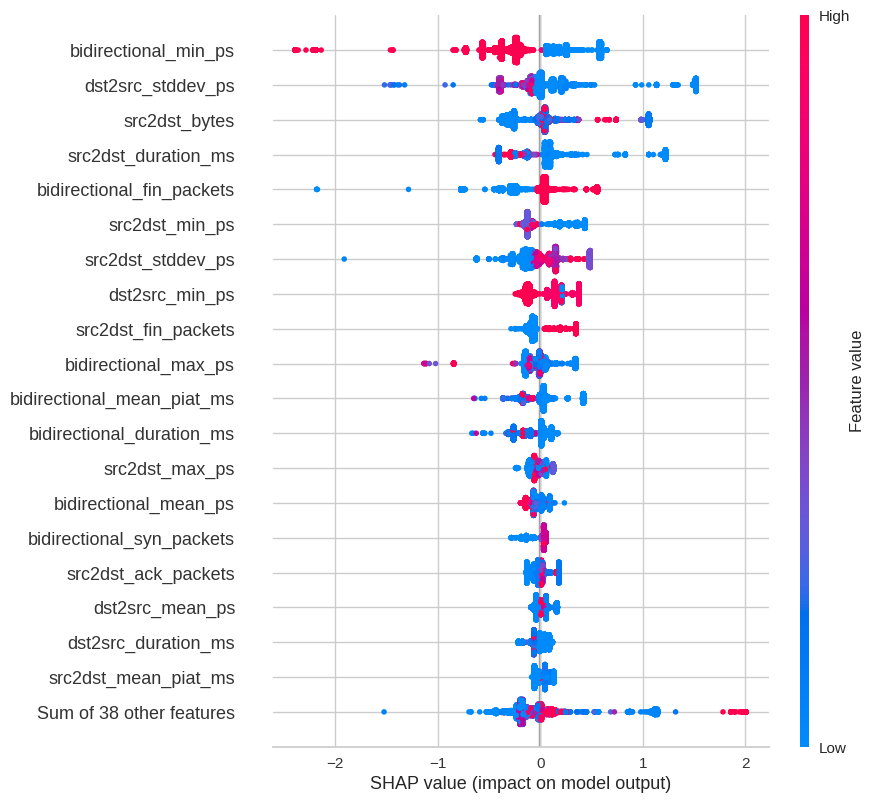

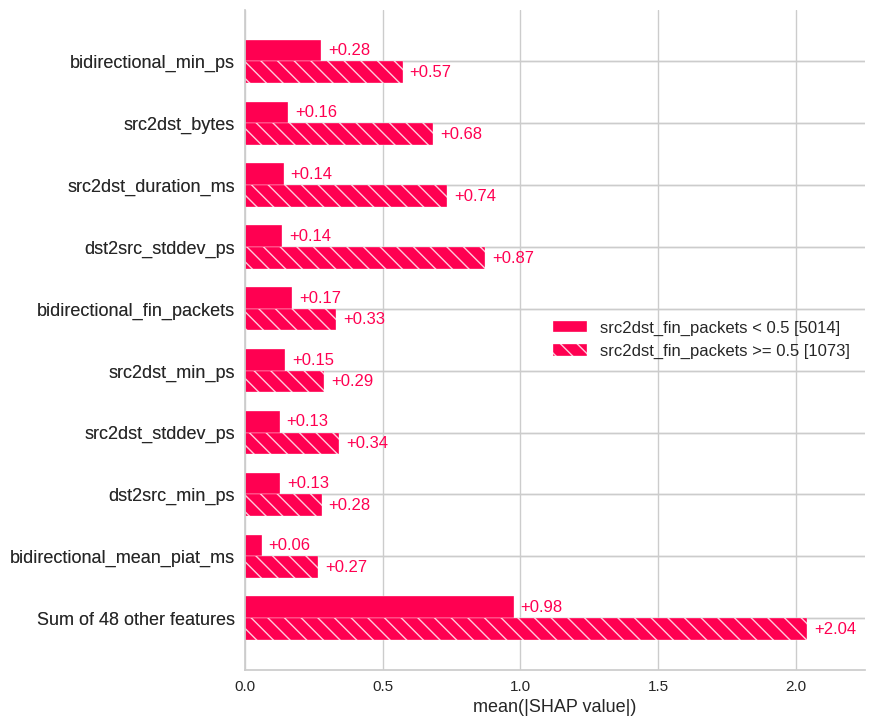

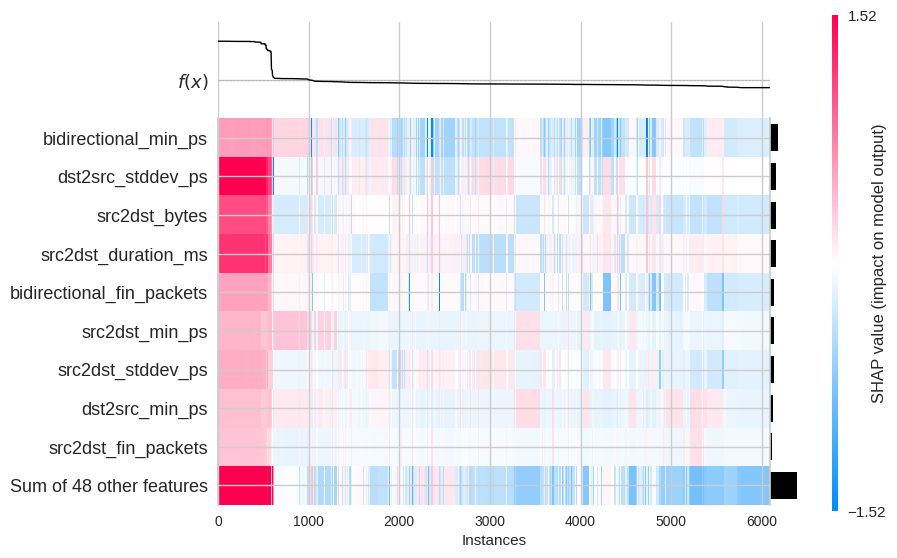

In [95]:
make_plot(1)

## DDoS shap

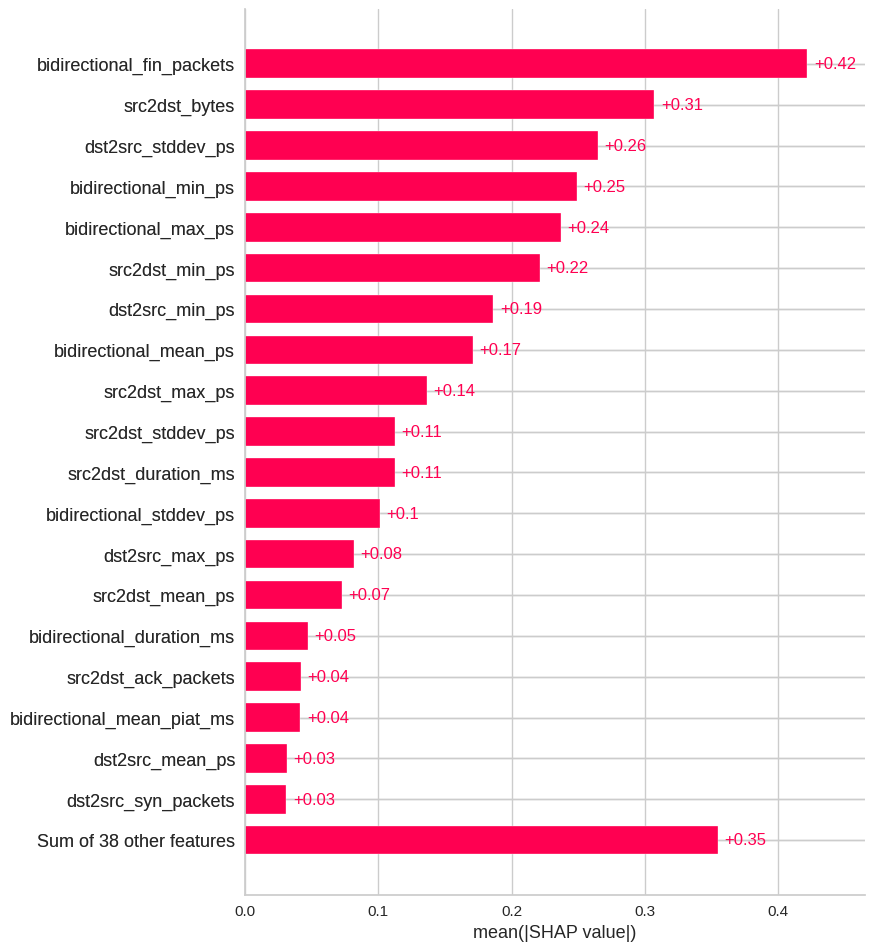

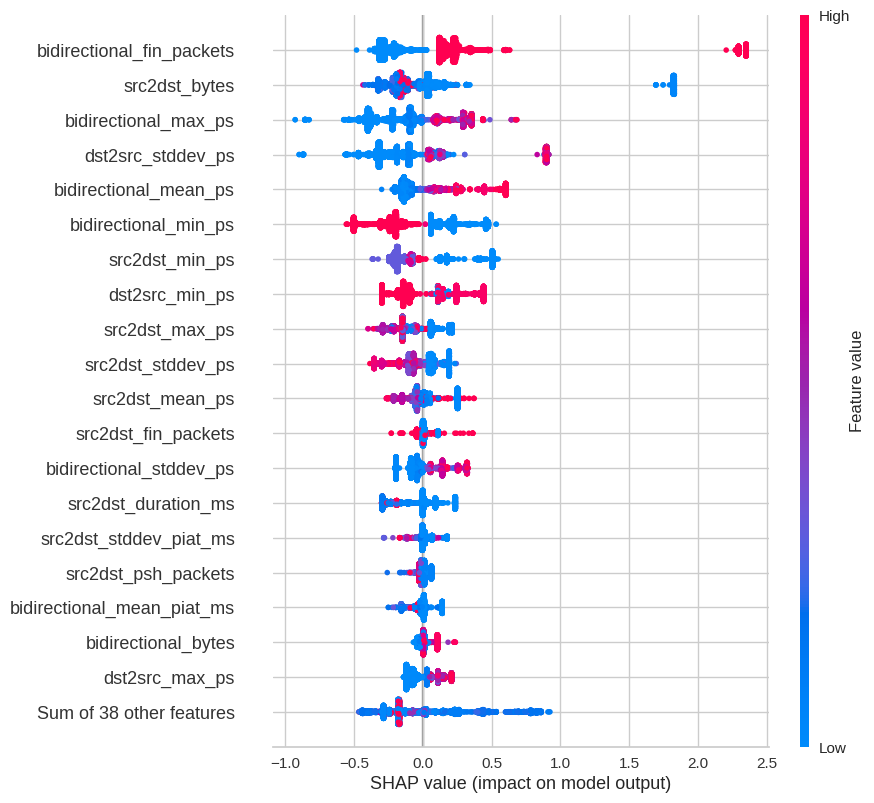

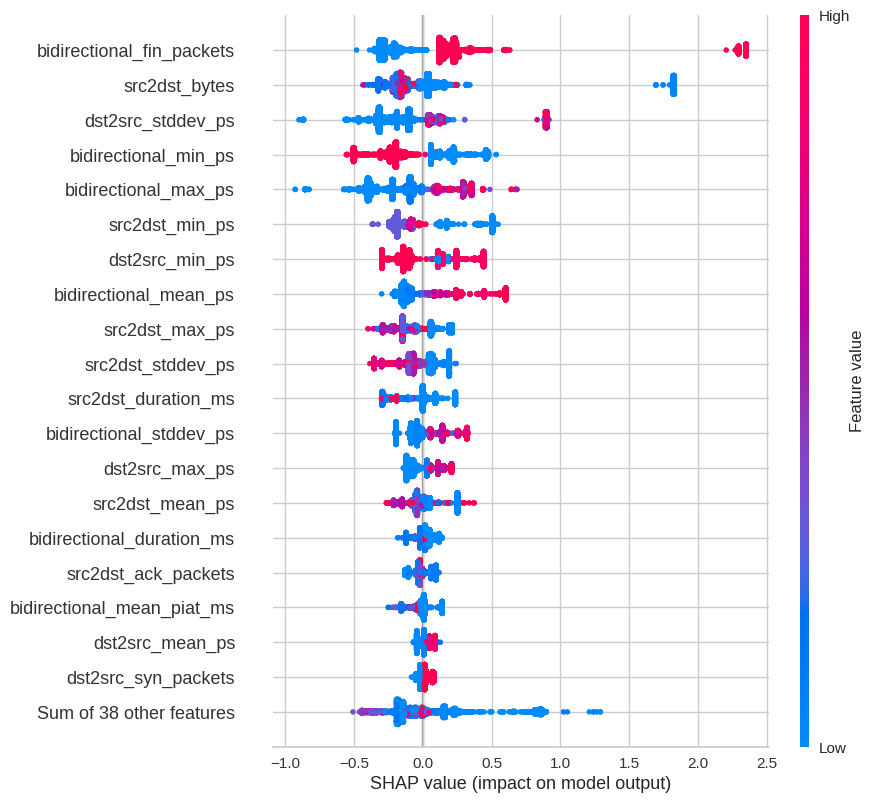

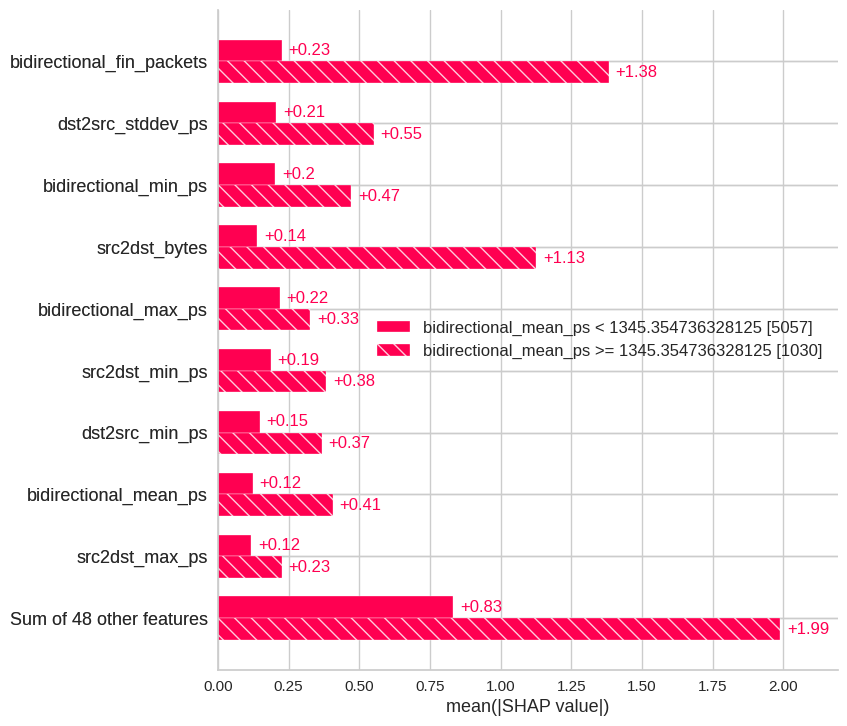

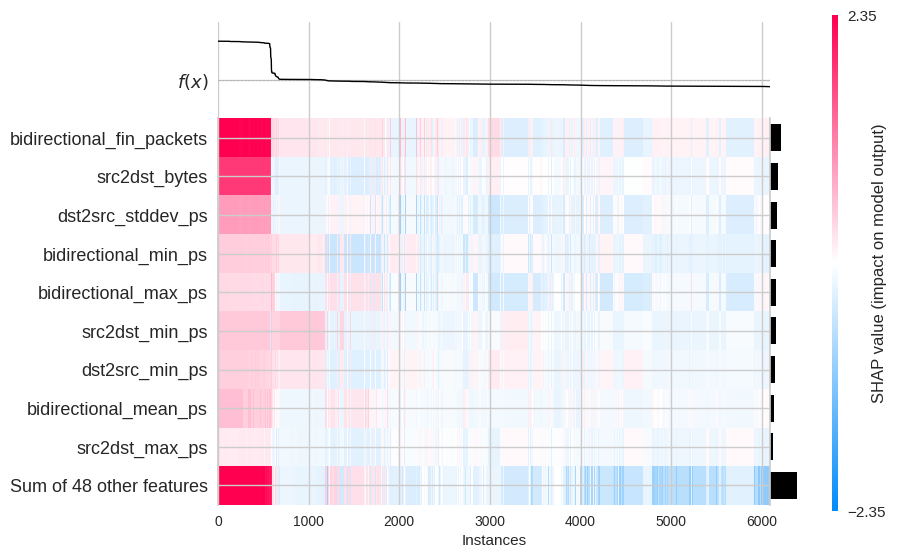

In [96]:
make_plot(2)

## DoS GoldenEye shap

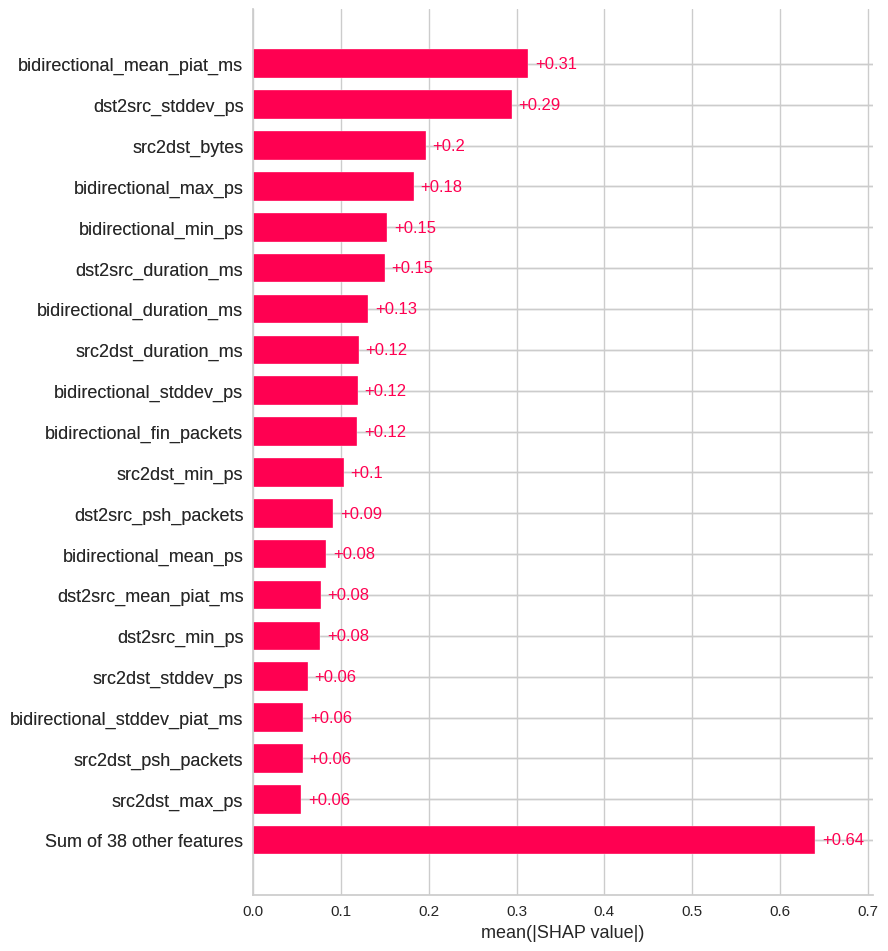

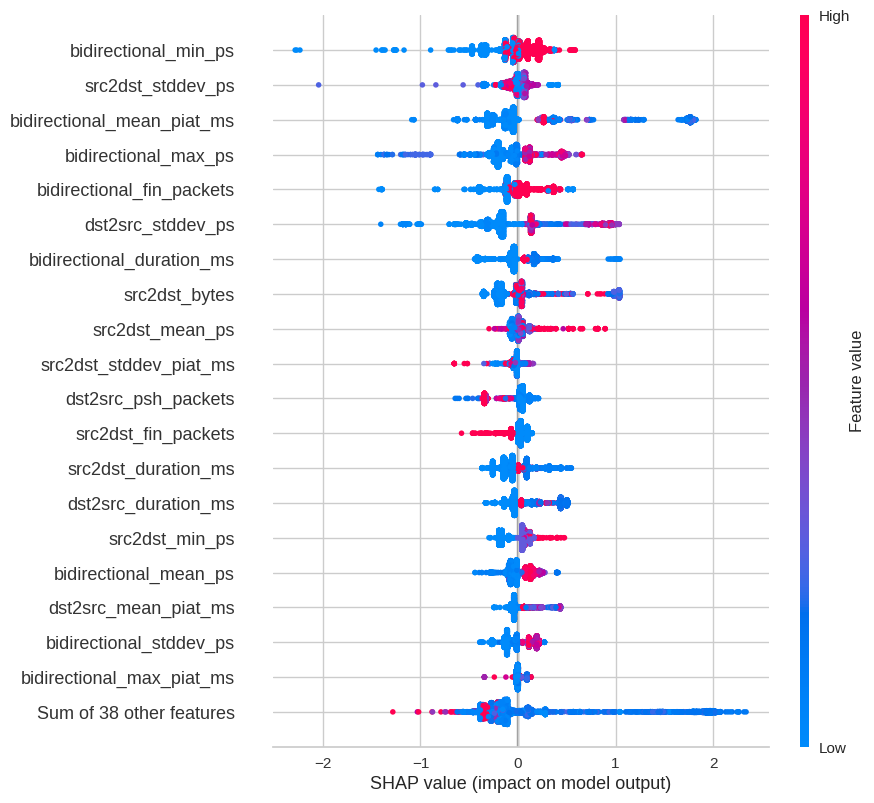

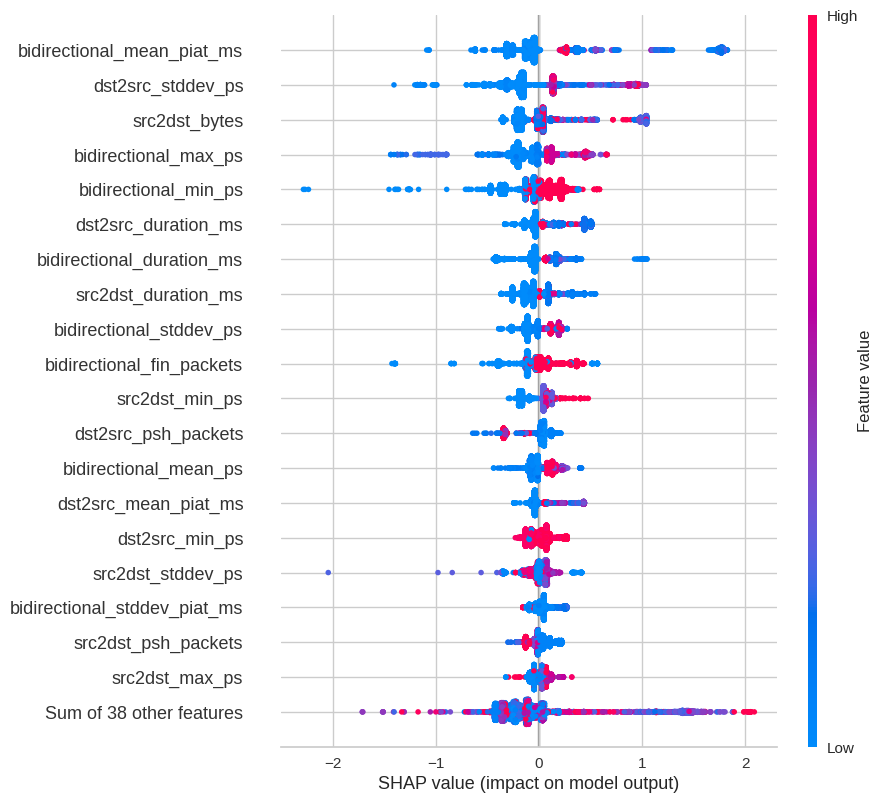

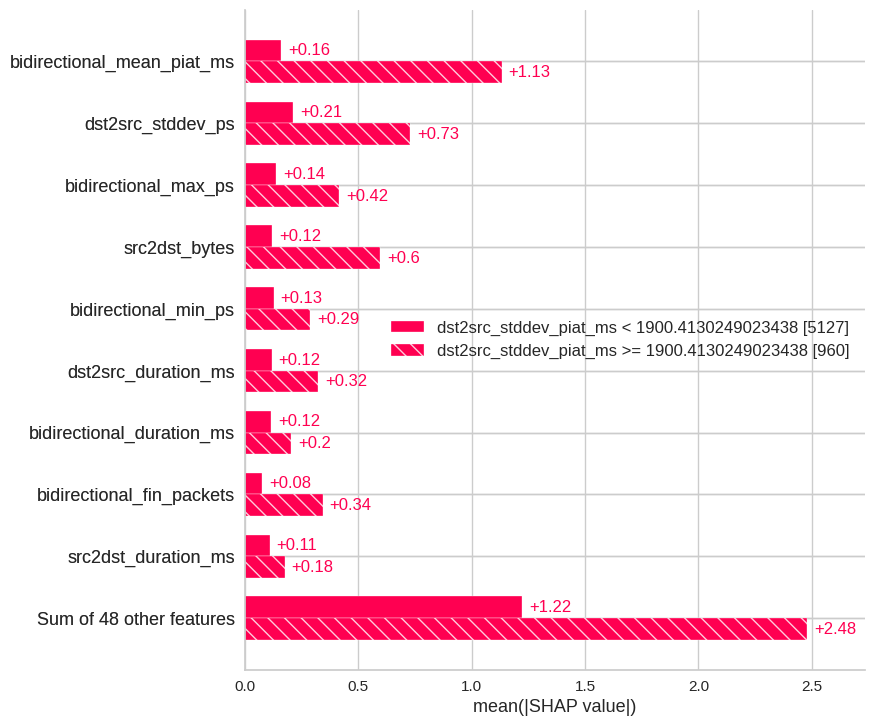

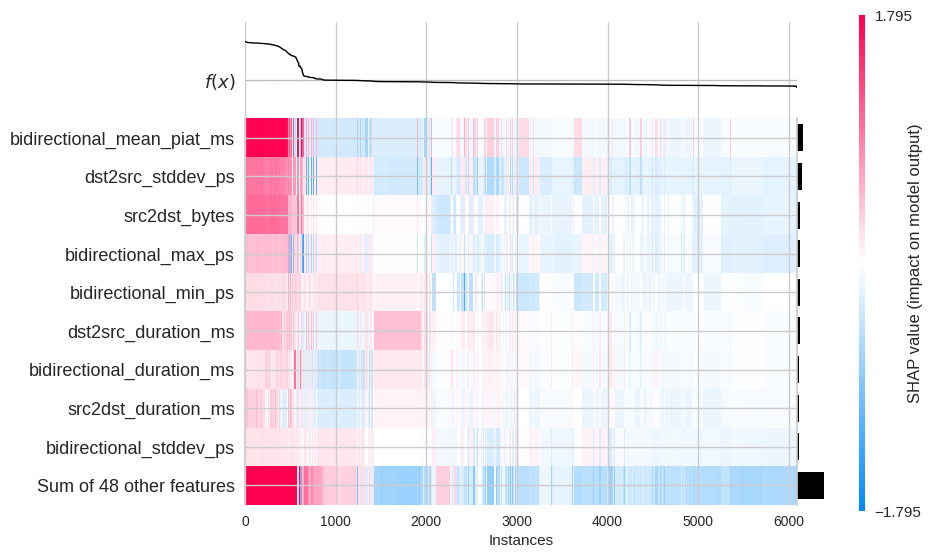

In [97]:
make_plot(3)

## DoS Hulk shap

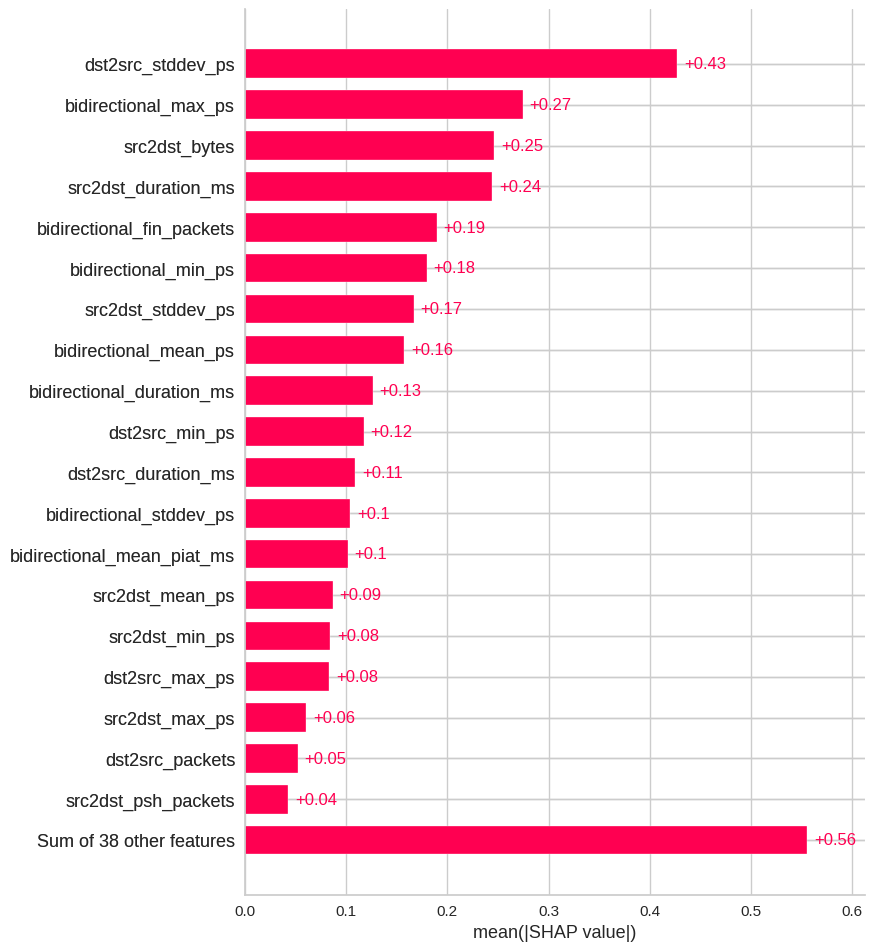

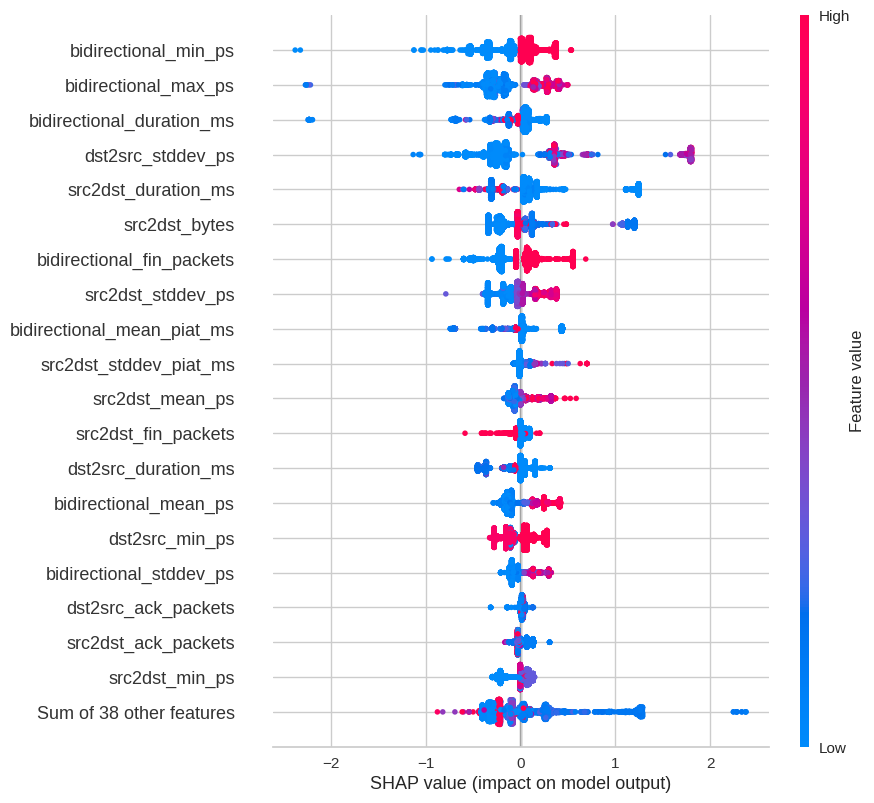

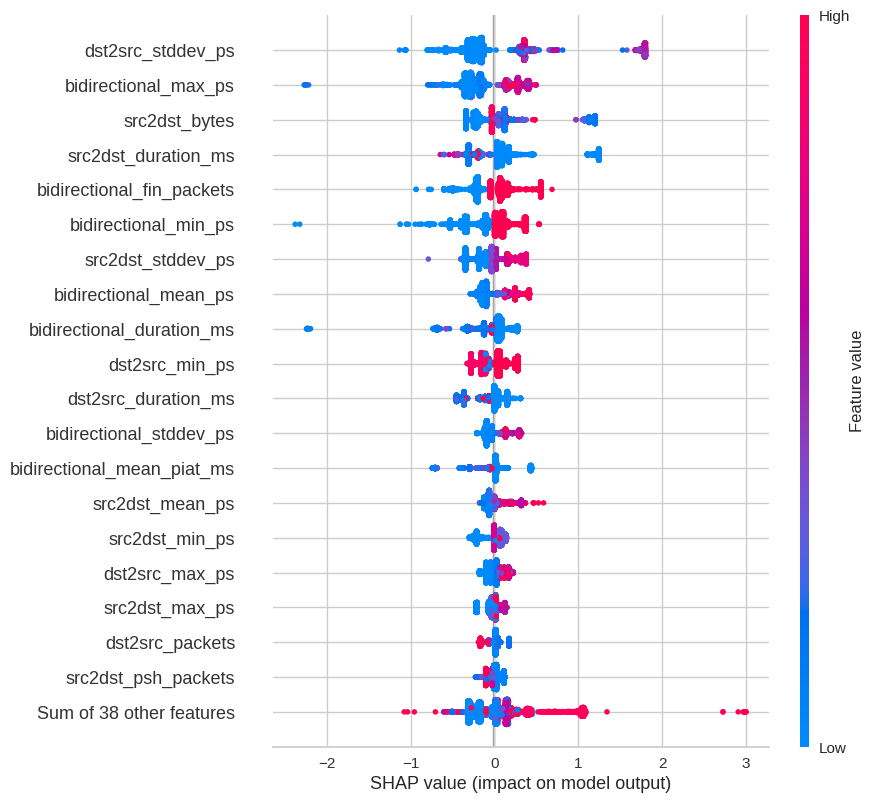

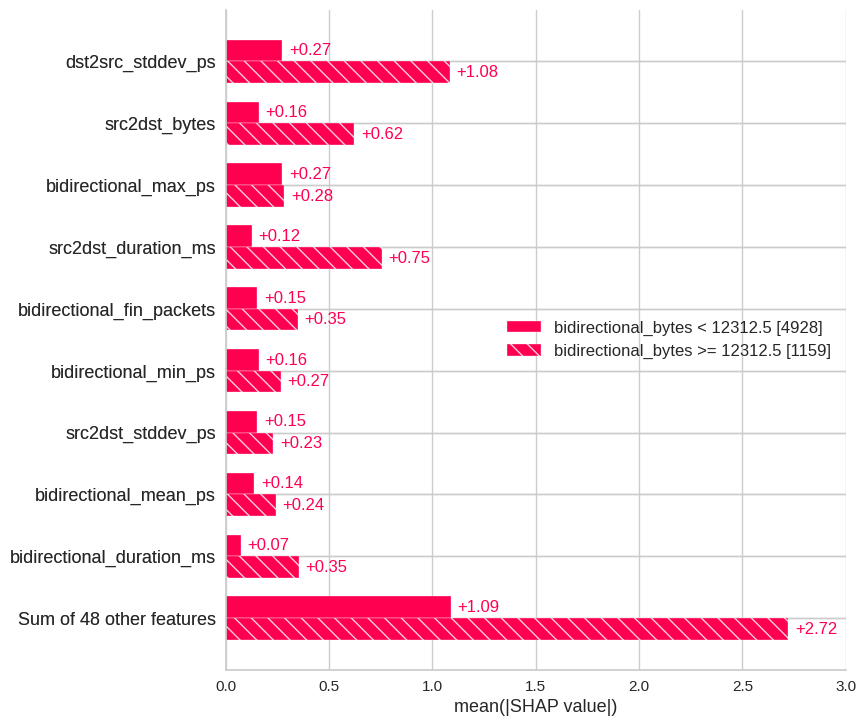

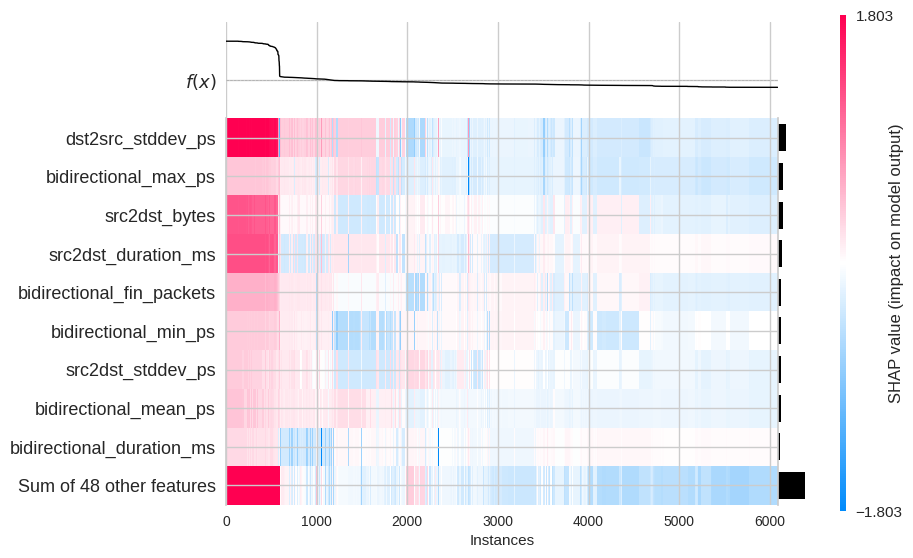

In [98]:
make_plot(4)

## DoS Slowhttptest shap

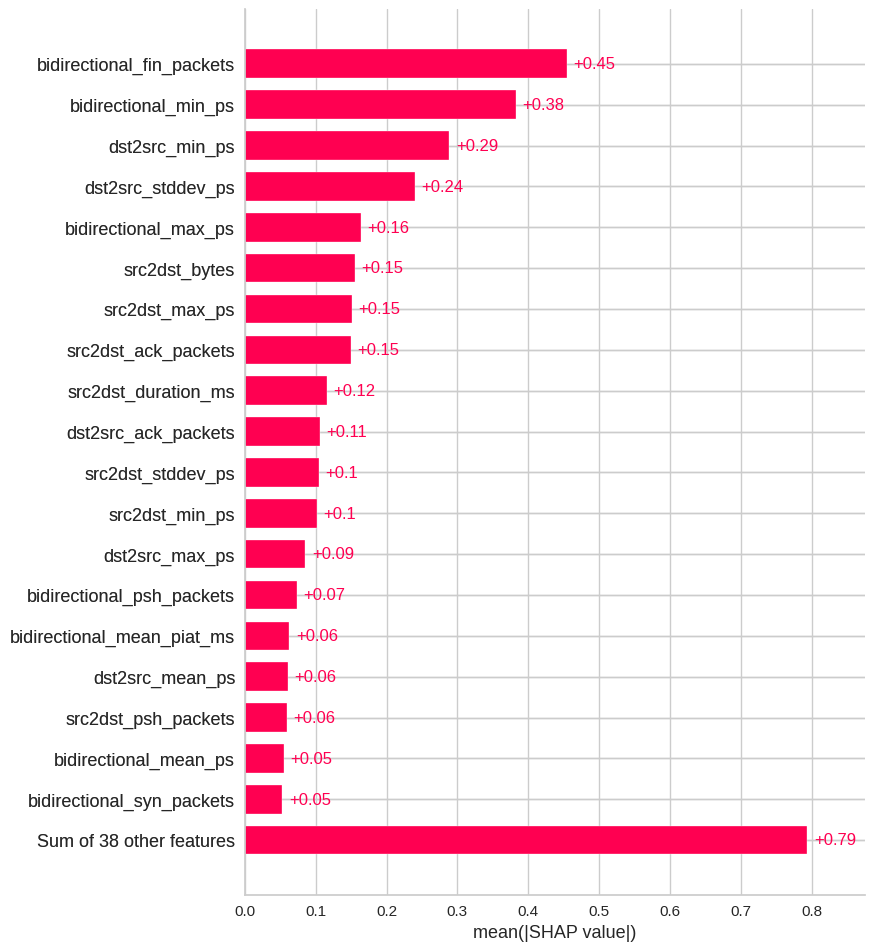

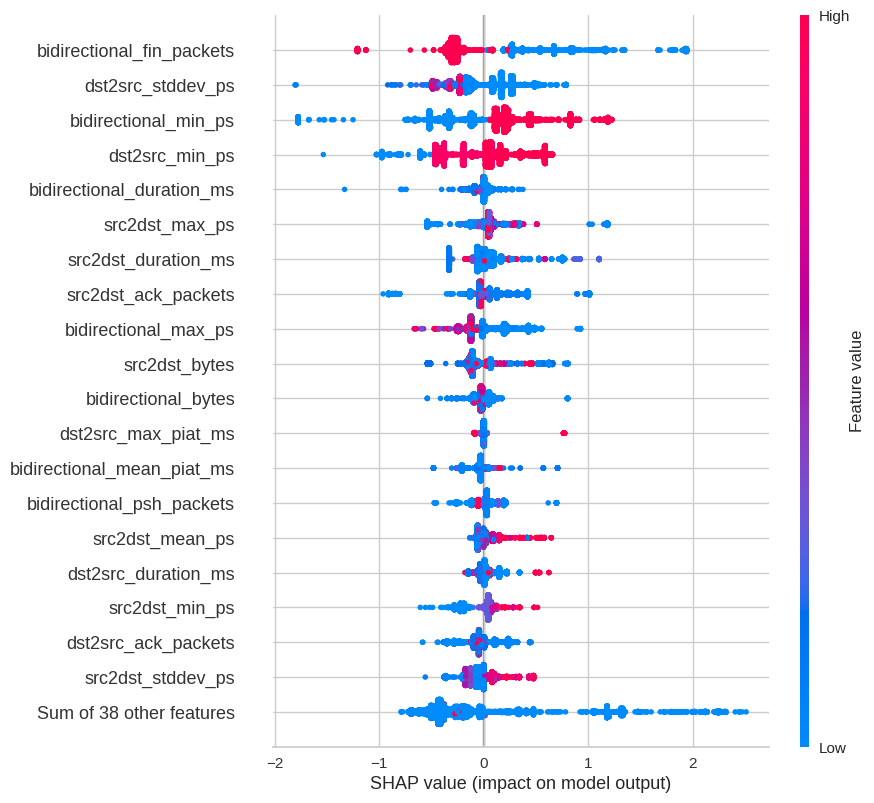

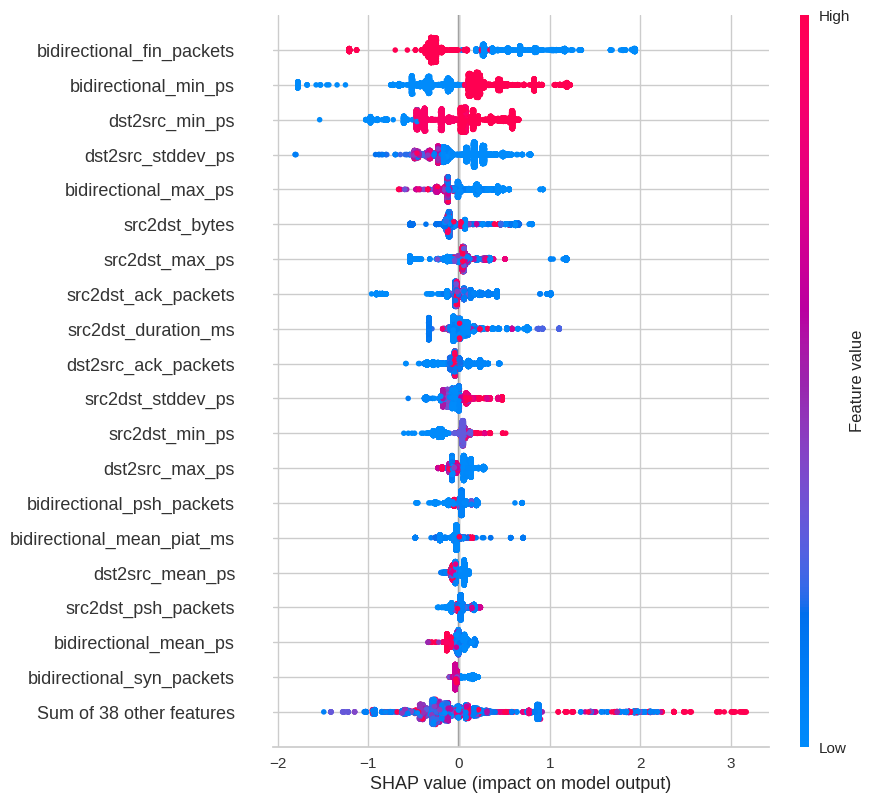

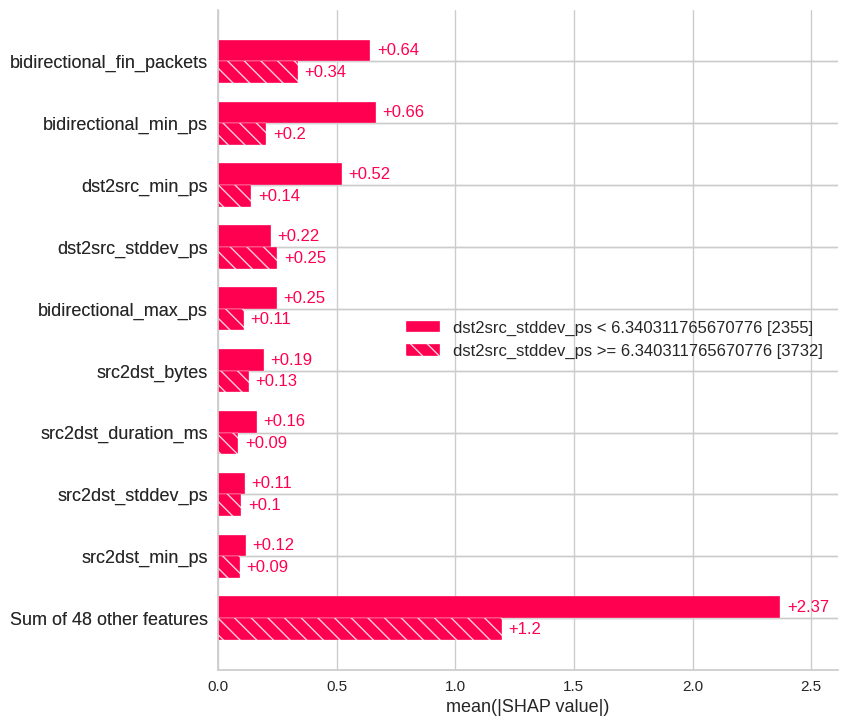

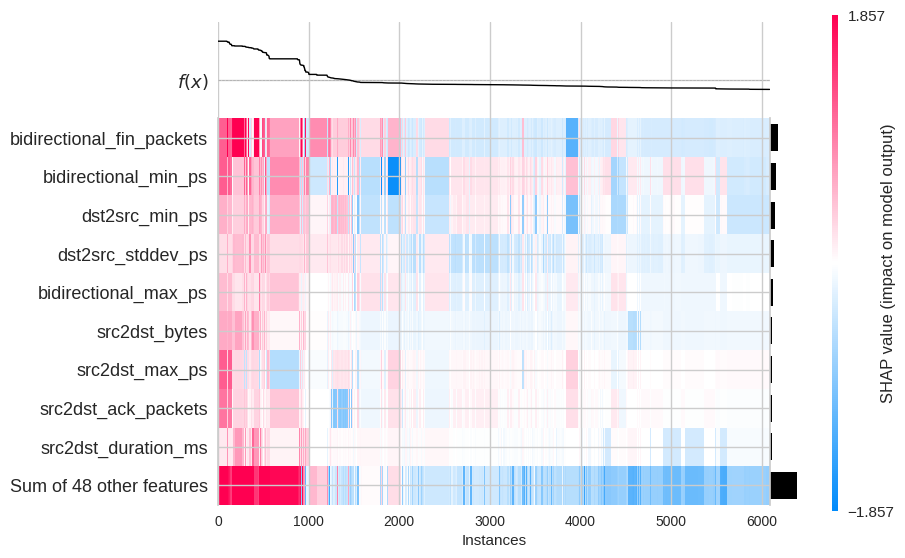

In [99]:
make_plot(5)

## DoS slowloris shap

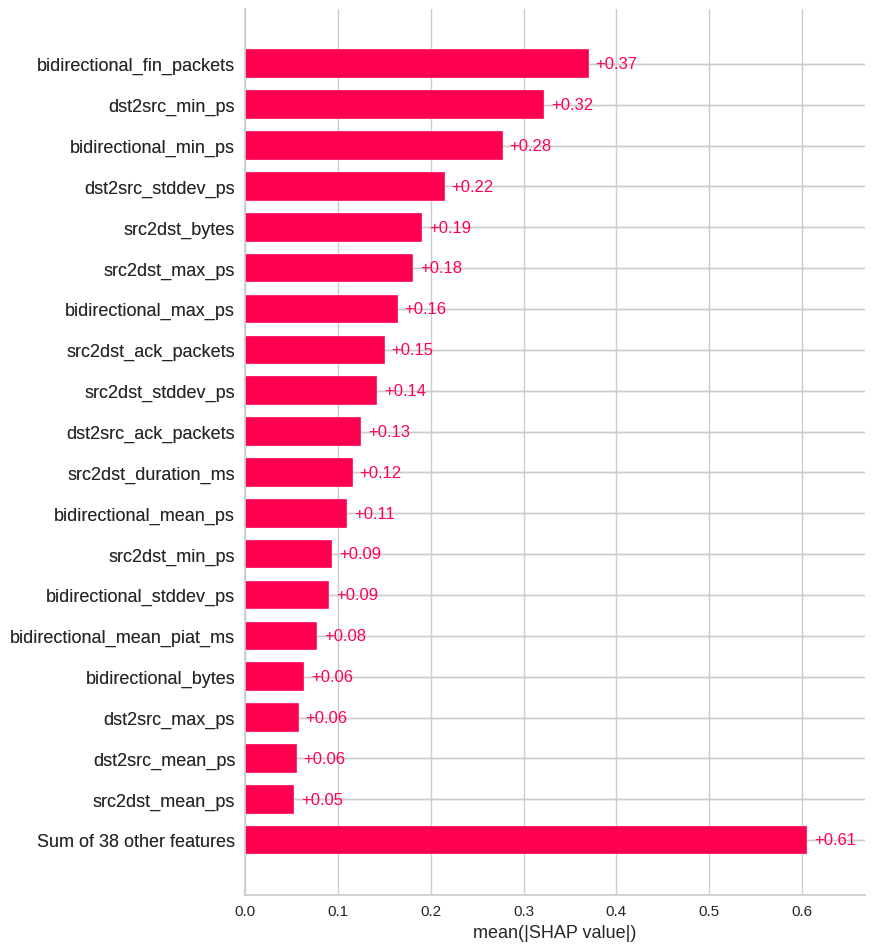

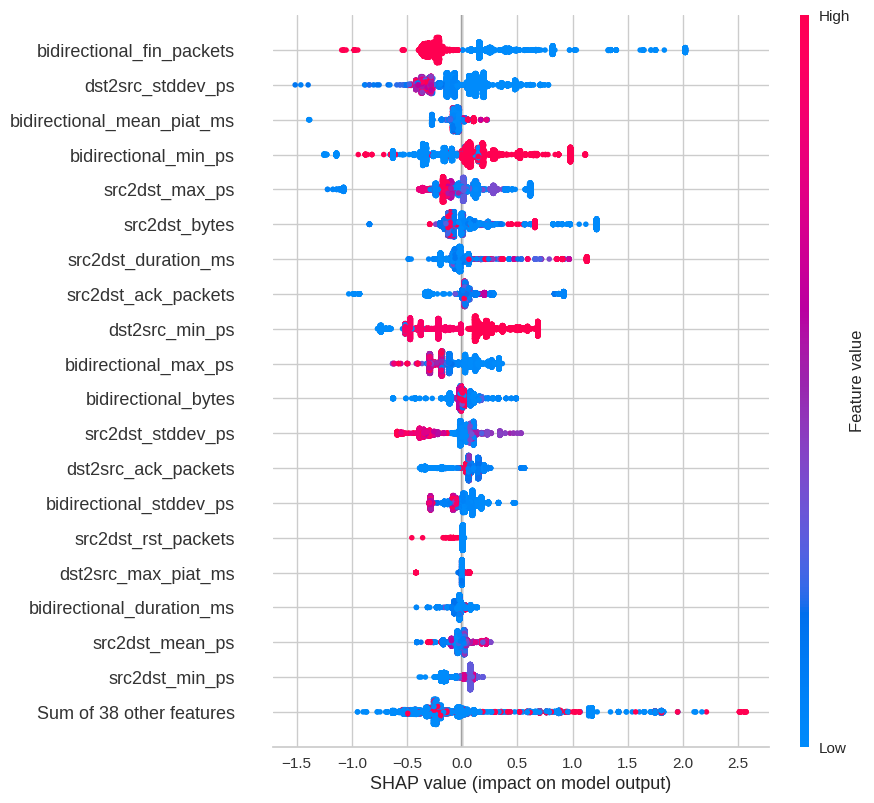

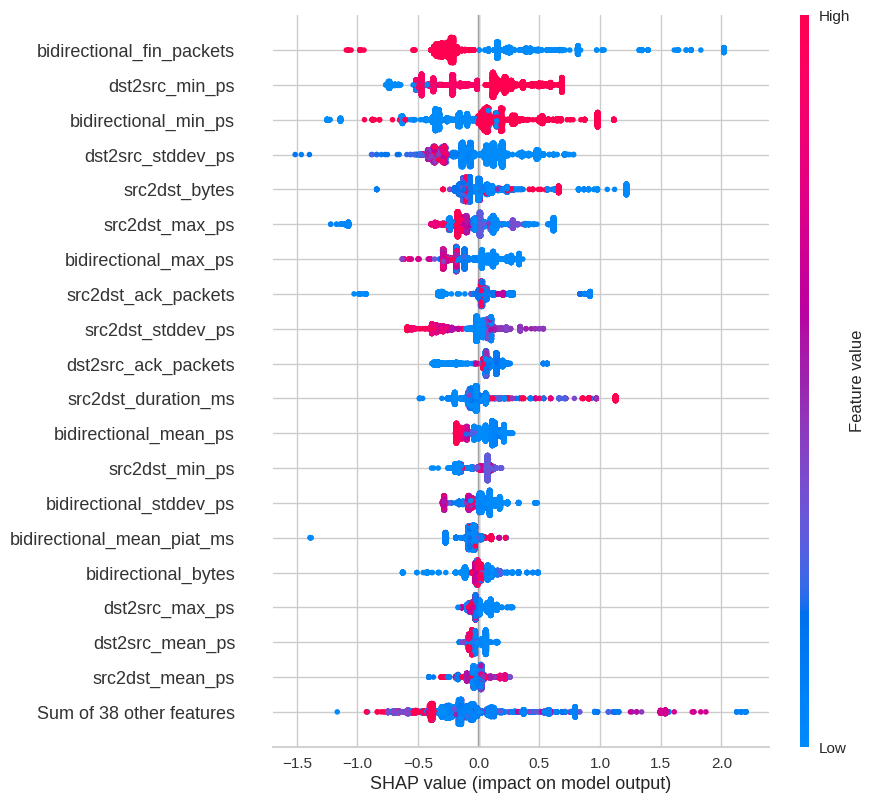

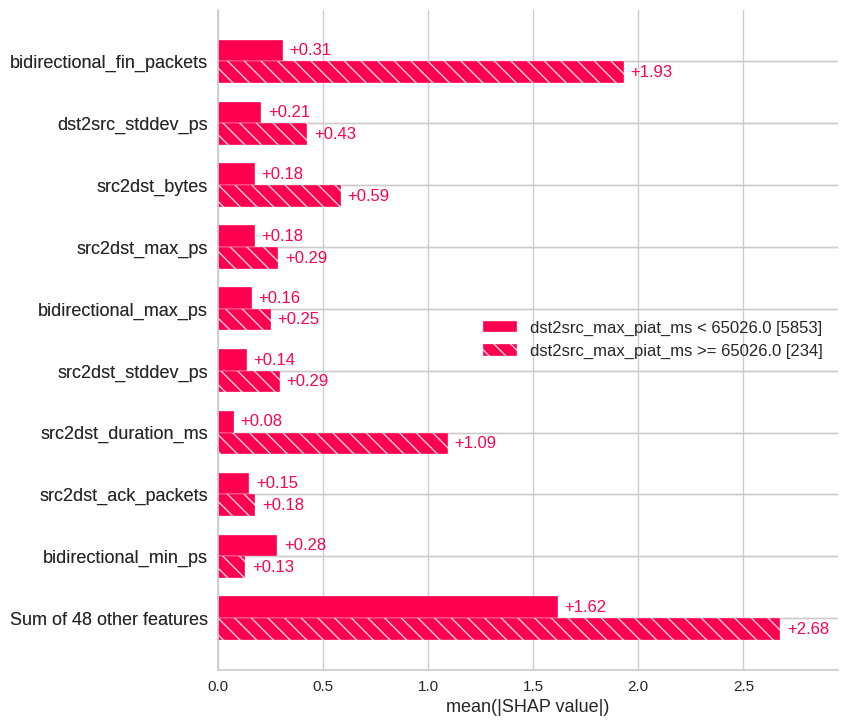

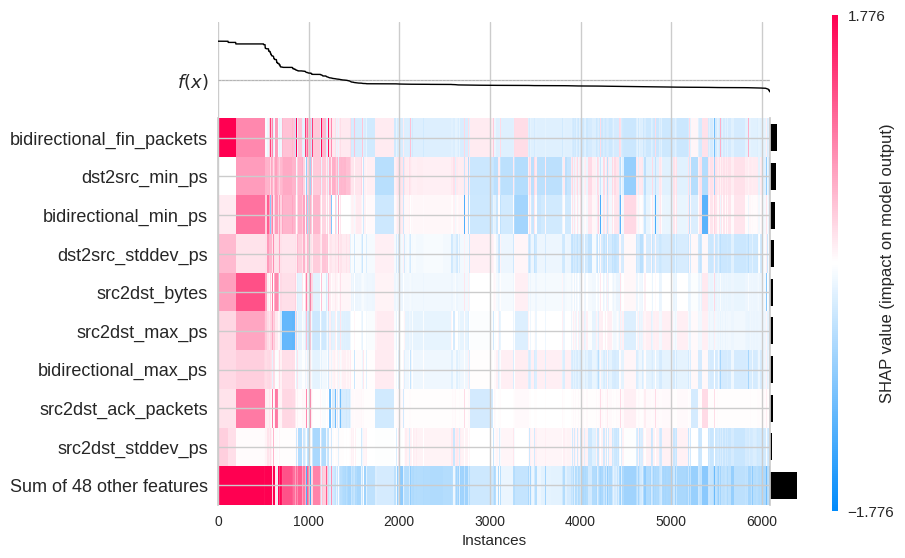

In [100]:
make_plot(6)

## FTP-Patator shap

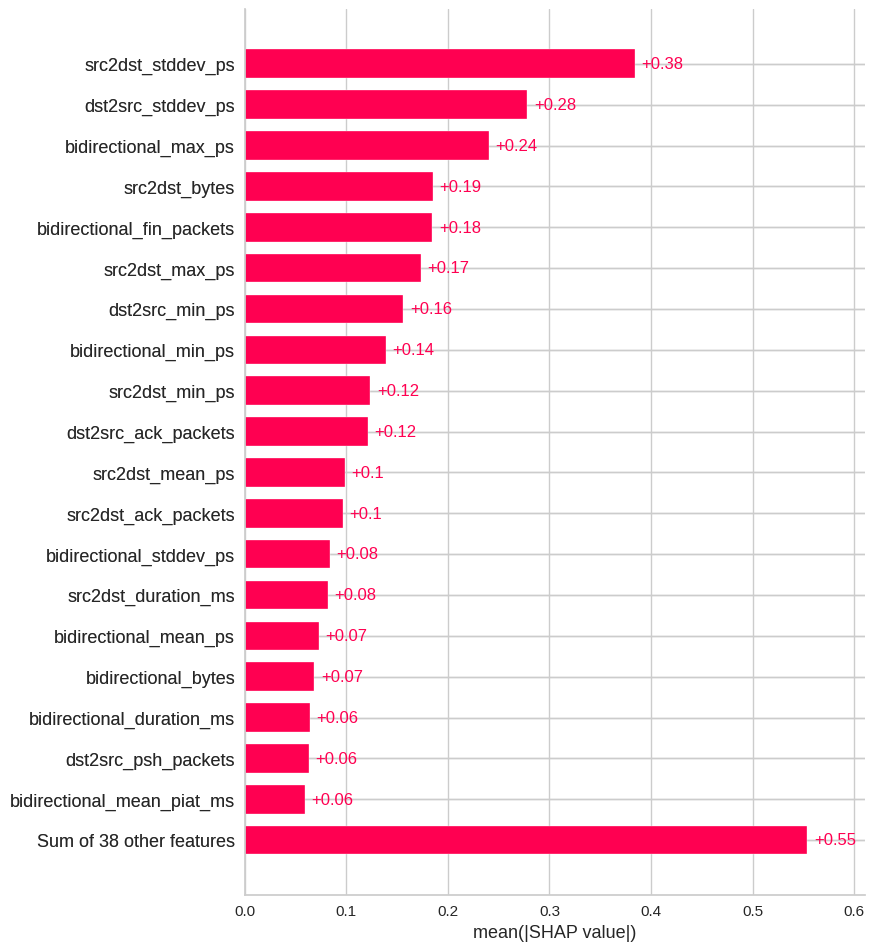

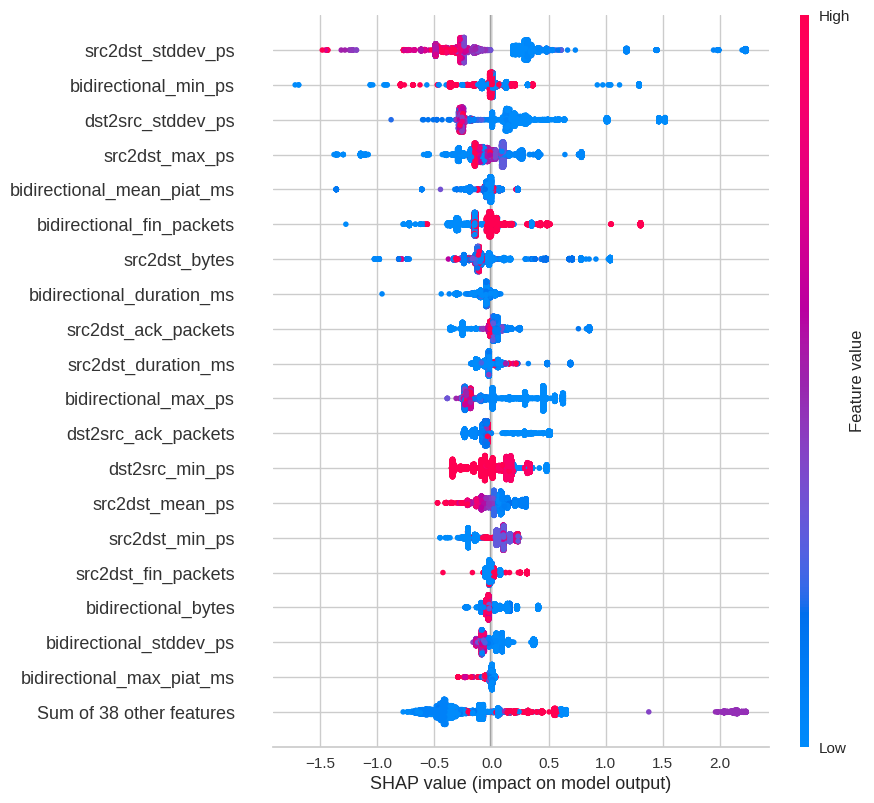

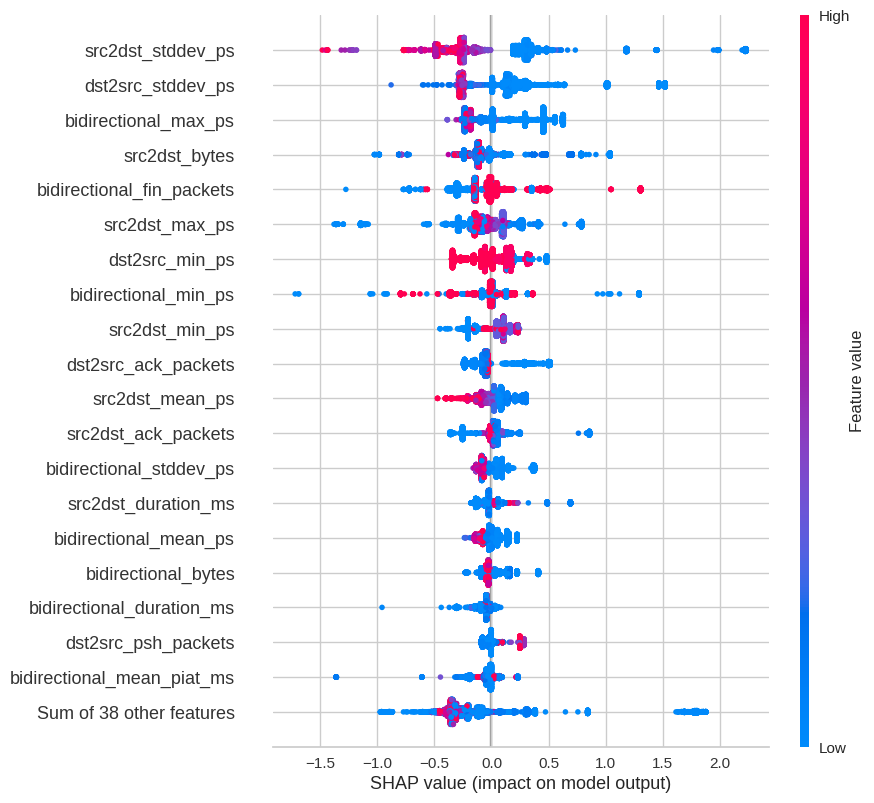

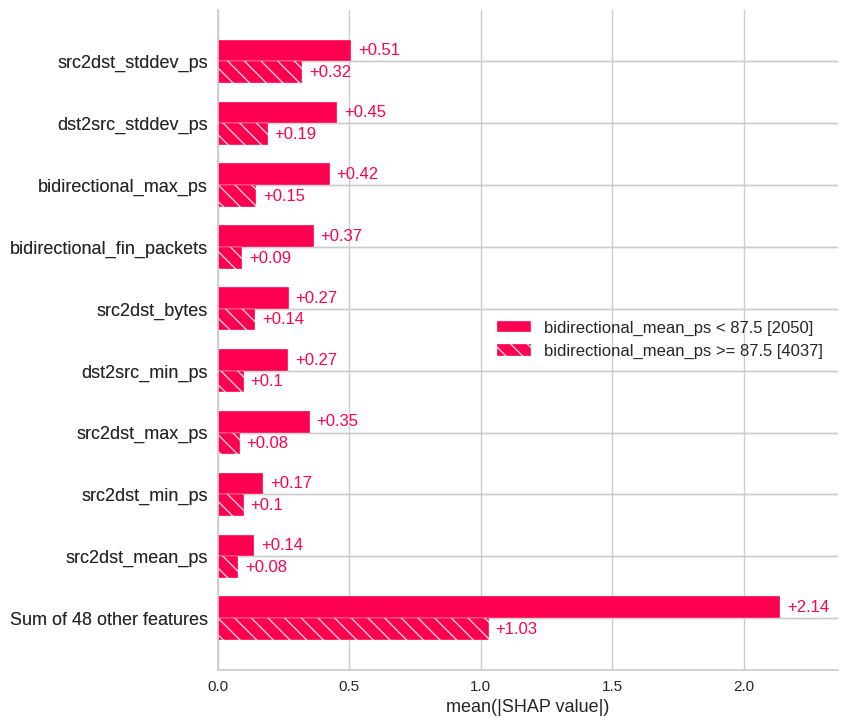

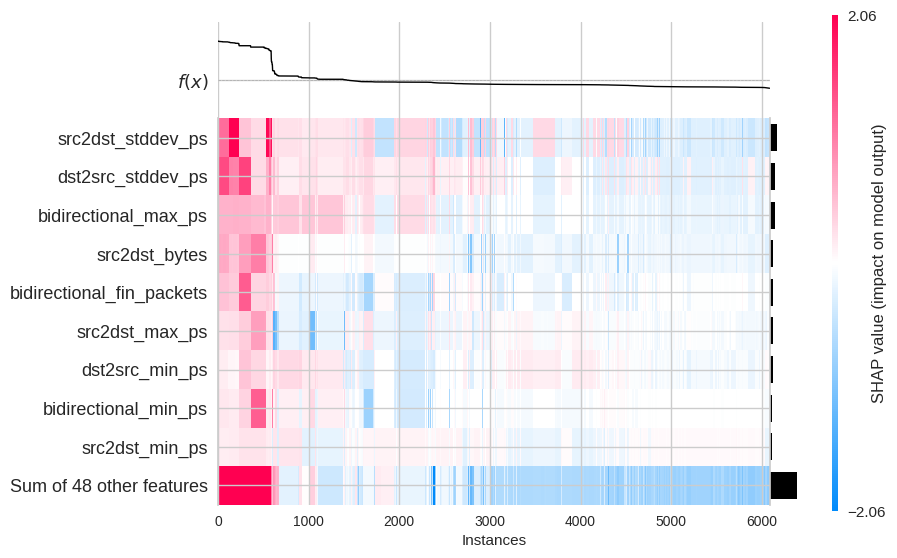

In [101]:
make_plot(7)

## Heartbleed shap

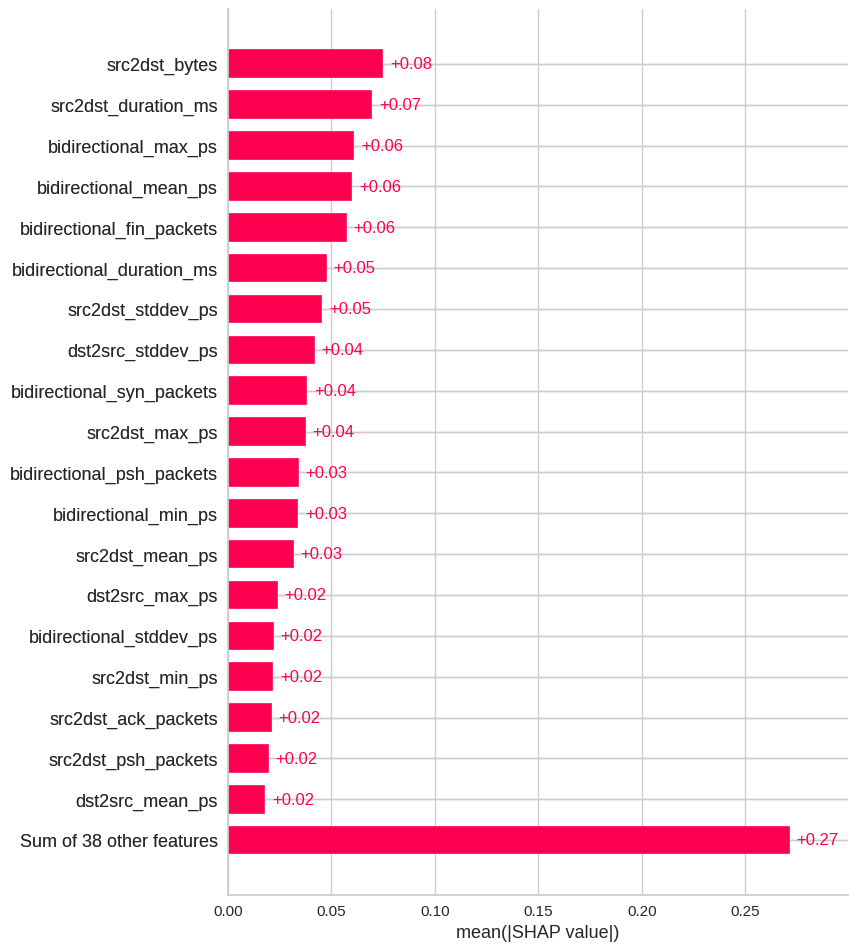

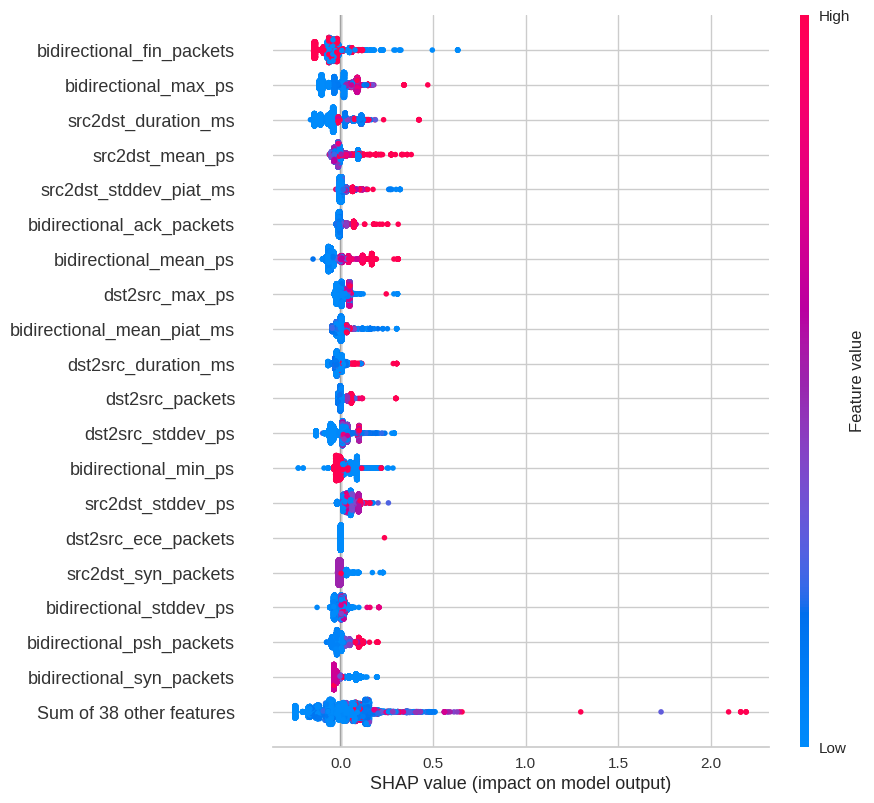

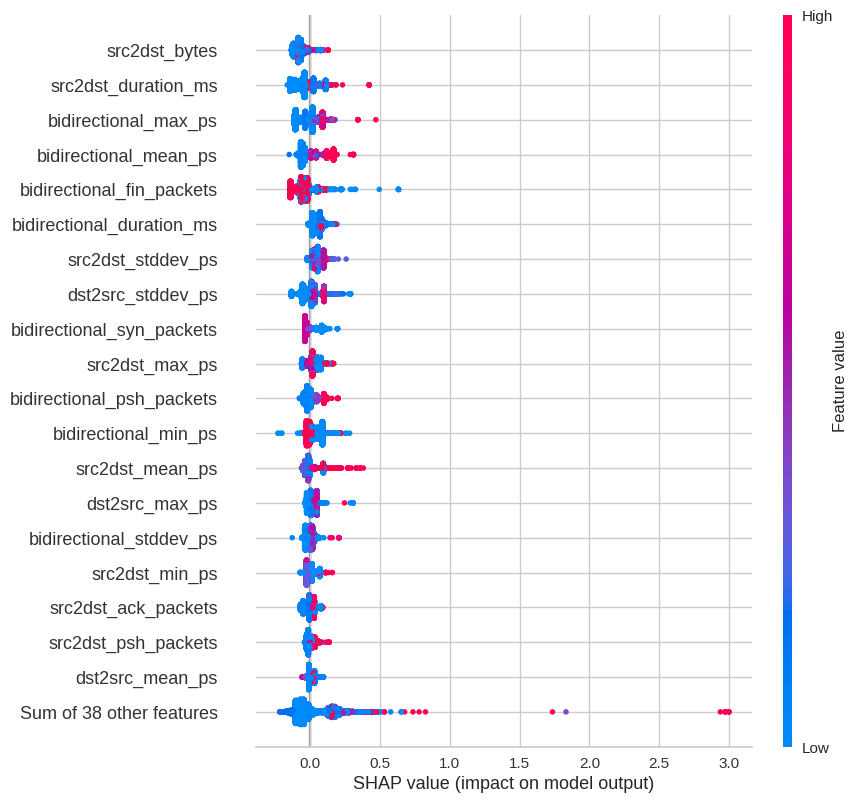

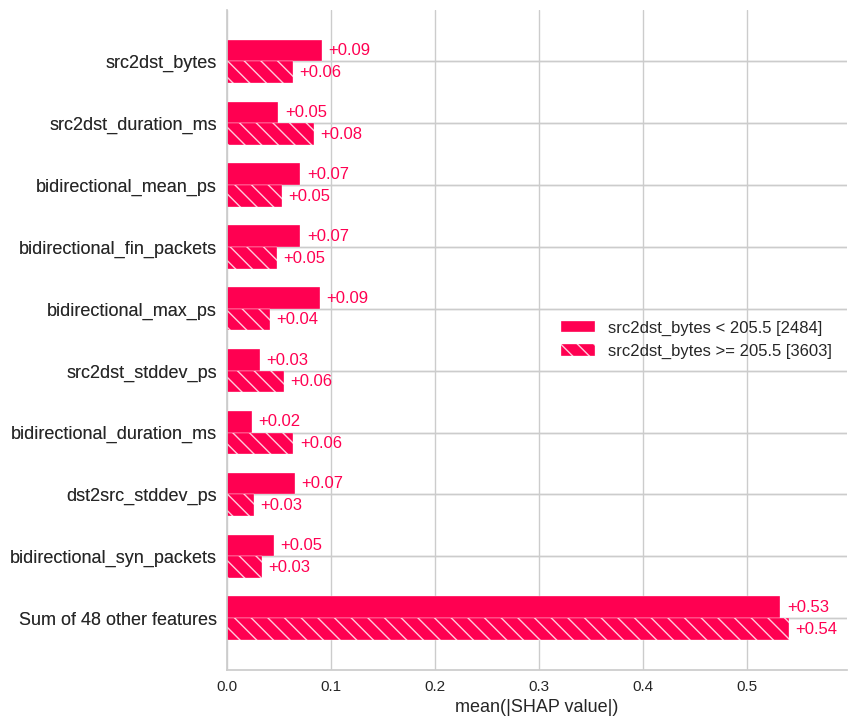

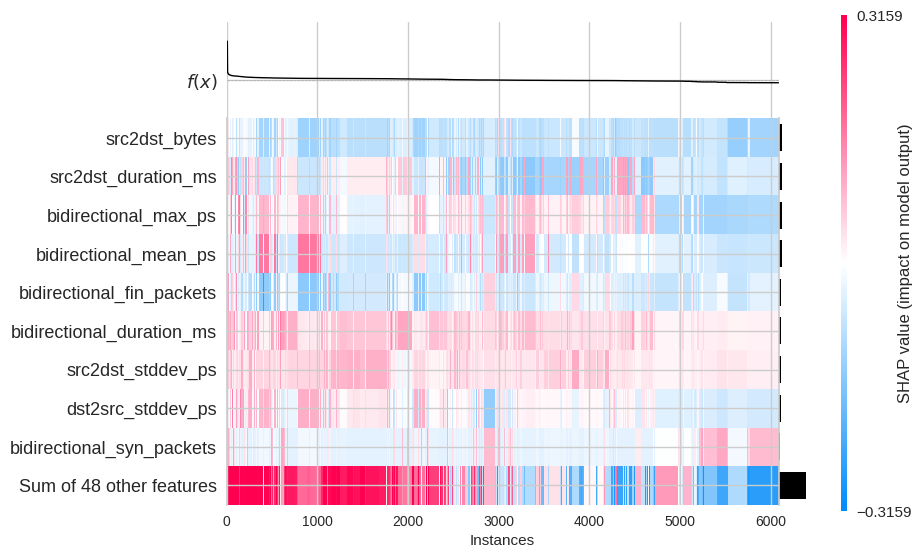

In [102]:
make_plot(8)

## Infiltration shap

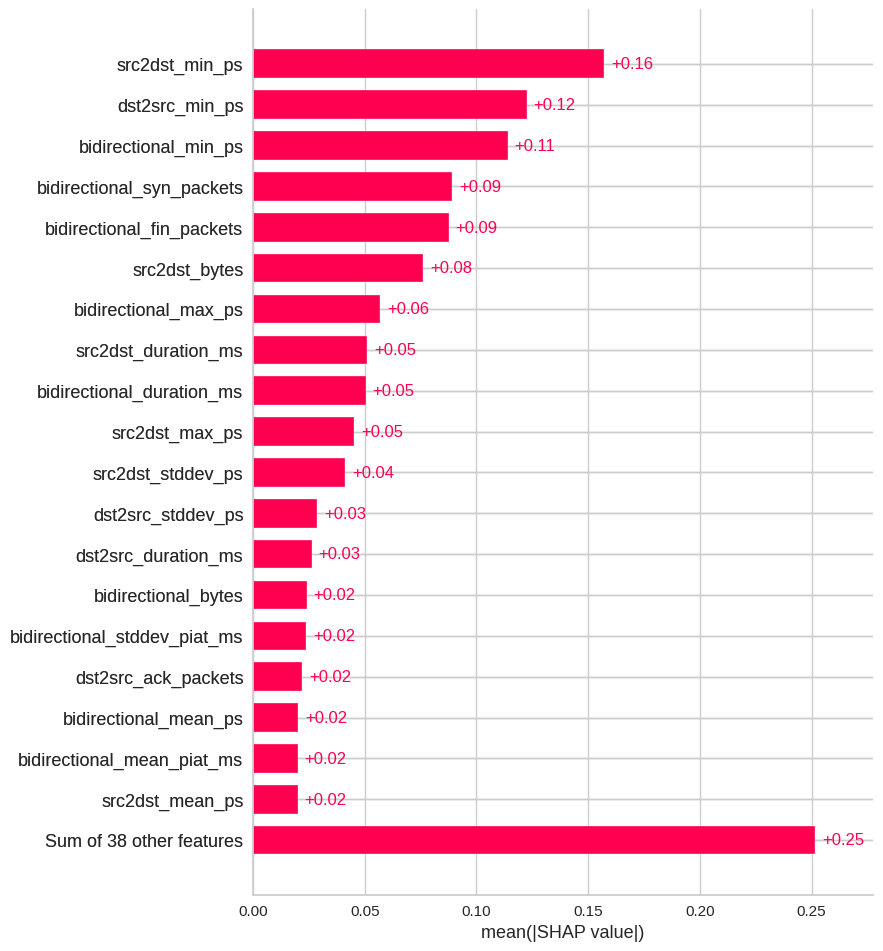

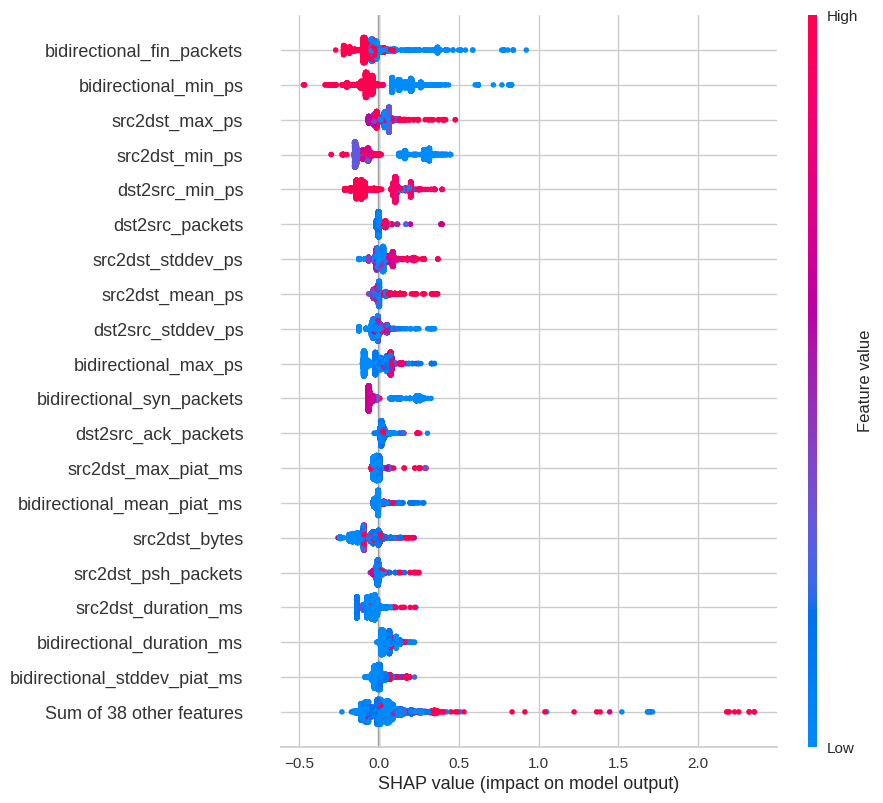

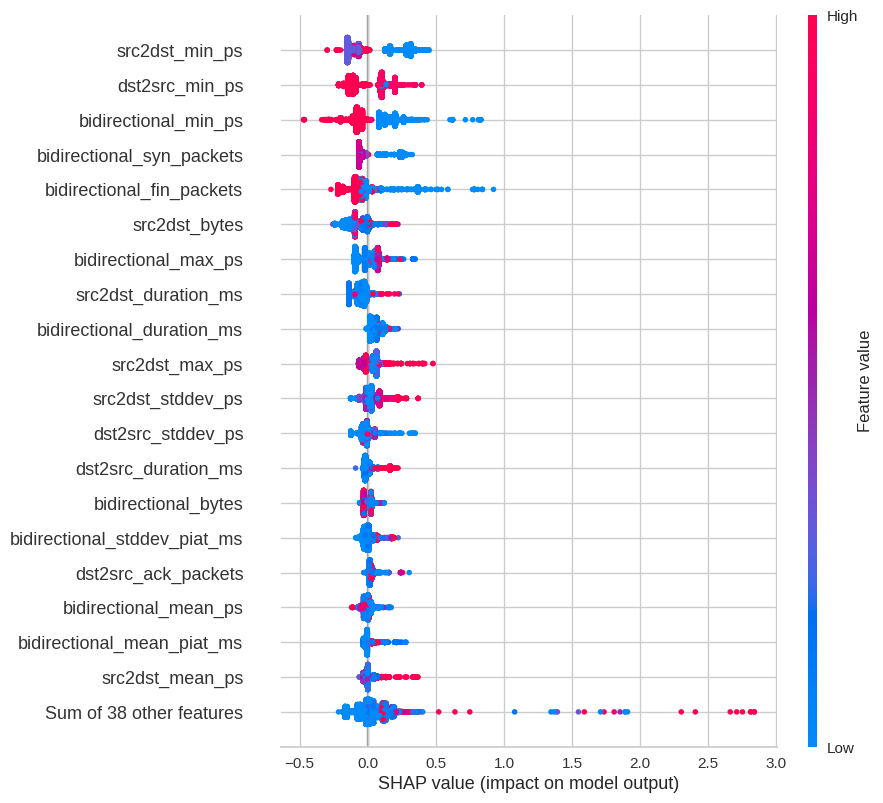

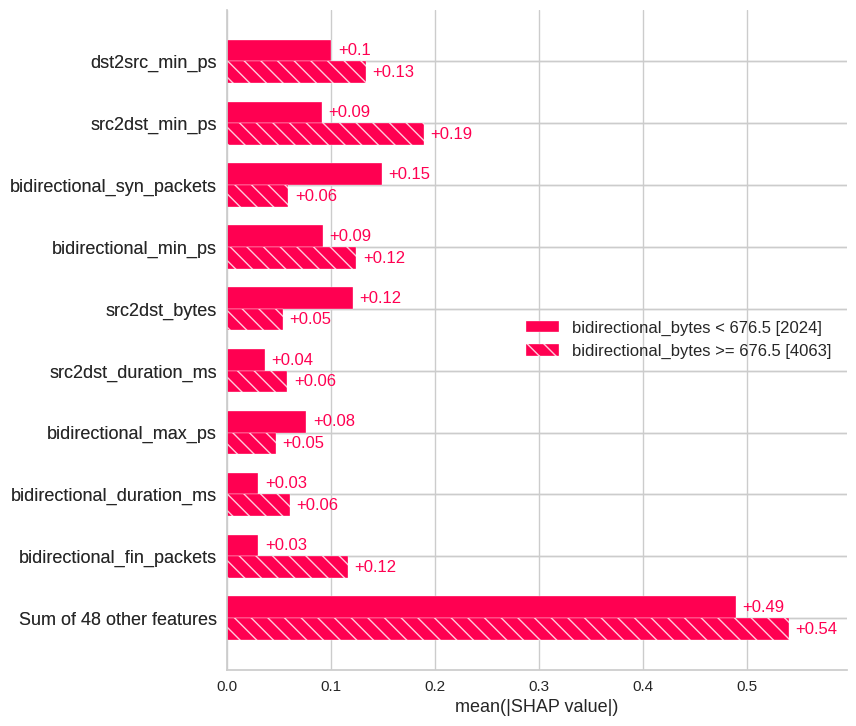

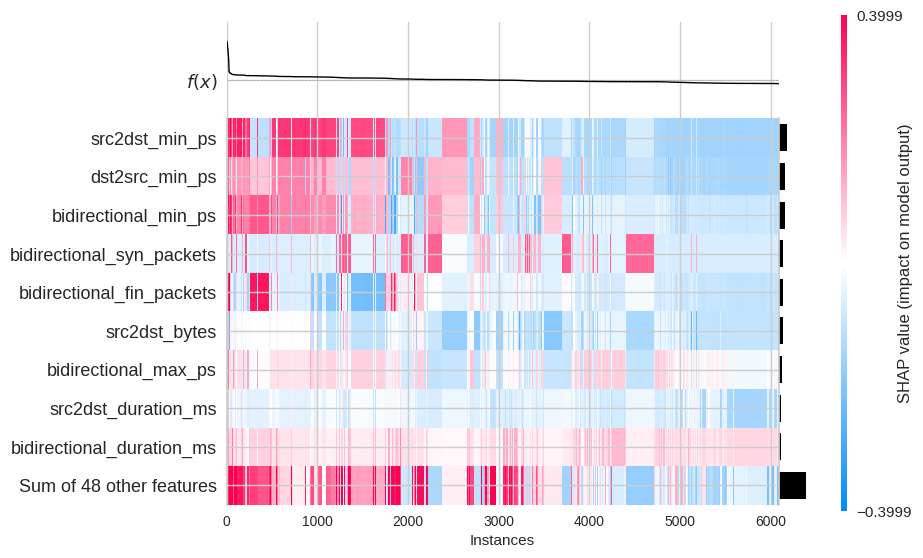

In [103]:
make_plot(9)

## PortScan shap

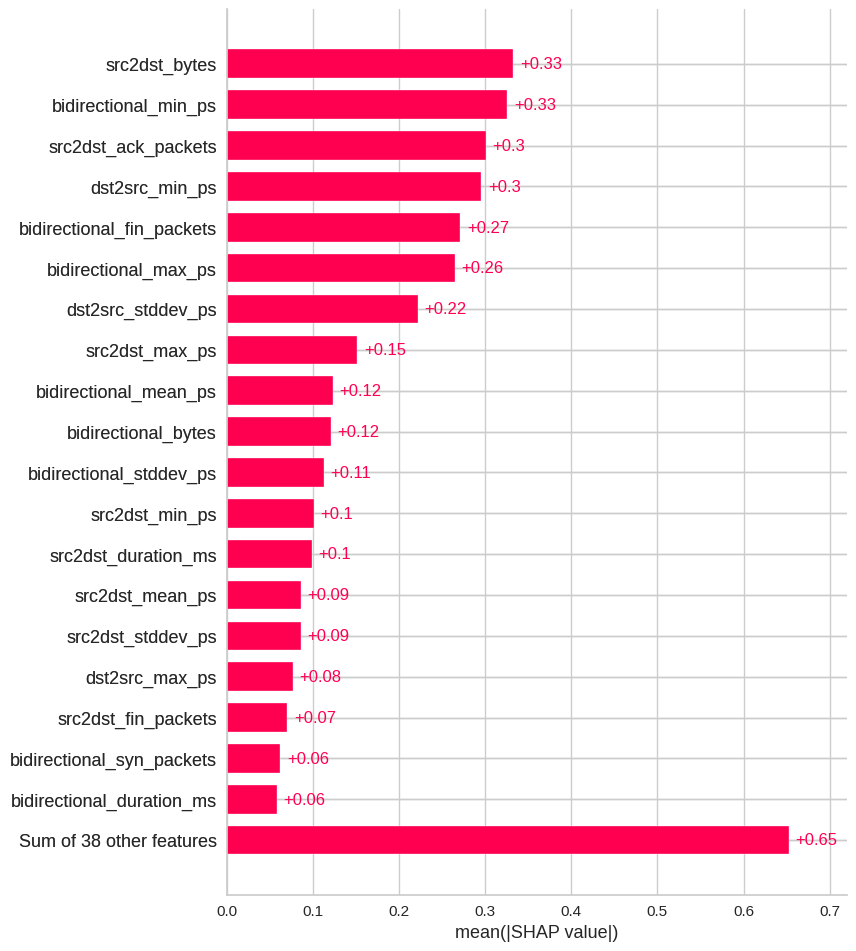

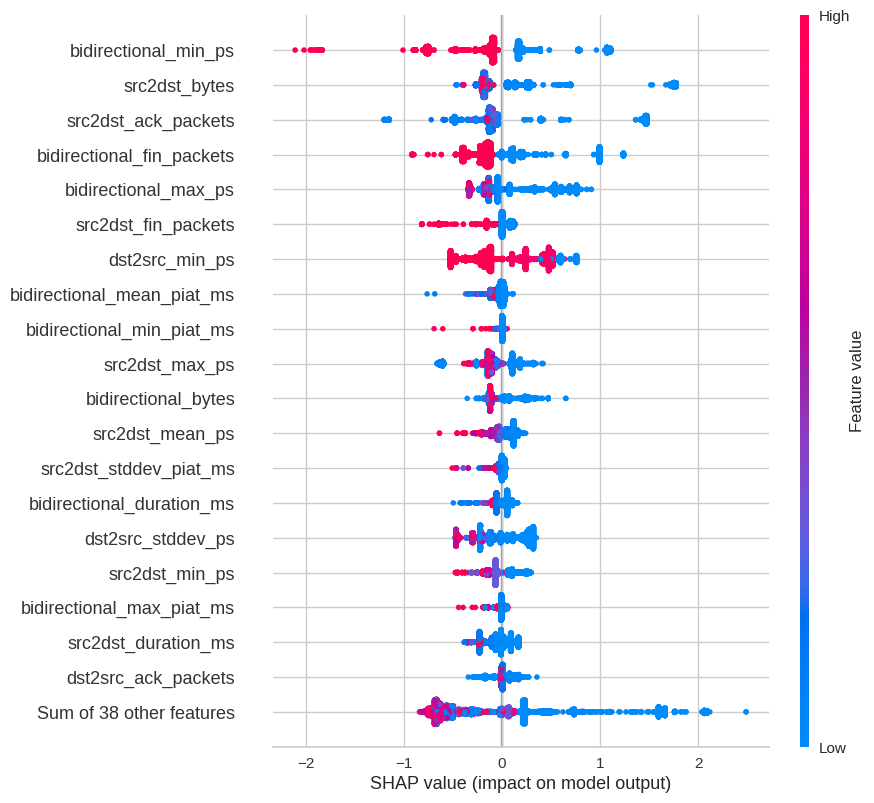

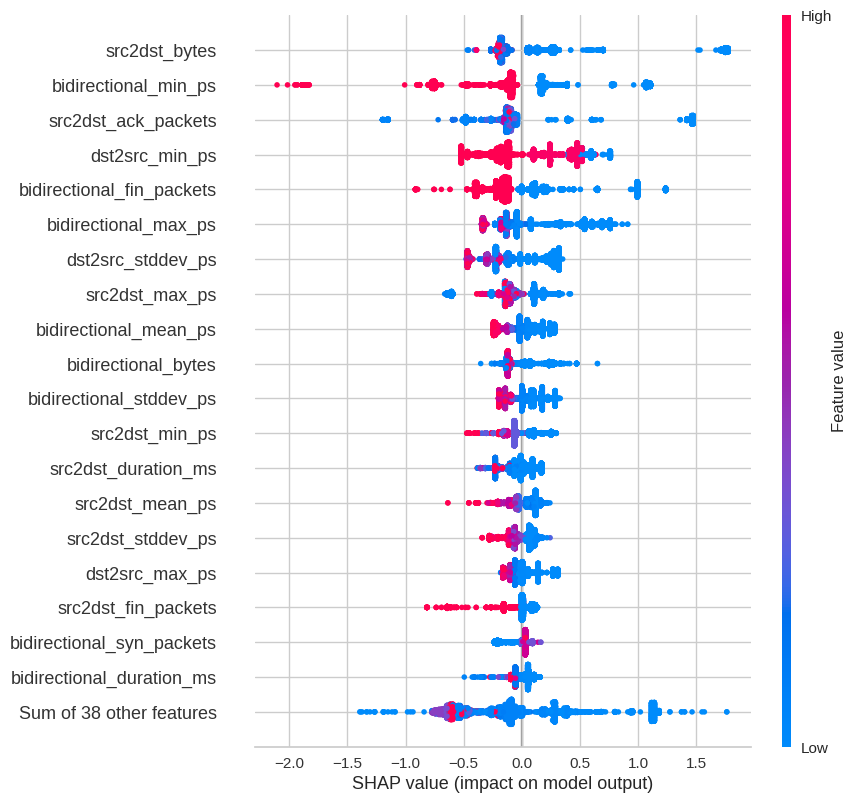

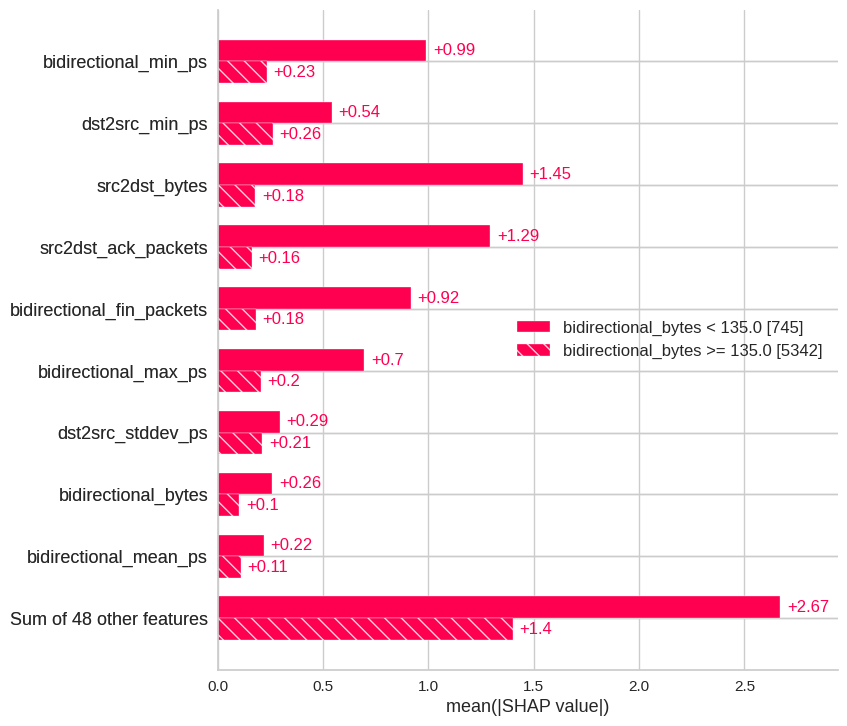

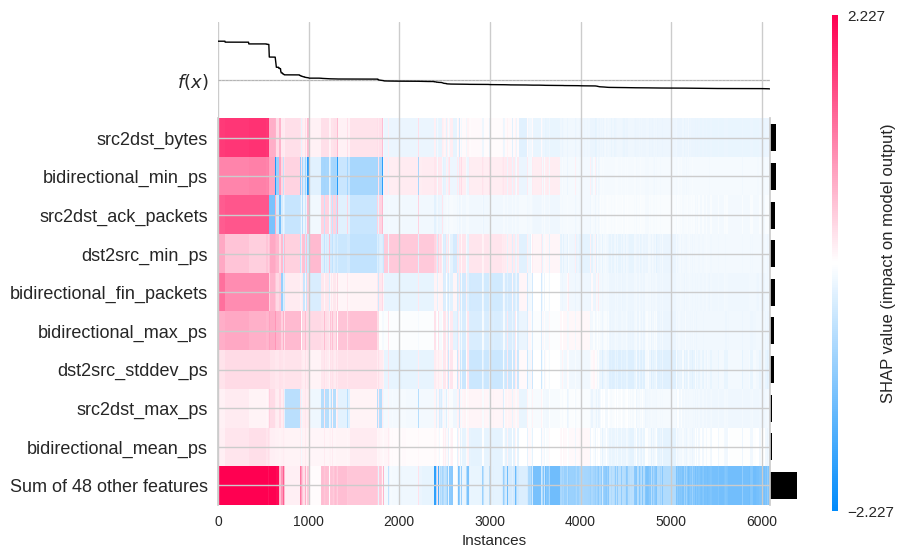

In [104]:
make_plot(10)

## SSH-Patator shap

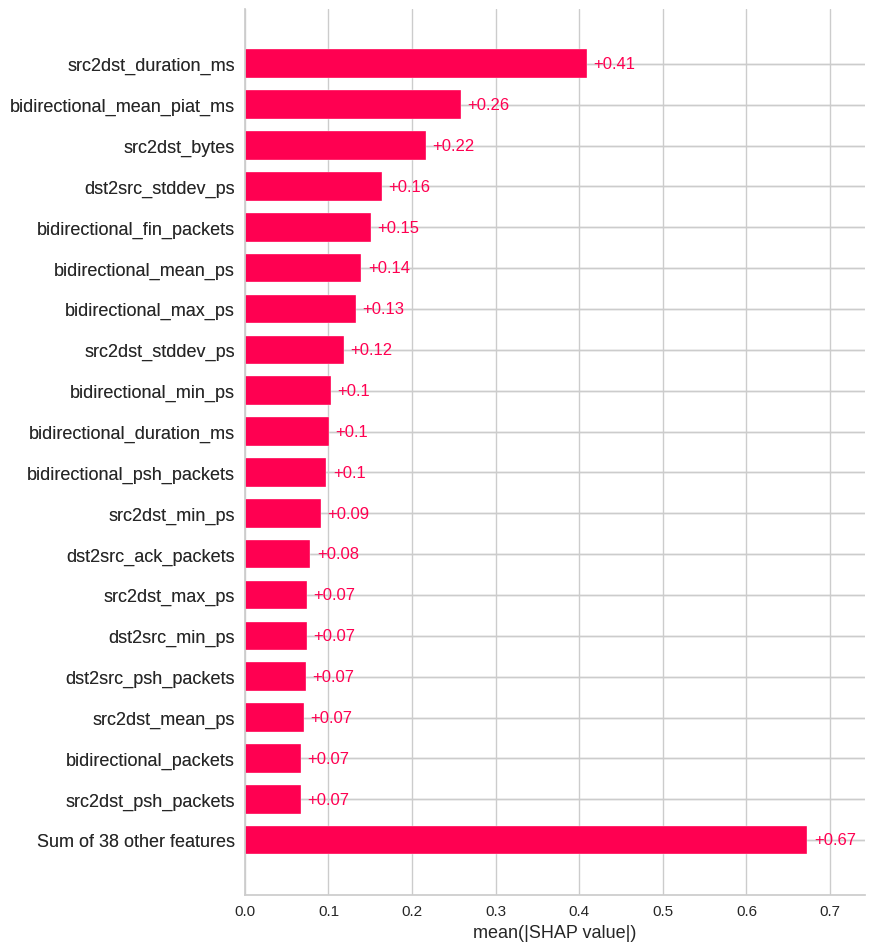

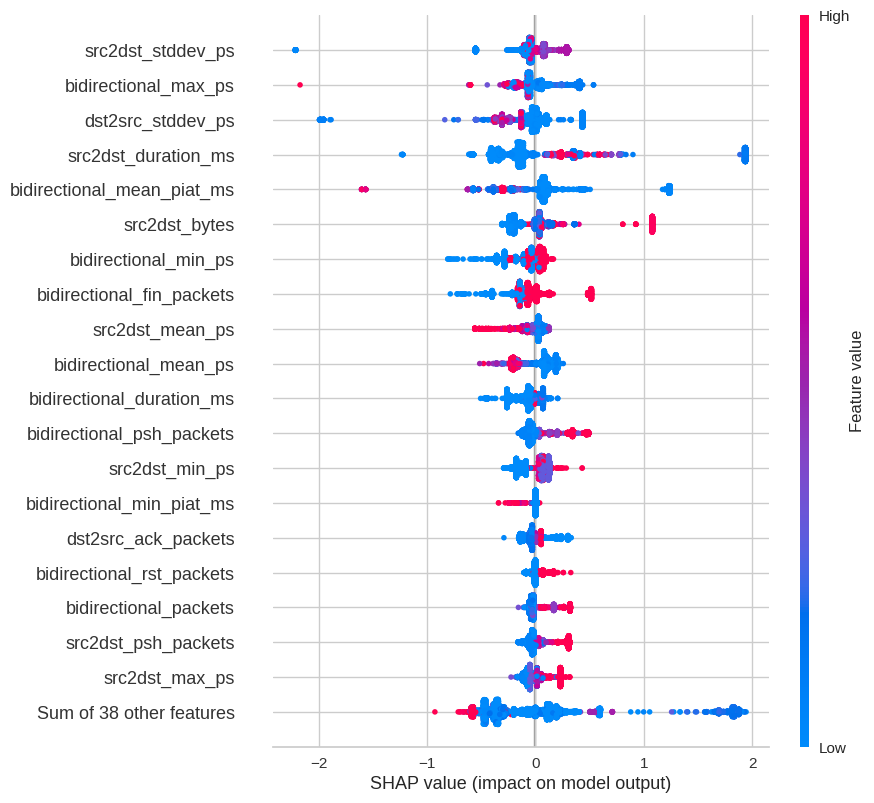

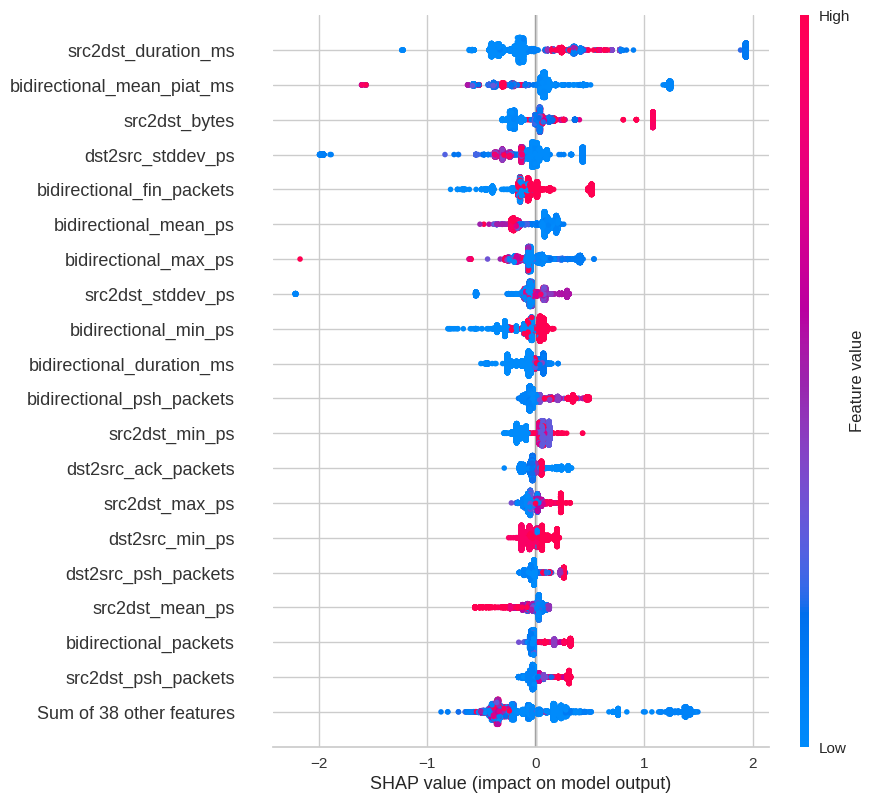

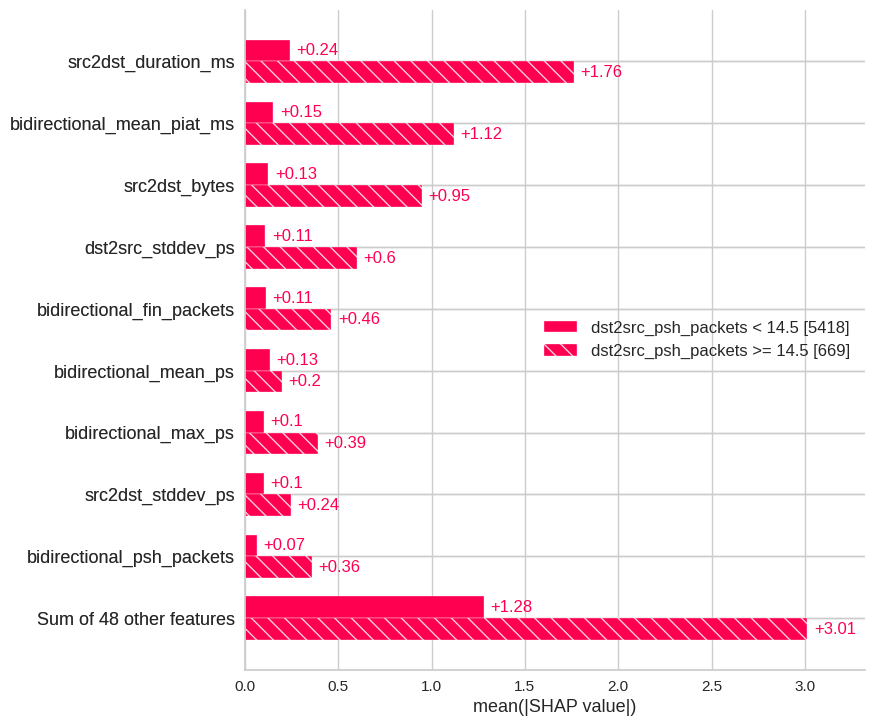

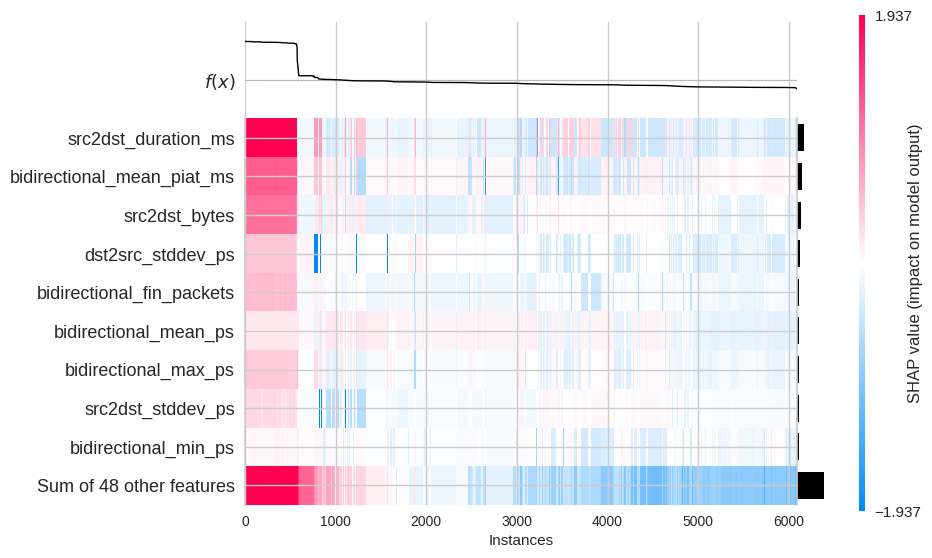

In [105]:
make_plot(11)

## Web Attack - Brute Force shap

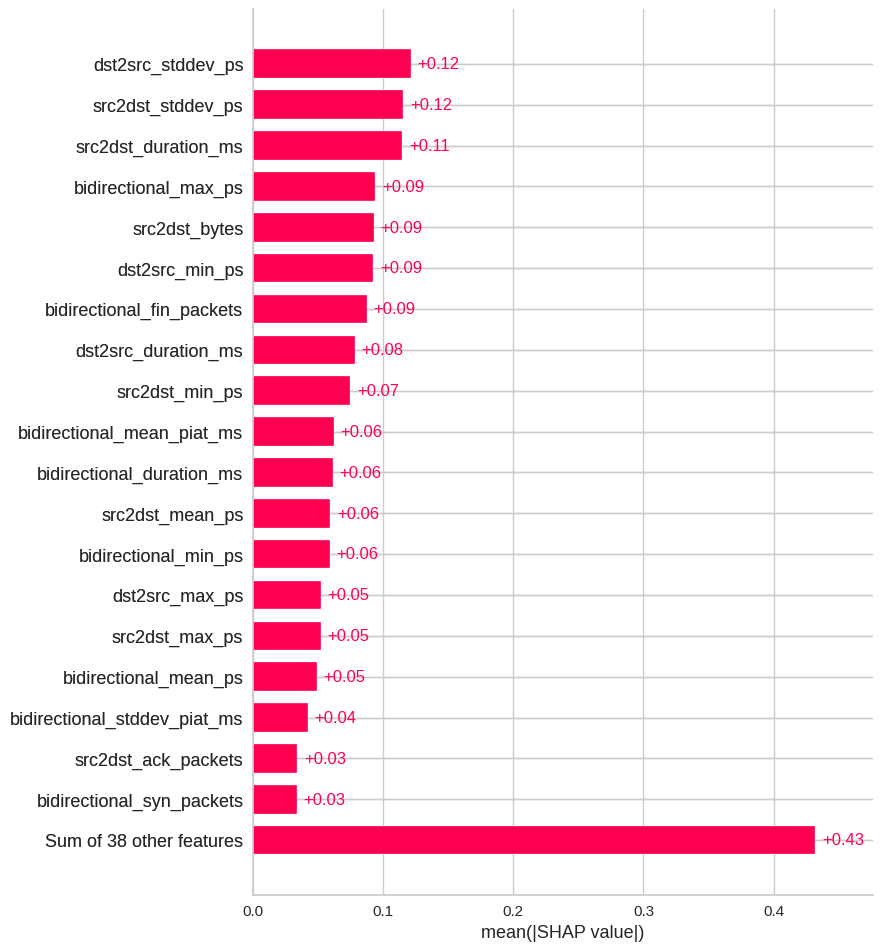

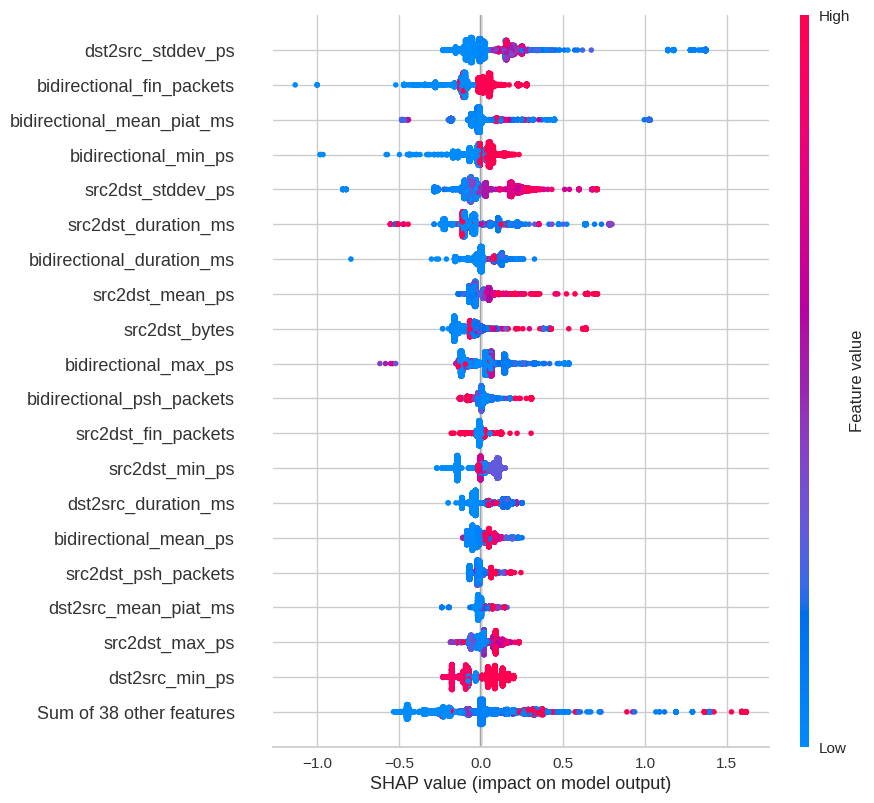

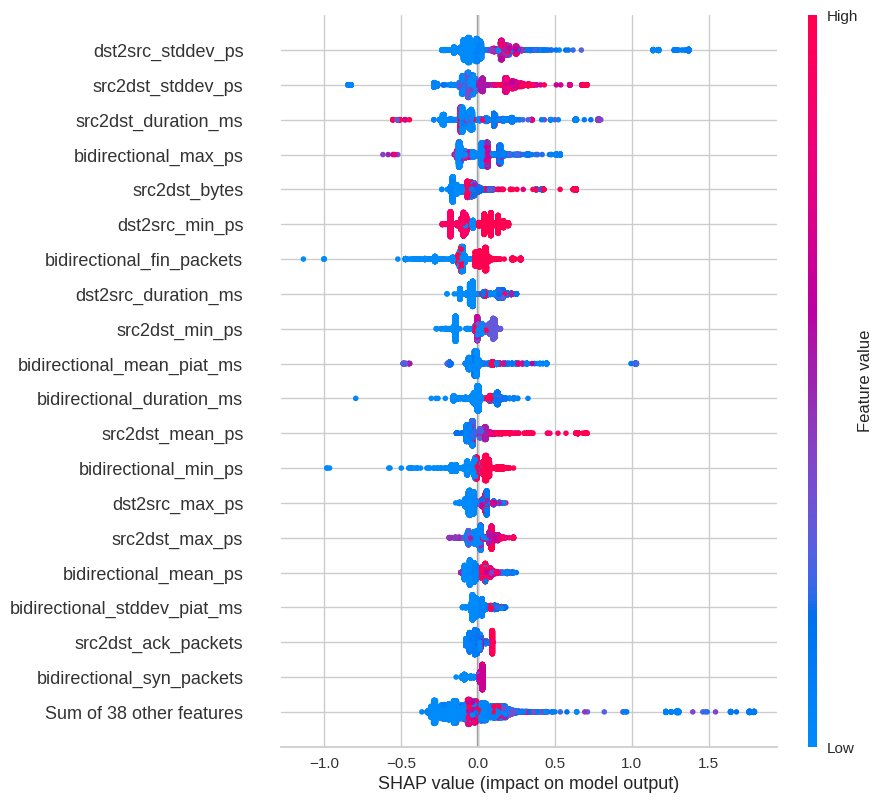

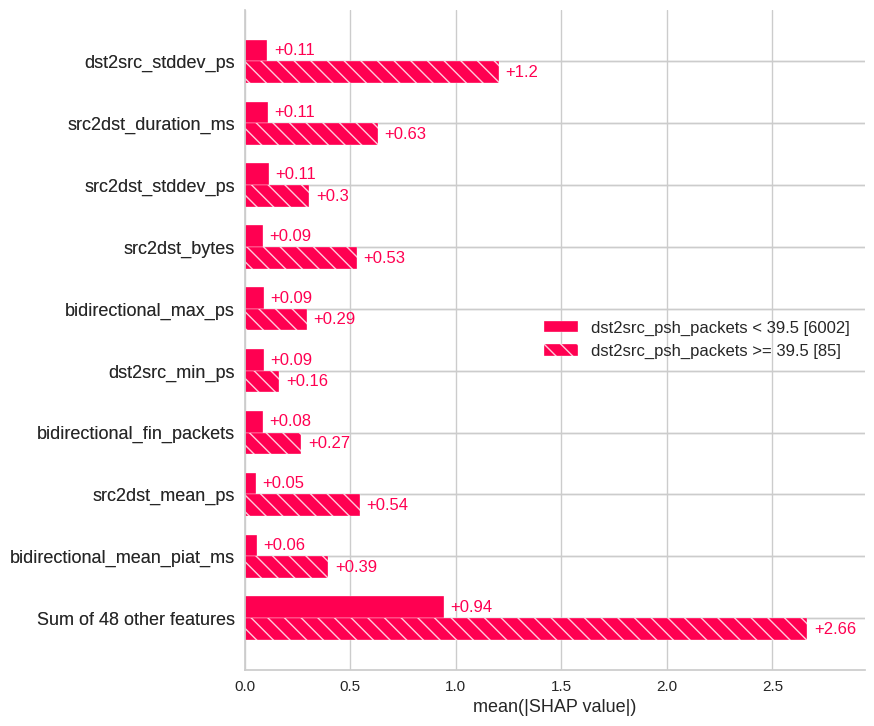

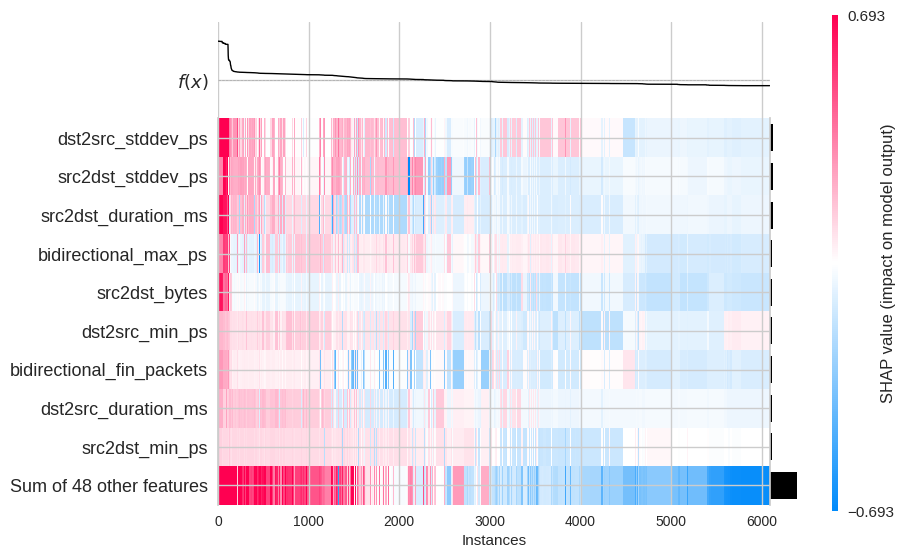

In [106]:
make_plot(12)

## Web Attack - Sql Injection shap

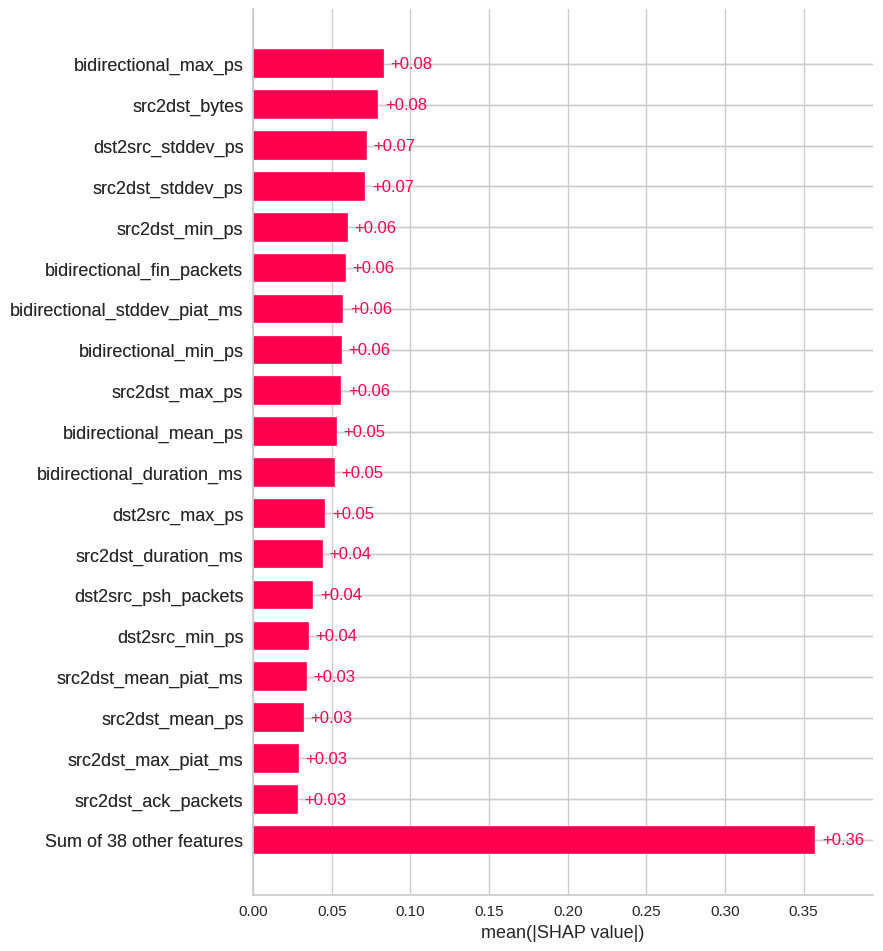

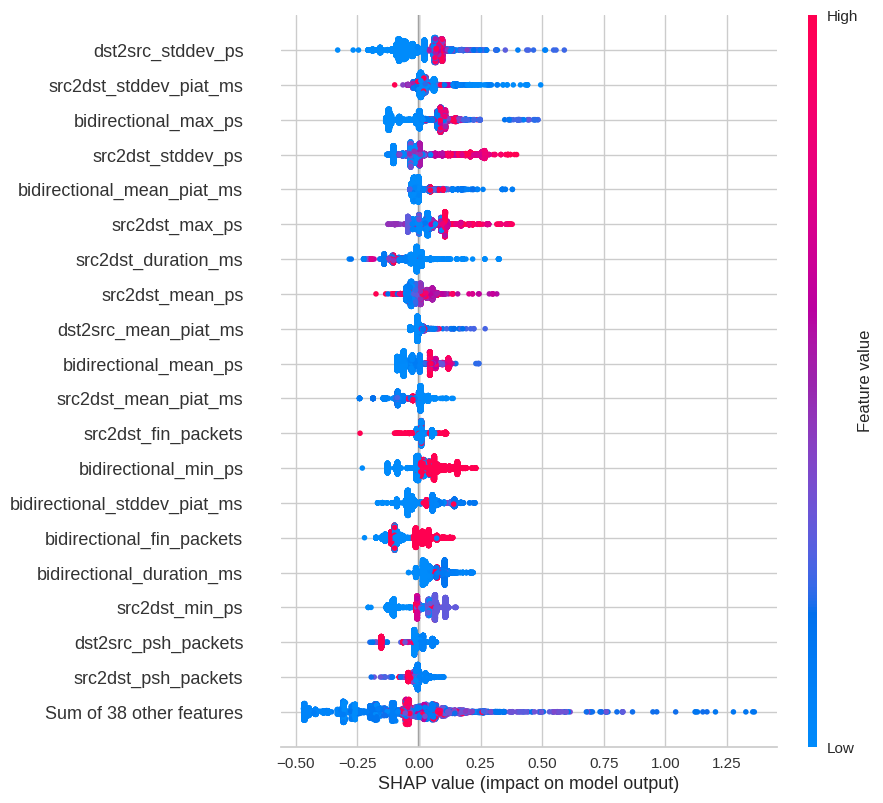

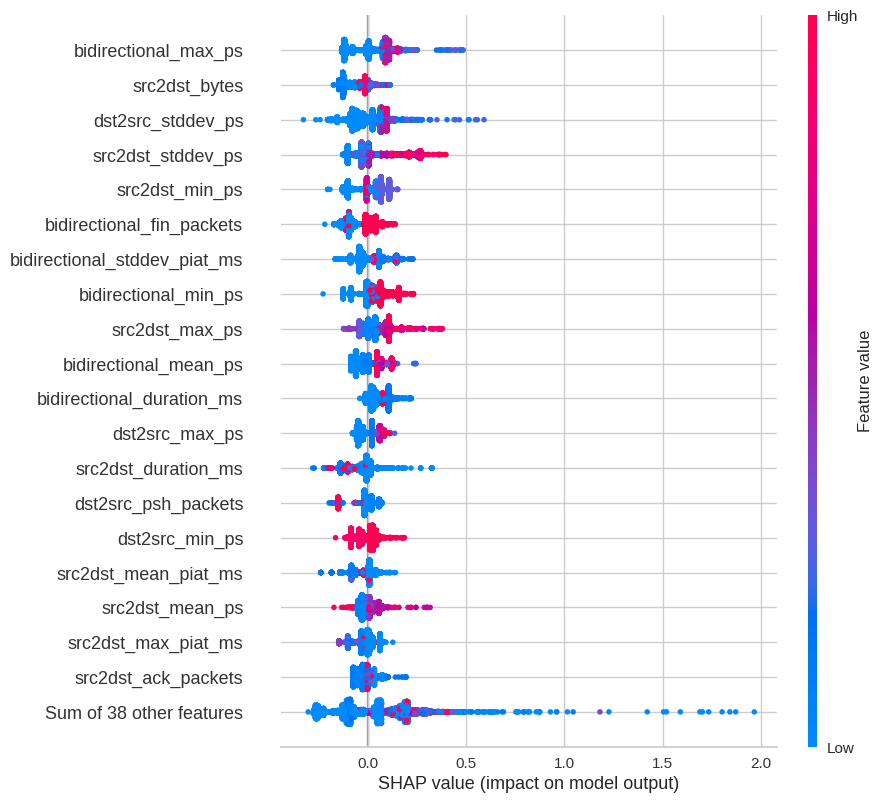

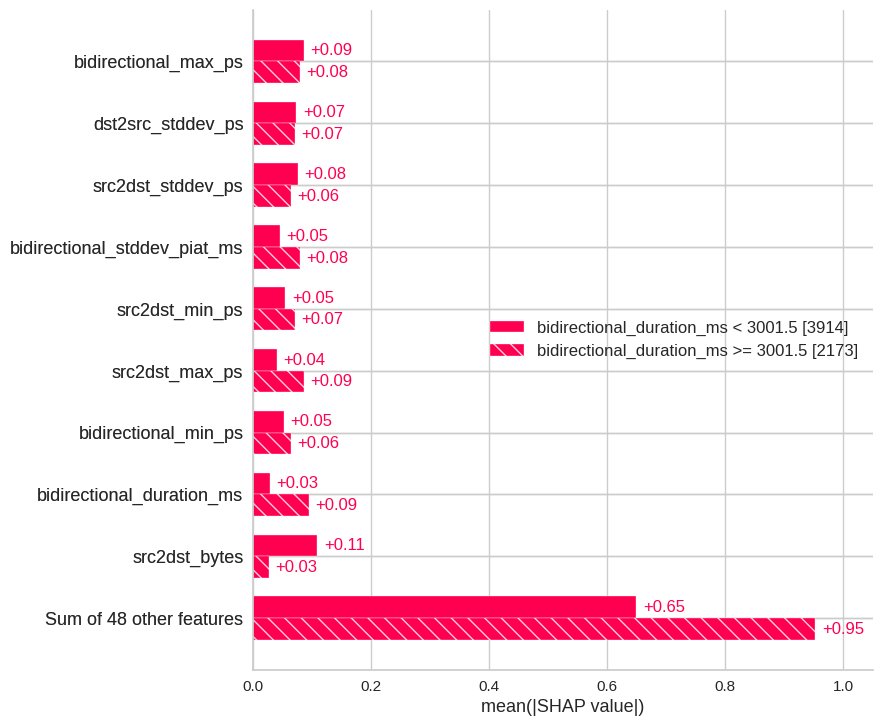

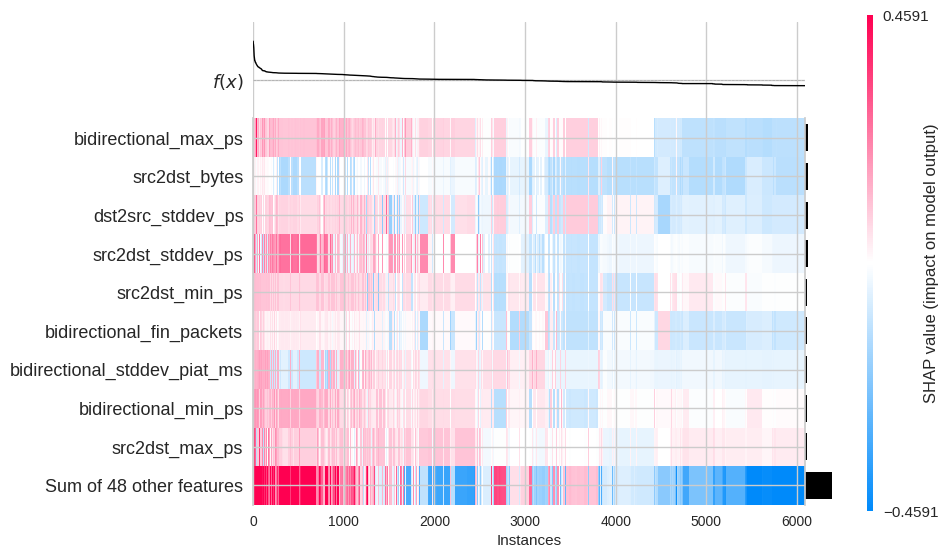

In [107]:
make_plot(13)

## Web Attack - XSS shap

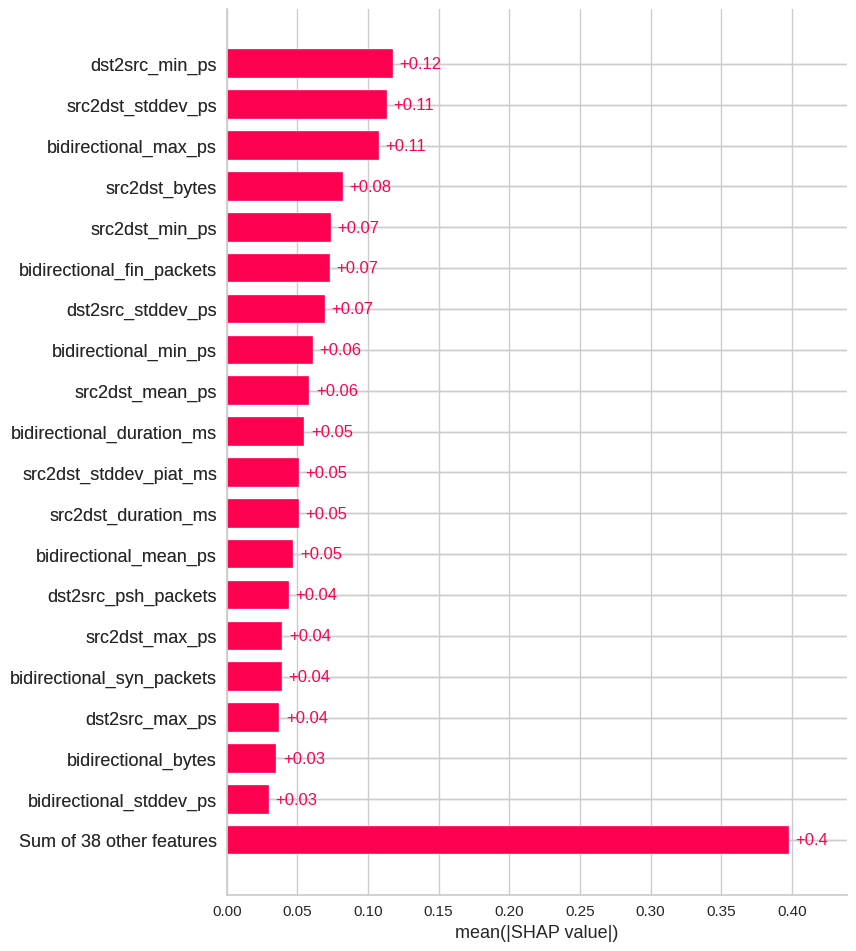

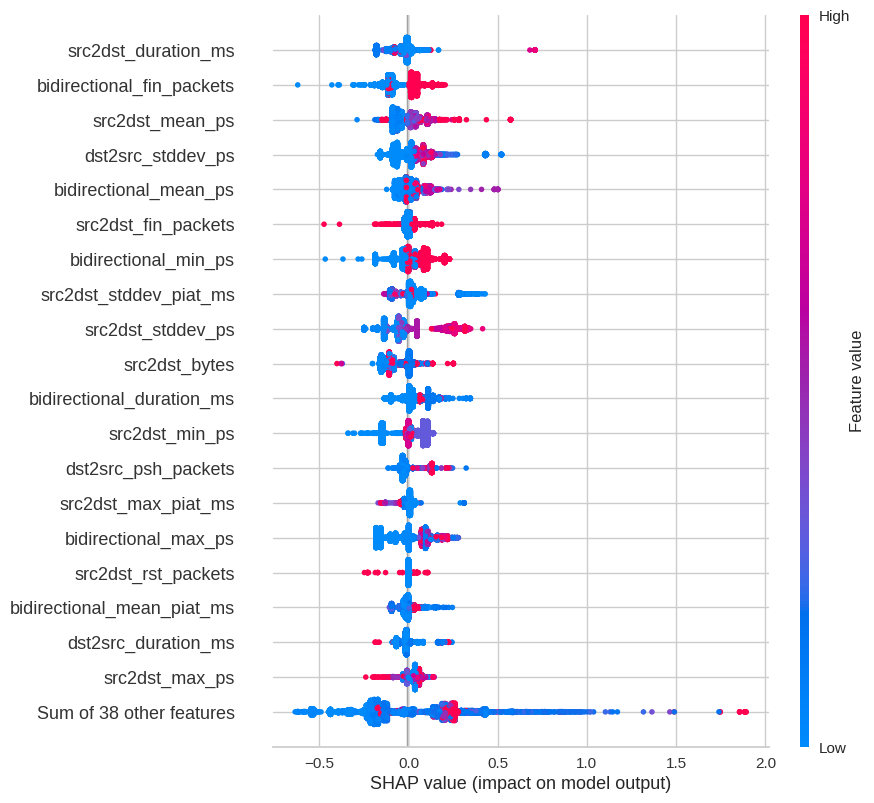

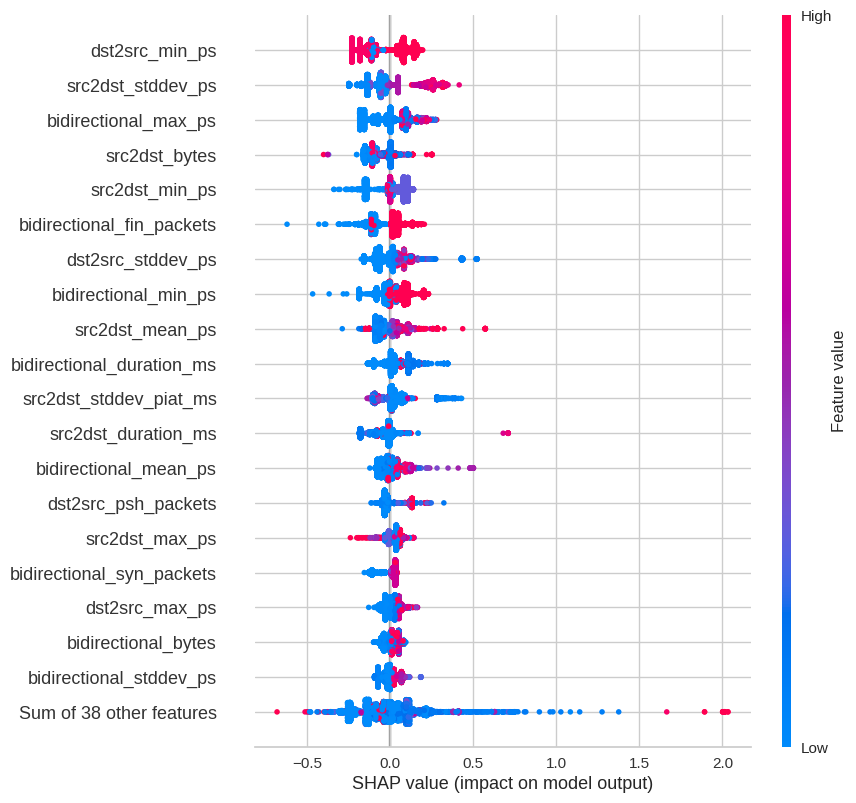

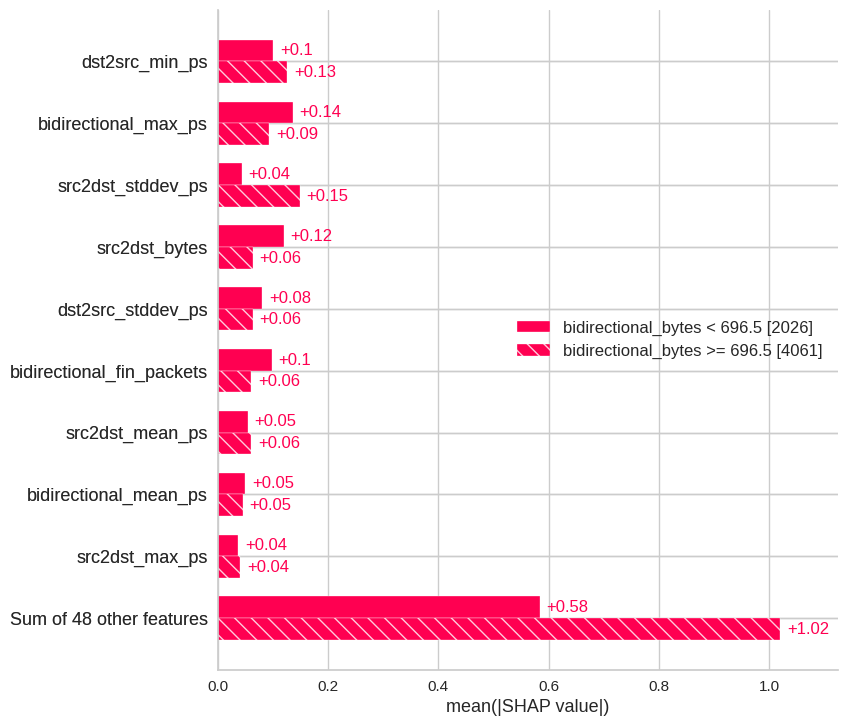

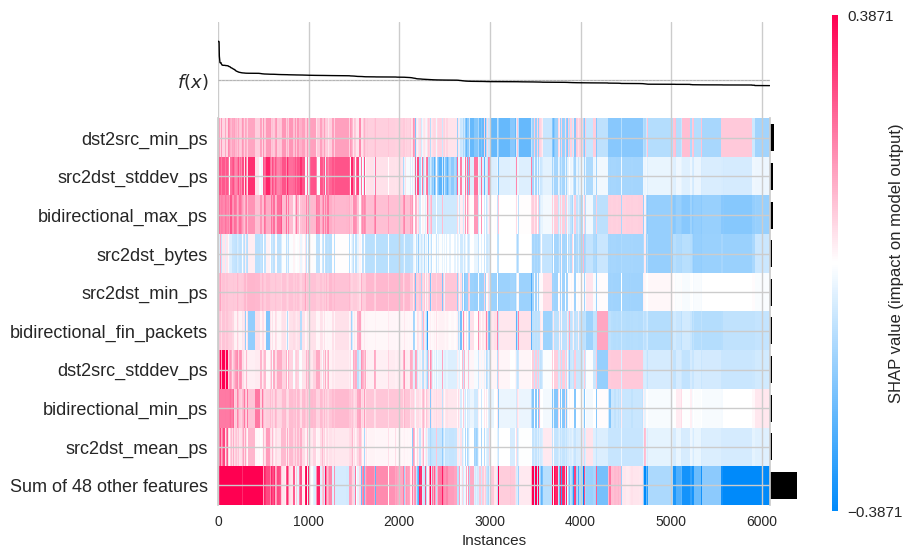

In [108]:
make_plot(14)

## Overall importance

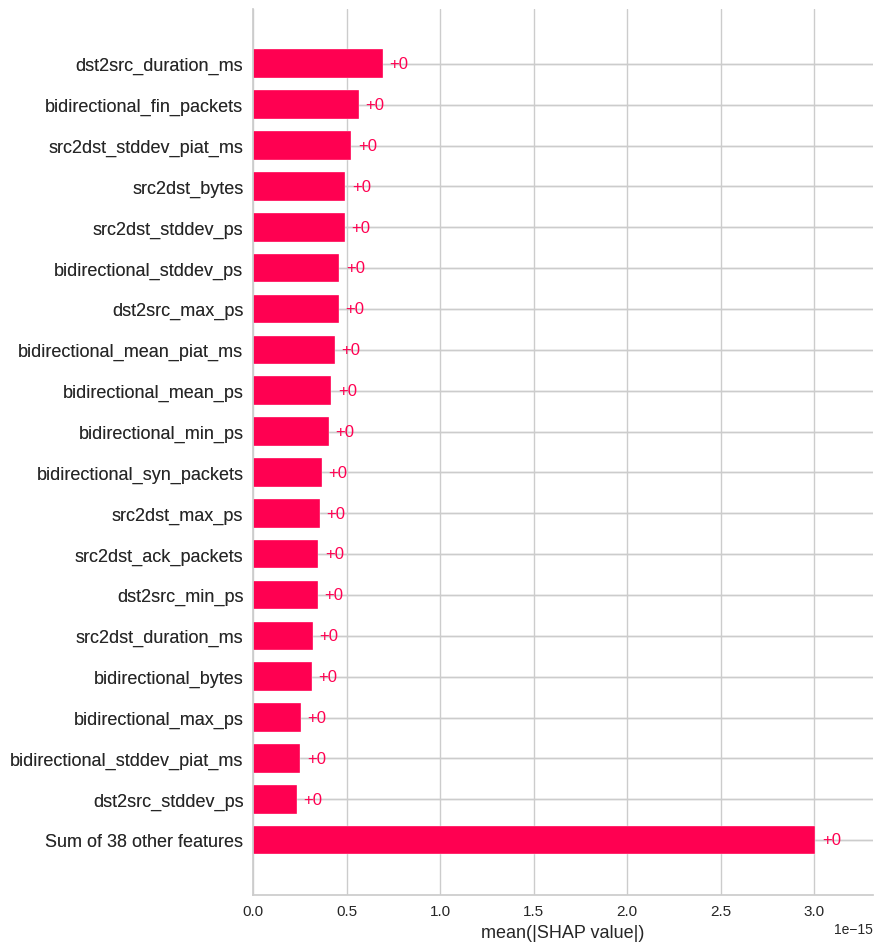

In [109]:
exp = Explanation(sv.values.mean(2), 
                  sv.base_values.mean(1), 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

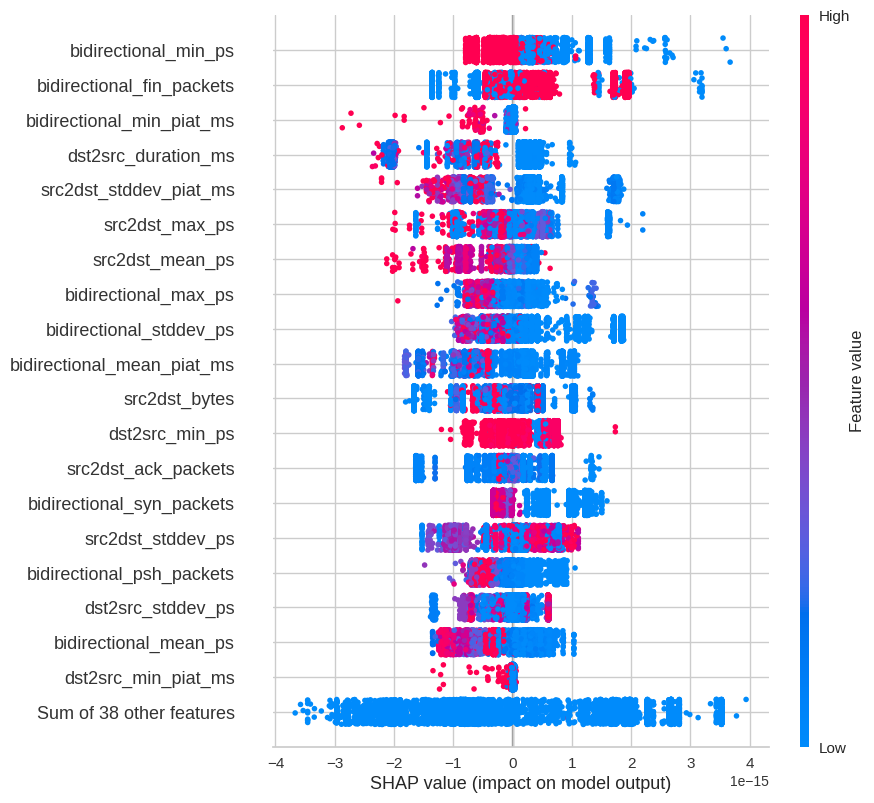

In [110]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

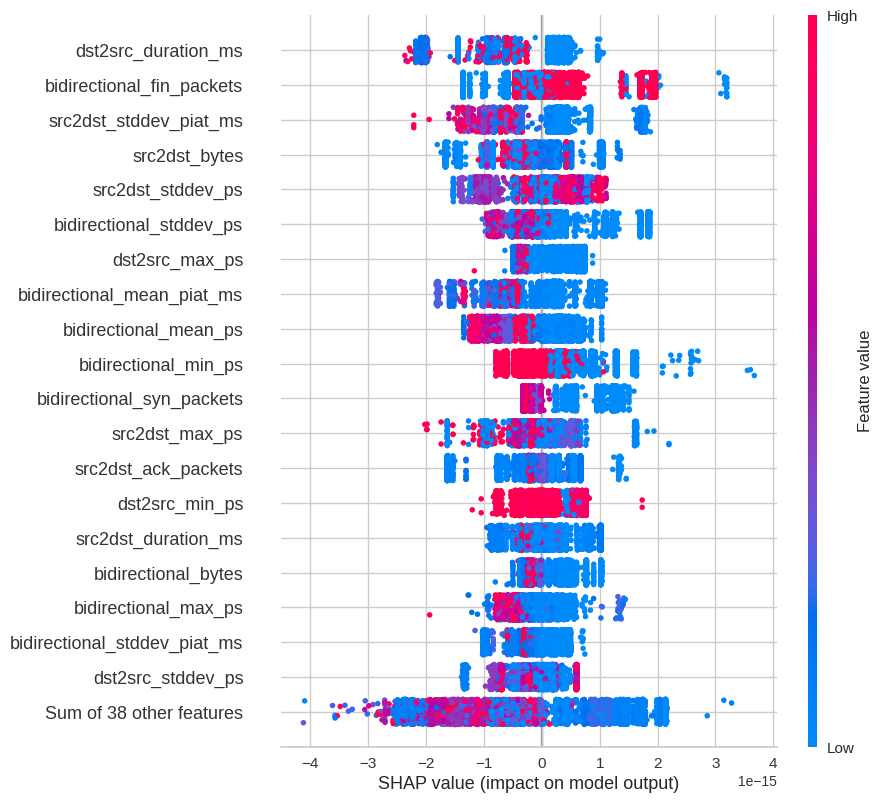

In [111]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Zero day test

In [112]:
classes = sorted(pd.unique(ds['label']).tolist())

In [113]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Bot']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.5329335	total: 1.07s	remaining: 41.8s
1:	learn: 0.3279694	total: 2.56s	remaining: 48.6s
2:	learn: 0.2538147	total: 3.78s	remaining: 46.6s
3:	learn: 0.2052880	total: 5.19s	remaining: 46.7s
4:	learn: 0.1723134	total: 6.43s	remaining: 45s
5:	learn: 0.1479817	total: 7.86s	remaining: 44.6s
6:	learn: 0.1325620	total: 9.07s	remaining: 42.8s
7:	learn: 0.1189188	total: 10.4s	remaining: 41.8s
8:	learn: 0.1088484	total: 11.7s	remaining: 40.4s
9:	learn: 0.1017976	total: 13.2s	remaining: 39.7s
10:	learn: 0.0963719	total: 14.4s	remaining: 38s
11:	learn: 0.0905473	total: 15.9s	remaining: 37.1s
12:	learn: 0.0849912	total: 17.2s	remaining: 35.6s
13:	learn: 0.0810515	total: 18.6s	remaining: 34.6s
14:	learn: 0.0780449	total: 19.9s	remaining: 33.1s
15:	learn: 0.0757537	total: 21.3s	remaining: 31.9s
16:	learn: 0.0687390	total: 22.4s	remaining: 30.3s
17:	learn: 0.0659524	total: 23.8s	remaining: 29.1s
18:	learn: 0.0619886	total: 25.1s	remaining: 27.7s
19:	learn: 0.0591196	total: 26.5s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.991814,0.890276
1,PRECISION,0.991986,0.844881
2,RECALL,0.991814,0.890276
3,F1 SCORE,0.991804,0.858902


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


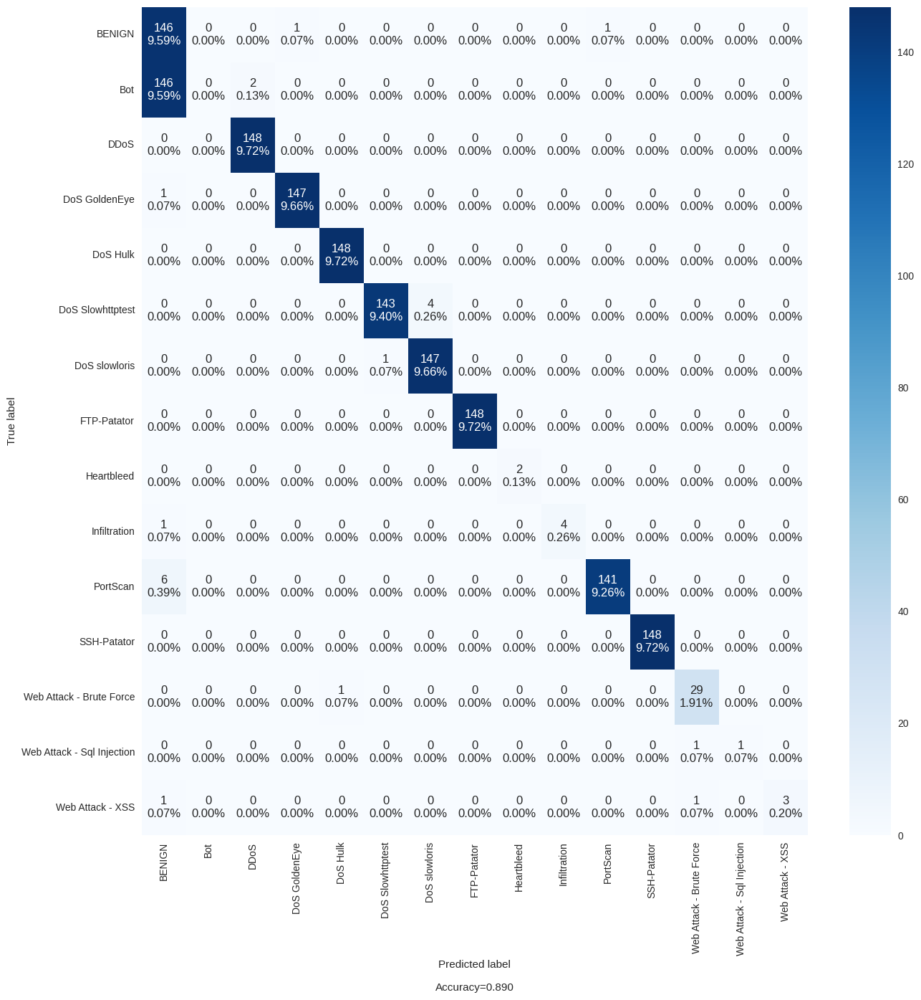

In [114]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [115]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DDoS']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.5367609	total: 1.1s	remaining: 43.1s
1:	learn: 0.3382949	total: 2.43s	remaining: 46.1s
2:	learn: 0.2625077	total: 3.69s	remaining: 45.5s
3:	learn: 0.2184964	total: 4.99s	remaining: 44.9s
4:	learn: 0.1840637	total: 6.34s	remaining: 44.4s
5:	learn: 0.1618232	total: 7.79s	remaining: 44.1s
6:	learn: 0.1397041	total: 9.05s	remaining: 42.7s
7:	learn: 0.1271150	total: 10.5s	remaining: 42.1s
8:	learn: 0.1177136	total: 11.8s	remaining: 40.6s
9:	learn: 0.1029398	total: 13.2s	remaining: 39.7s
10:	learn: 0.0958038	total: 13.4s	remaining: 35.2s
11:	learn: 0.0899508	total: 14.6s	remaining: 34.1s
12:	learn: 0.0845877	total: 15.9s	remaining: 33.1s
13:	learn: 0.0783690	total: 17.2s	remaining: 31.9s
14:	learn: 0.0743344	total: 18.7s	remaining: 31.1s
15:	learn: 0.0712119	total: 20s	remaining: 30s
16:	learn: 0.0684155	total: 21.4s	remaining: 29s
17:	learn: 0.0660363	total: 22.7s	remaining: 27.7s
18:	learn: 0.0633309	total: 24.1s	remaining: 26.6s
19:	learn: 0.0613651	total: 25.4s	remaining: 25.

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.991632,0.890933
1,PRECISION,0.991773,0.845648
2,RECALL,0.991632,0.890933
3,F1 SCORE,0.991624,0.860037


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


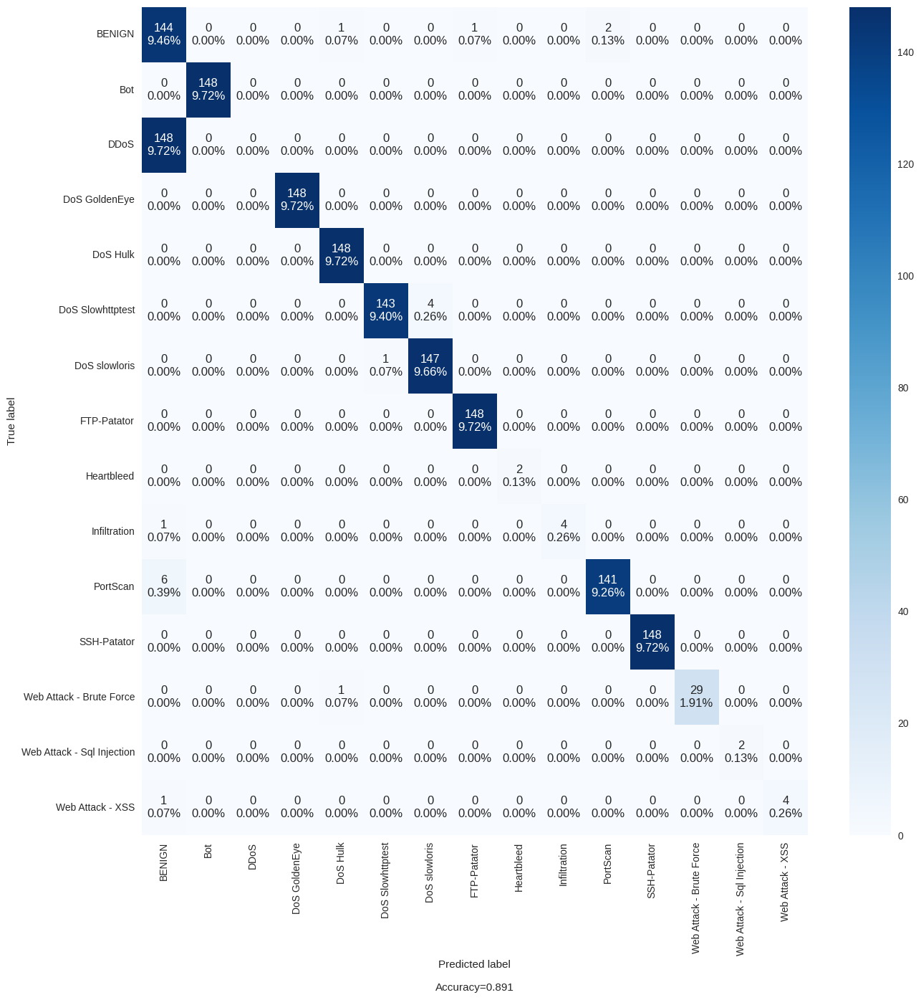

In [116]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [117]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS GoldenEye']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.3795786	total: 1.11s	remaining: 43.4s
1:	learn: 0.2920485	total: 2.59s	remaining: 49.2s
2:	learn: 0.2192339	total: 3.78s	remaining: 46.6s
3:	learn: 0.1788476	total: 5.19s	remaining: 46.7s
4:	learn: 0.1526125	total: 6.57s	remaining: 46s
5:	learn: 0.1349248	total: 7.89s	remaining: 44.7s
6:	learn: 0.1154838	total: 9.11s	remaining: 42.9s
7:	learn: 0.1041075	total: 10.5s	remaining: 42.1s
8:	learn: 0.0947983	total: 11.8s	remaining: 40.5s
9:	learn: 0.0869023	total: 13.2s	remaining: 39.7s
10:	learn: 0.0794909	total: 14.5s	remaining: 38.1s
11:	learn: 0.0751036	total: 15.9s	remaining: 37.2s
12:	learn: 0.0709789	total: 16s	remaining: 33.3s
13:	learn: 0.0658157	total: 17.3s	remaining: 32.2s
14:	learn: 0.0613759	total: 18.7s	remaining: 31.2s
15:	learn: 0.0588844	total: 20.1s	remaining: 30.1s
16:	learn: 0.0565111	total: 21.5s	remaining: 29.1s
17:	learn: 0.0547096	total: 22.7s	remaining: 27.8s
18:	learn: 0.0527925	total: 24.1s	remaining: 26.6s
19:	learn: 0.0505993	total: 25.4s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.991632,0.888305
1,PRECISION,0.991759,0.827323
2,RECALL,0.991632,0.888305
3,F1 SCORE,0.991625,0.851624


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


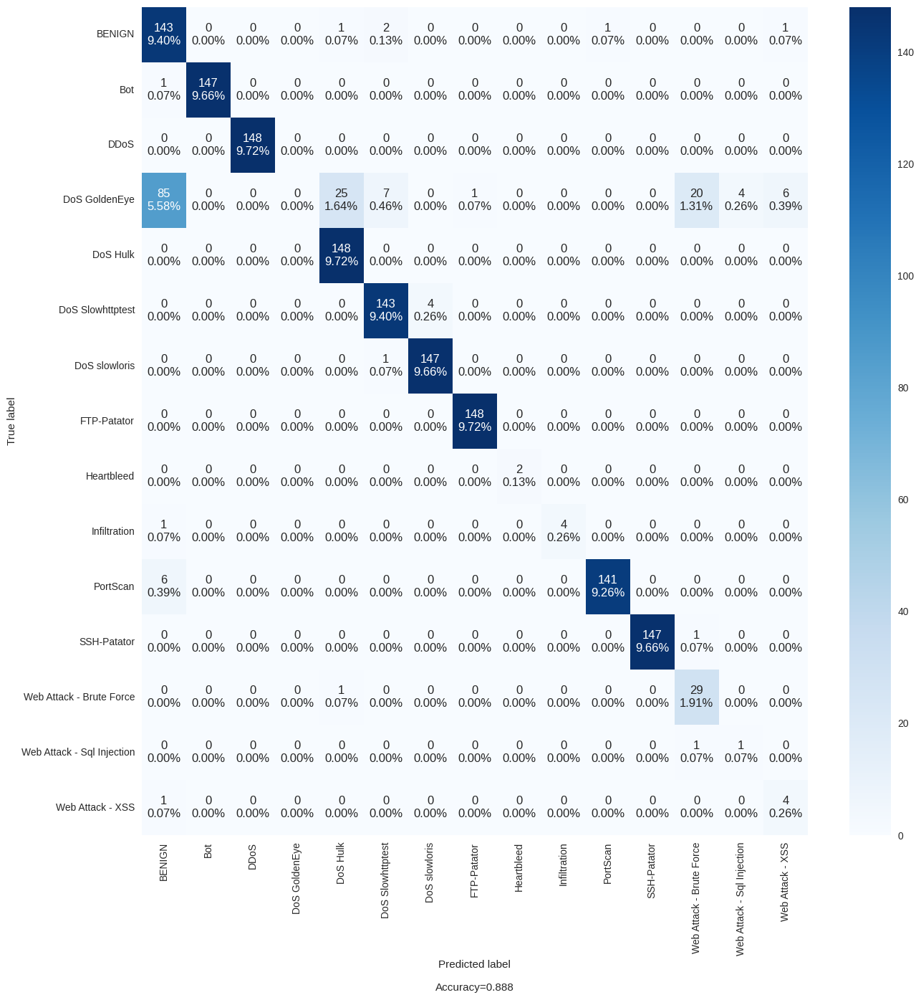

In [118]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [119]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS Hulk']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4923731	total: 1.11s	remaining: 43.3s
1:	learn: 0.3317715	total: 2.52s	remaining: 48s
2:	learn: 0.2557084	total: 3.81s	remaining: 47s
3:	learn: 0.2139423	total: 5.14s	remaining: 46.2s
4:	learn: 0.1792884	total: 6.4s	remaining: 44.8s
5:	learn: 0.1549207	total: 7.85s	remaining: 44.5s
6:	learn: 0.1351486	total: 9.05s	remaining: 42.7s
7:	learn: 0.1215285	total: 10.5s	remaining: 41.9s
8:	learn: 0.1092346	total: 11.7s	remaining: 40.4s
9:	learn: 0.1001290	total: 13.2s	remaining: 39.7s
10:	learn: 0.0925729	total: 14.5s	remaining: 38.1s
11:	learn: 0.0864852	total: 15.8s	remaining: 37s
12:	learn: 0.0809347	total: 17.1s	remaining: 35.4s
13:	learn: 0.0768314	total: 18.5s	remaining: 34.4s
14:	learn: 0.0735938	total: 19.7s	remaining: 32.8s
15:	learn: 0.0698752	total: 21.1s	remaining: 31.6s
16:	learn: 0.0669008	total: 22.3s	remaining: 30.2s
17:	learn: 0.0636713	total: 23.7s	remaining: 29s
18:	learn: 0.0615621	total: 24.9s	remaining: 27.5s
19:	learn: 0.0592917	total: 26.3s	remaining: 26.3s

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.991814,0.889619
1,PRECISION,0.991938,0.840186
2,RECALL,0.991814,0.889619
3,F1 SCORE,0.991792,0.857033


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


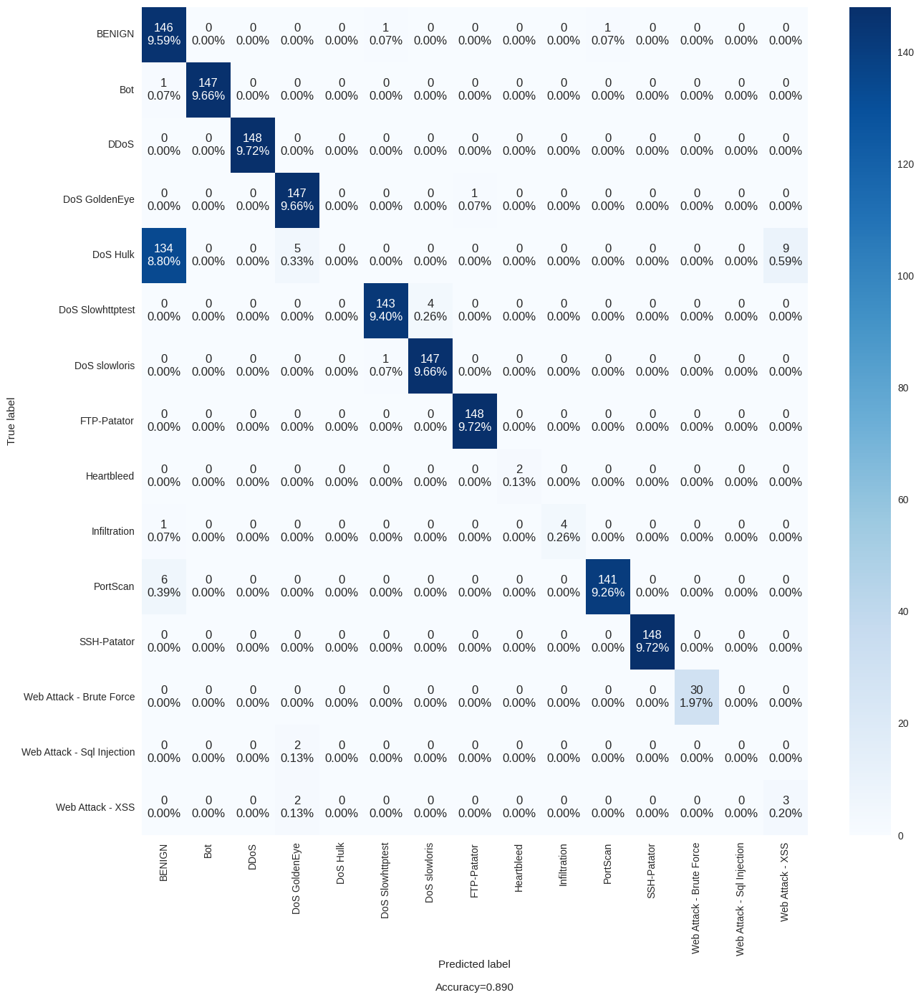

In [120]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [121]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS Slowhttptest']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.3288201	total: 1.08s	remaining: 42.3s
1:	learn: 0.2395106	total: 2.52s	remaining: 47.8s
2:	learn: 0.1837612	total: 3.66s	remaining: 45.2s
3:	learn: 0.1477171	total: 5.03s	remaining: 45.3s
4:	learn: 0.1216941	total: 6.26s	remaining: 43.8s
5:	learn: 0.1034944	total: 7.7s	remaining: 43.6s
6:	learn: 0.0906723	total: 8.93s	remaining: 42.1s
7:	learn: 0.0815267	total: 10.3s	remaining: 41.2s
8:	learn: 0.0737051	total: 11.5s	remaining: 39.5s
9:	learn: 0.0678799	total: 13s	remaining: 38.9s
10:	learn: 0.0628493	total: 14.1s	remaining: 37.2s
11:	learn: 0.0588236	total: 15.4s	remaining: 36s
12:	learn: 0.0554202	total: 16.6s	remaining: 34.5s
13:	learn: 0.0522484	total: 16.7s	remaining: 30.9s
14:	learn: 0.0497902	total: 18.1s	remaining: 30.2s
15:	learn: 0.0475500	total: 19.3s	remaining: 28.9s
16:	learn: 0.0452910	total: 20.6s	remaining: 27.9s
17:	learn: 0.0435637	total: 21.8s	remaining: 26.7s
18:	learn: 0.0419329	total: 23.2s	remaining: 25.6s
19:	learn: 0.0392508	total: 24.4s	remaining: 2

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.994541,0.888962
1,PRECISION,0.994632,0.829191
2,RECALL,0.994541,0.888962
3,F1 SCORE,0.994535,0.851820


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


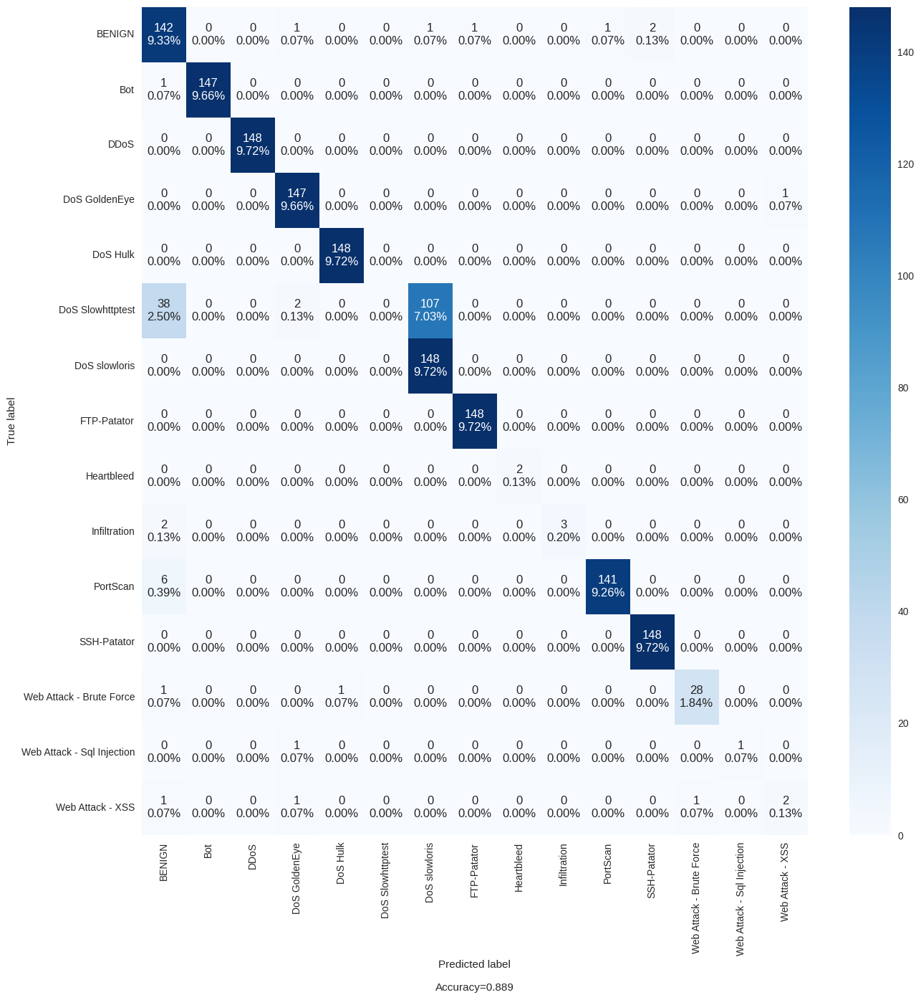

In [122]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [123]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS slowloris']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4282481	total: 1.02s	remaining: 40s
1:	learn: 0.2765991	total: 2.4s	remaining: 45.6s
2:	learn: 0.2122408	total: 3.57s	remaining: 44s
3:	learn: 0.1696006	total: 4.92s	remaining: 44.3s
4:	learn: 0.1434343	total: 6.12s	remaining: 42.8s
5:	learn: 0.1219457	total: 7.41s	remaining: 42s
6:	learn: 0.1069303	total: 8.6s	remaining: 40.5s
7:	learn: 0.0946217	total: 10s	remaining: 40.1s
8:	learn: 0.0851110	total: 11.2s	remaining: 38.5s
9:	learn: 0.0767846	total: 12.5s	remaining: 37.4s
10:	learn: 0.0687083	total: 13.6s	remaining: 36s
11:	learn: 0.0633185	total: 14.9s	remaining: 34.8s
12:	learn: 0.0600606	total: 15s	remaining: 31.1s
13:	learn: 0.0567879	total: 16.2s	remaining: 30.1s
14:	learn: 0.0537172	total: 17.5s	remaining: 29.2s
15:	learn: 0.0517638	total: 17.6s	remaining: 26.4s
16:	learn: 0.0487726	total: 18.8s	remaining: 25.4s
17:	learn: 0.0457304	total: 20.1s	remaining: 24.6s
18:	learn: 0.0441390	total: 21.3s	remaining: 23.5s
19:	learn: 0.0423254	total: 22.7s	remaining: 22.7s
20:	

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.994906,0.892247
1,PRECISION,0.994998,0.844404
2,RECALL,0.994906,0.892247
3,F1 SCORE,0.994885,0.859891


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


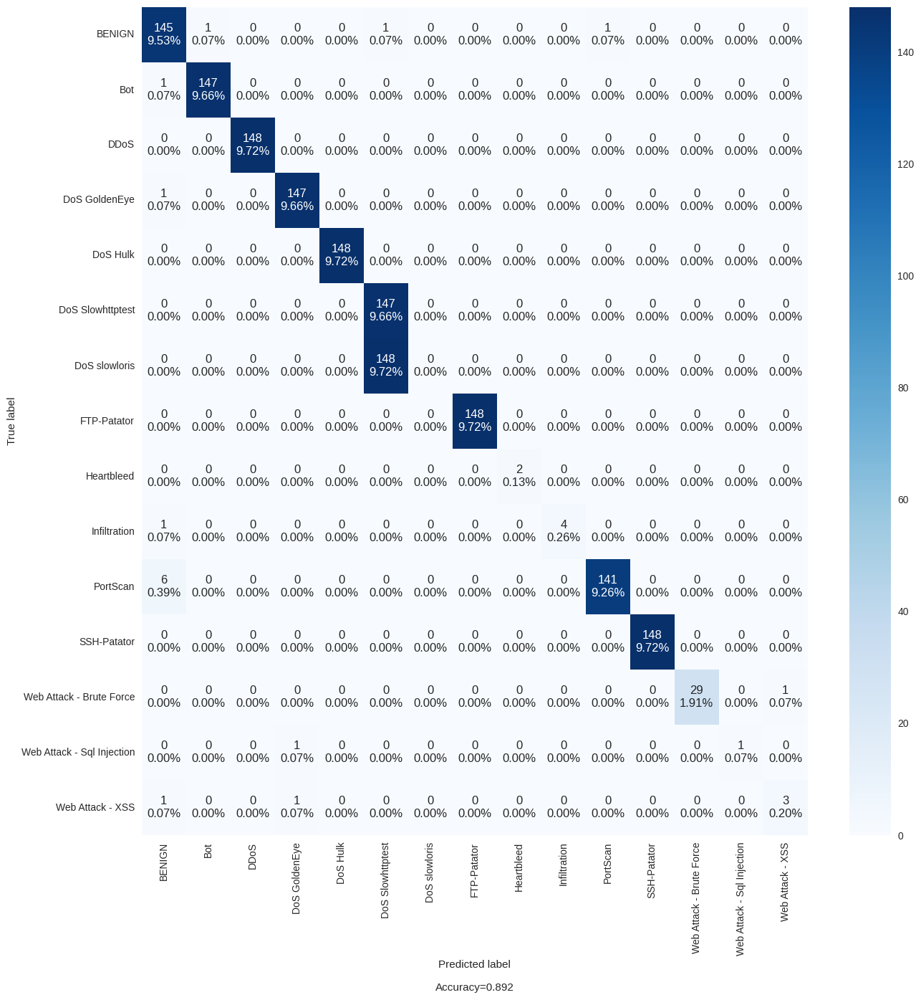

In [124]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [125]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'FTP-Patator']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4558863	total: 1.07s	remaining: 41.7s
1:	learn: 0.3171162	total: 2.51s	remaining: 47.7s
2:	learn: 0.2432592	total: 3.7s	remaining: 45.6s
3:	learn: 0.2033679	total: 5.03s	remaining: 45.3s
4:	learn: 0.1600646	total: 6.28s	remaining: 44s
5:	learn: 0.1354259	total: 7.68s	remaining: 43.5s
6:	learn: 0.1189571	total: 8.85s	remaining: 41.7s
7:	learn: 0.1083377	total: 10.3s	remaining: 41.1s
8:	learn: 0.0983078	total: 11.5s	remaining: 39.7s
9:	learn: 0.0892322	total: 12.9s	remaining: 38.7s
10:	learn: 0.0826431	total: 14.1s	remaining: 37.2s
11:	learn: 0.0776575	total: 15.5s	remaining: 36.1s
12:	learn: 0.0732831	total: 16.6s	remaining: 34.5s
13:	learn: 0.0698257	total: 18.1s	remaining: 33.5s
14:	learn: 0.0667238	total: 19.2s	remaining: 32s
15:	learn: 0.0645131	total: 20.5s	remaining: 30.8s
16:	learn: 0.0614626	total: 21.8s	remaining: 29.4s
17:	learn: 0.0594571	total: 23.1s	remaining: 28.2s
18:	learn: 0.0574711	total: 24.3s	remaining: 26.8s
19:	learn: 0.0550703	total: 25.6s	remaining: 2

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.991814,0.890276
1,PRECISION,0.991958,0.827155
2,RECALL,0.991814,0.890276
3,F1 SCORE,0.991803,0.852144


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


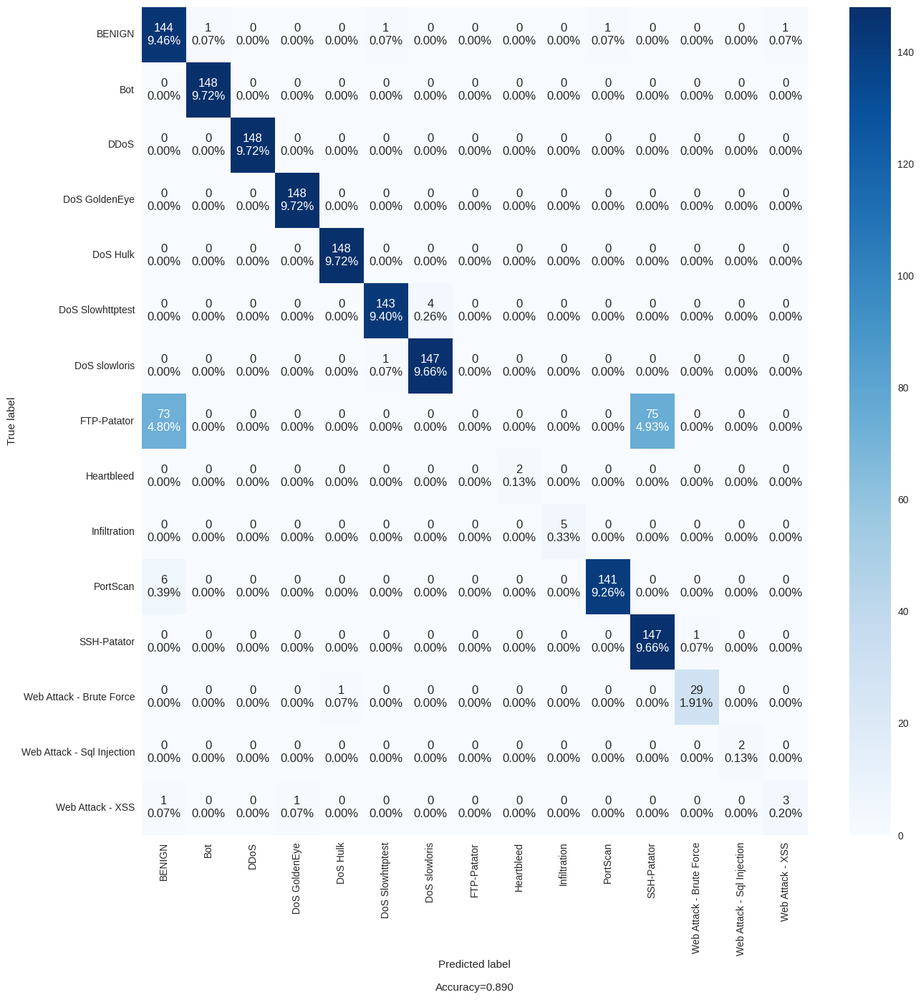

In [126]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [127]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Heartbleed']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4395108	total: 1.06s	remaining: 41.3s
1:	learn: 0.3278693	total: 2.54s	remaining: 48.2s
2:	learn: 0.2621854	total: 3.71s	remaining: 45.7s
3:	learn: 0.2191062	total: 5.07s	remaining: 45.6s
4:	learn: 0.1776793	total: 6.35s	remaining: 44.5s
5:	learn: 0.1560970	total: 7.75s	remaining: 43.9s
6:	learn: 0.1411714	total: 8.95s	remaining: 42.2s
7:	learn: 0.1274734	total: 10.3s	remaining: 41.3s
8:	learn: 0.1092675	total: 11.5s	remaining: 39.6s
9:	learn: 0.1015806	total: 12.9s	remaining: 38.8s
10:	learn: 0.0937249	total: 14.2s	remaining: 37.5s
11:	learn: 0.0859480	total: 15.6s	remaining: 36.3s
12:	learn: 0.0800516	total: 16.8s	remaining: 34.8s
13:	learn: 0.0758608	total: 18.1s	remaining: 33.6s
14:	learn: 0.0728589	total: 19.3s	remaining: 32.1s
15:	learn: 0.0698243	total: 20.7s	remaining: 31s
16:	learn: 0.0669063	total: 21.8s	remaining: 29.6s
17:	learn: 0.0637893	total: 23.3s	remaining: 28.5s
18:	learn: 0.0610363	total: 24.5s	remaining: 27.1s
19:	learn: 0.0586846	total: 25.9s	remaining

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.990951,0.982260
1,PRECISION,0.991075,0.981327
2,RECALL,0.990951,0.982260
3,F1 SCORE,0.990882,0.981546


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


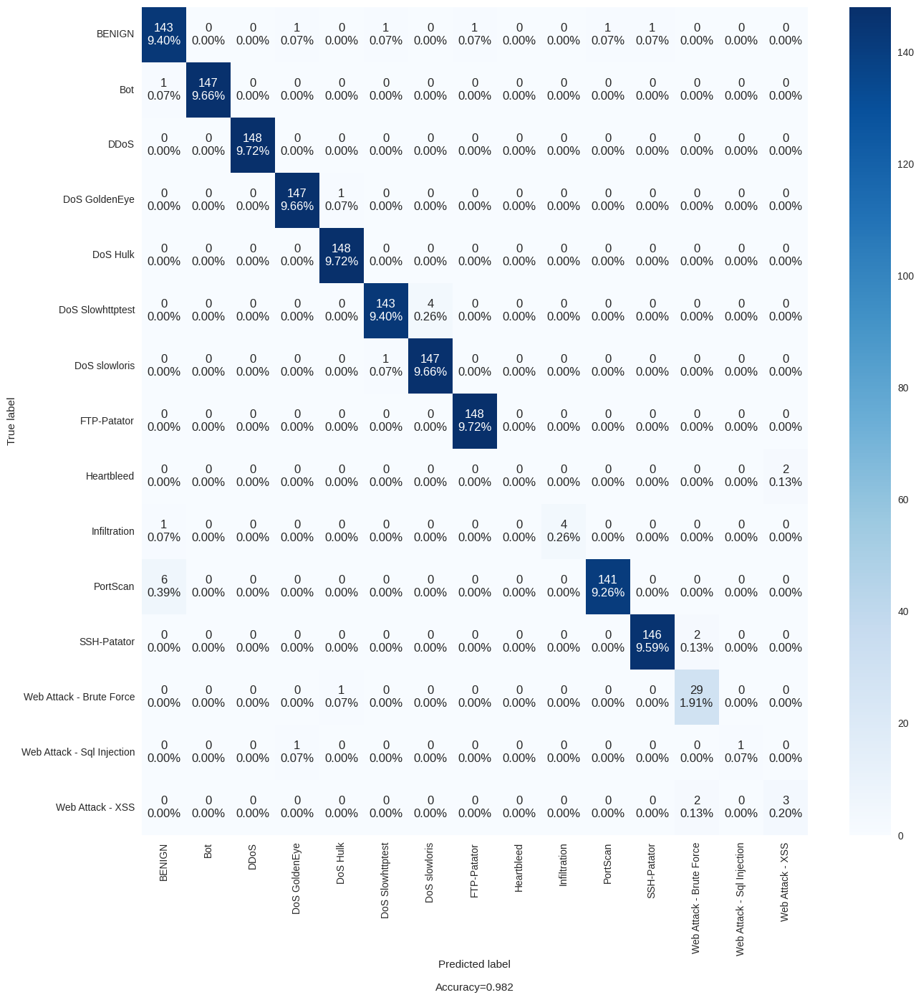

In [128]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [129]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Infiltration']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4551487	total: 1.03s	remaining: 40.2s
1:	learn: 0.2925855	total: 2.39s	remaining: 45.5s
2:	learn: 0.2217328	total: 3.63s	remaining: 44.8s
3:	learn: 0.1821602	total: 5.06s	remaining: 45.5s
4:	learn: 0.1547067	total: 6.27s	remaining: 43.9s
5:	learn: 0.1299179	total: 7.66s	remaining: 43.4s
6:	learn: 0.1151192	total: 8.86s	remaining: 41.8s
7:	learn: 0.1038991	total: 10.3s	remaining: 41s
8:	learn: 0.0946925	total: 11.4s	remaining: 39.4s
9:	learn: 0.0873710	total: 12.8s	remaining: 38.5s
10:	learn: 0.0813164	total: 14s	remaining: 37s
11:	learn: 0.0764123	total: 15.4s	remaining: 36s
12:	learn: 0.0727471	total: 16.5s	remaining: 34.4s
13:	learn: 0.0696507	total: 17s	remaining: 31.6s
14:	learn: 0.0668369	total: 18.3s	remaining: 30.5s
15:	learn: 0.0645326	total: 19.5s	remaining: 29.2s
16:	learn: 0.0628781	total: 19.5s	remaining: 26.4s
17:	learn: 0.0610394	total: 20.9s	remaining: 25.5s
18:	learn: 0.0592614	total: 22.1s	remaining: 24.4s
19:	learn: 0.0573852	total: 23.5s	remaining: 23.5s


Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.991920,0.982260
1,PRECISION,0.992045,0.979069
2,RECALL,0.991920,0.982260
3,F1 SCORE,0.991884,0.980442


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


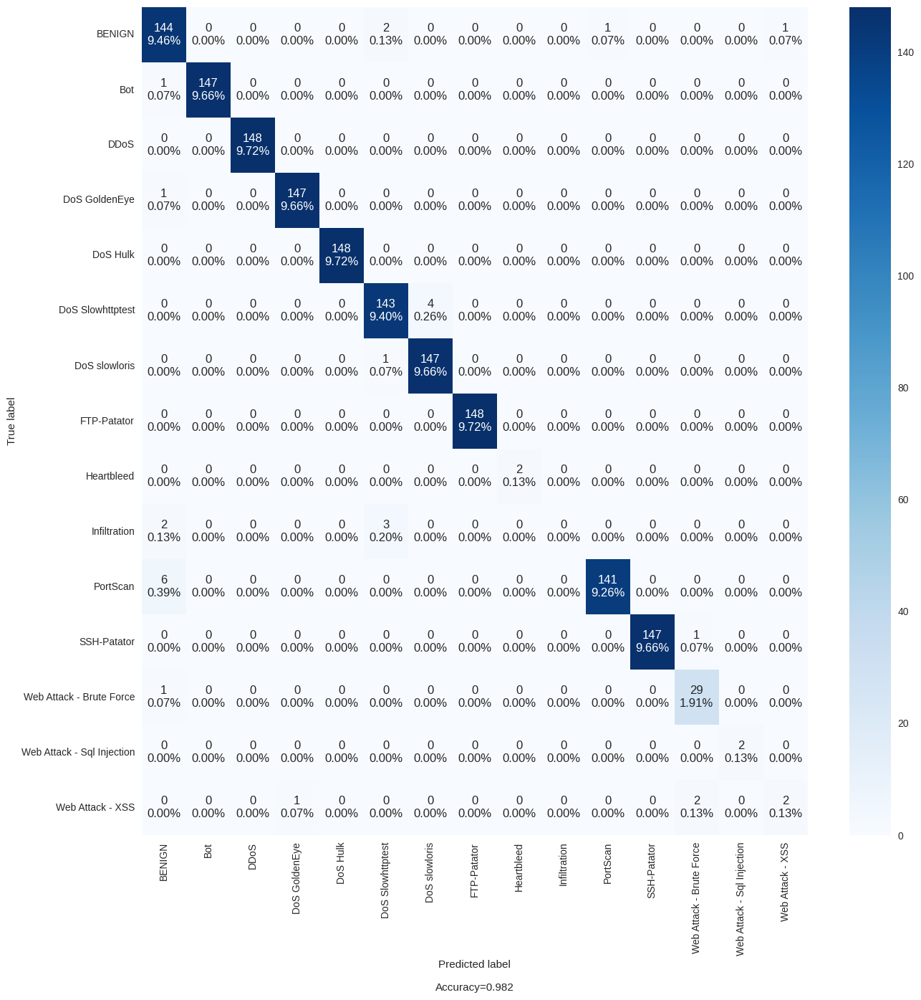

In [130]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [131]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'PortScan']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4398291	total: 1.11s	remaining: 43.3s
1:	learn: 0.2908735	total: 2.45s	remaining: 46.6s
2:	learn: 0.2211312	total: 3.65s	remaining: 45s
3:	learn: 0.1802706	total: 5.09s	remaining: 45.8s
4:	learn: 0.1498930	total: 6.31s	remaining: 44.2s
5:	learn: 0.1303967	total: 7.63s	remaining: 43.3s
6:	learn: 0.1131126	total: 8.88s	remaining: 41.9s
7:	learn: 0.1002995	total: 10.3s	remaining: 41.1s
8:	learn: 0.0894441	total: 11.4s	remaining: 39.4s
9:	learn: 0.0827771	total: 12.8s	remaining: 38.5s
10:	learn: 0.0776072	total: 14s	remaining: 36.9s
11:	learn: 0.0709127	total: 15.4s	remaining: 35.8s
12:	learn: 0.0668751	total: 16.6s	remaining: 34.5s
13:	learn: 0.0625421	total: 18s	remaining: 33.5s
14:	learn: 0.0576745	total: 19.2s	remaining: 32s
15:	learn: 0.0533550	total: 20.6s	remaining: 30.9s
16:	learn: 0.0508591	total: 21.8s	remaining: 29.5s
17:	learn: 0.0486926	total: 23.2s	remaining: 28.3s
18:	learn: 0.0467701	total: 24.4s	remaining: 27s
19:	learn: 0.0448565	total: 25.8s	remaining: 25.8s


Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.995633,0.893561
1,PRECISION,0.995681,0.830828
2,RECALL,0.995633,0.893561
3,F1 SCORE,0.995608,0.855742


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


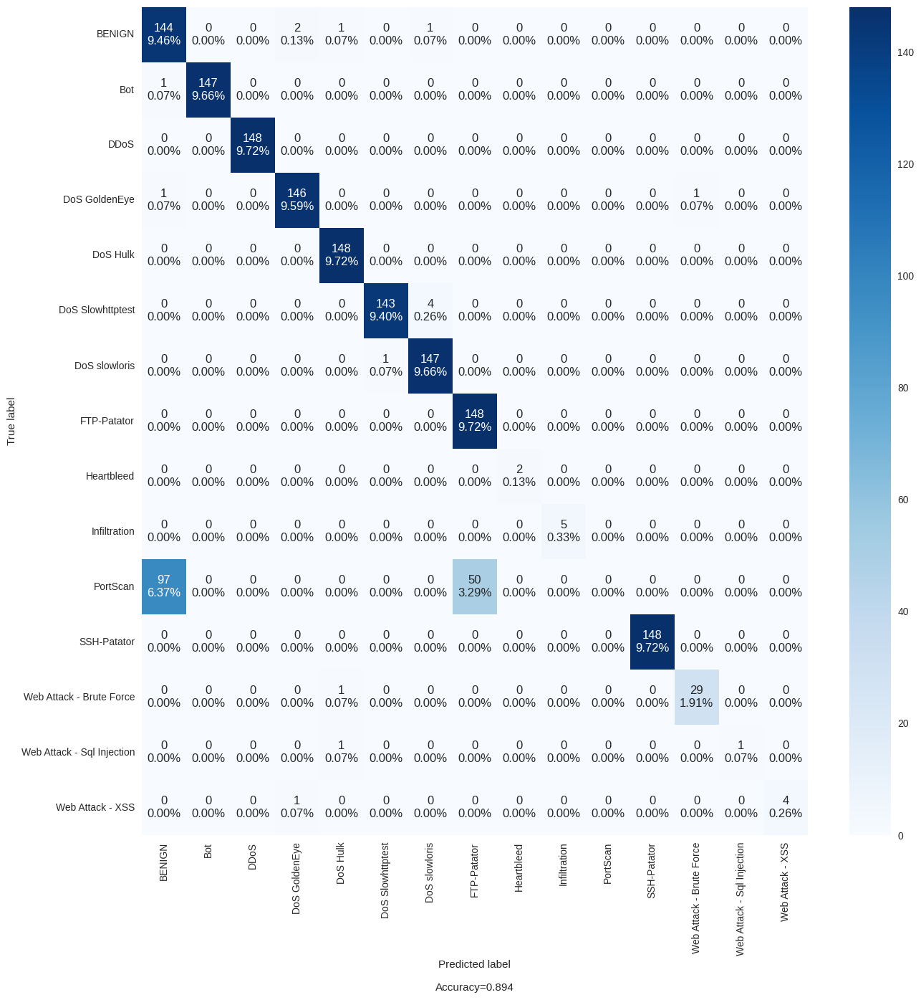

In [132]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [133]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'SSH-Patator']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4160716	total: 1.06s	remaining: 41.5s
1:	learn: 0.3137093	total: 2.51s	remaining: 47.6s
2:	learn: 0.2434255	total: 3.7s	remaining: 45.6s
3:	learn: 0.1929101	total: 5.11s	remaining: 46s
4:	learn: 0.1570850	total: 6.33s	remaining: 44.3s
5:	learn: 0.1334747	total: 7.71s	remaining: 43.7s
6:	learn: 0.1191004	total: 8.89s	remaining: 41.9s
7:	learn: 0.1081244	total: 10.3s	remaining: 41.1s
8:	learn: 0.0984045	total: 11.5s	remaining: 39.6s
9:	learn: 0.0901131	total: 12.9s	remaining: 38.7s
10:	learn: 0.0840736	total: 14.1s	remaining: 37.1s
11:	learn: 0.0790534	total: 15.5s	remaining: 36.1s
12:	learn: 0.0730344	total: 16.6s	remaining: 34.6s
13:	learn: 0.0692600	total: 18.1s	remaining: 33.6s
14:	learn: 0.0662225	total: 19.2s	remaining: 32s
15:	learn: 0.0638385	total: 20.6s	remaining: 30.9s
16:	learn: 0.0617246	total: 21.7s	remaining: 29.4s
17:	learn: 0.0597058	total: 22.3s	remaining: 27.2s
18:	learn: 0.0582089	total: 23.7s	remaining: 26.1s
19:	learn: 0.0567072	total: 23.7s	remaining: 2

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.991996,0.886991
1,PRECISION,0.992123,0.836797
2,RECALL,0.991996,0.886991
3,F1 SCORE,0.991973,0.854078


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


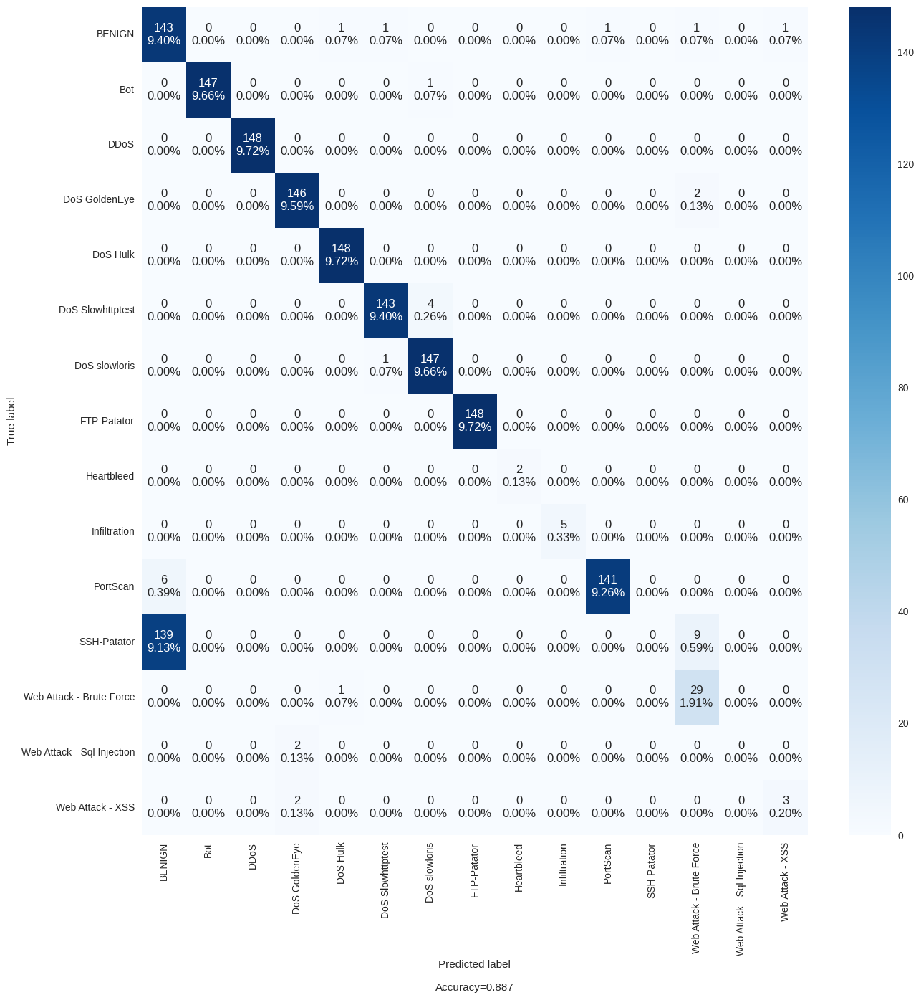

In [134]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [135]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - Brute Force']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4968090	total: 1.08s	remaining: 42.3s
1:	learn: 0.2931572	total: 2.48s	remaining: 47.1s
2:	learn: 0.2264323	total: 3.66s	remaining: 45.2s
3:	learn: 0.1818983	total: 5s	remaining: 45.1s
4:	learn: 0.1564485	total: 6.22s	remaining: 43.5s
5:	learn: 0.1327564	total: 7.62s	remaining: 43.2s
6:	learn: 0.1151397	total: 8.83s	remaining: 41.6s
7:	learn: 0.1039918	total: 10.2s	remaining: 41s
8:	learn: 0.0941982	total: 11.4s	remaining: 39.3s
9:	learn: 0.0867033	total: 12.7s	remaining: 38.1s
10:	learn: 0.0817279	total: 13.9s	remaining: 36.7s
11:	learn: 0.0769763	total: 15.3s	remaining: 35.6s
12:	learn: 0.0731094	total: 16.5s	remaining: 34.2s
13:	learn: 0.0688472	total: 16.5s	remaining: 30.6s
14:	learn: 0.0646906	total: 17.9s	remaining: 29.8s
15:	learn: 0.0622921	total: 19.2s	remaining: 28.8s
16:	learn: 0.0582119	total: 20.5s	remaining: 27.8s
17:	learn: 0.0565073	total: 20.8s	remaining: 25.4s
18:	learn: 0.0543588	total: 21.9s	remaining: 24.2s
19:	learn: 0.0530043	total: 23.3s	remaining: 2

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.991452,0.967148
1,PRECISION,0.991572,0.953265
2,RECALL,0.991452,0.967148
3,F1 SCORE,0.991412,0.959384


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


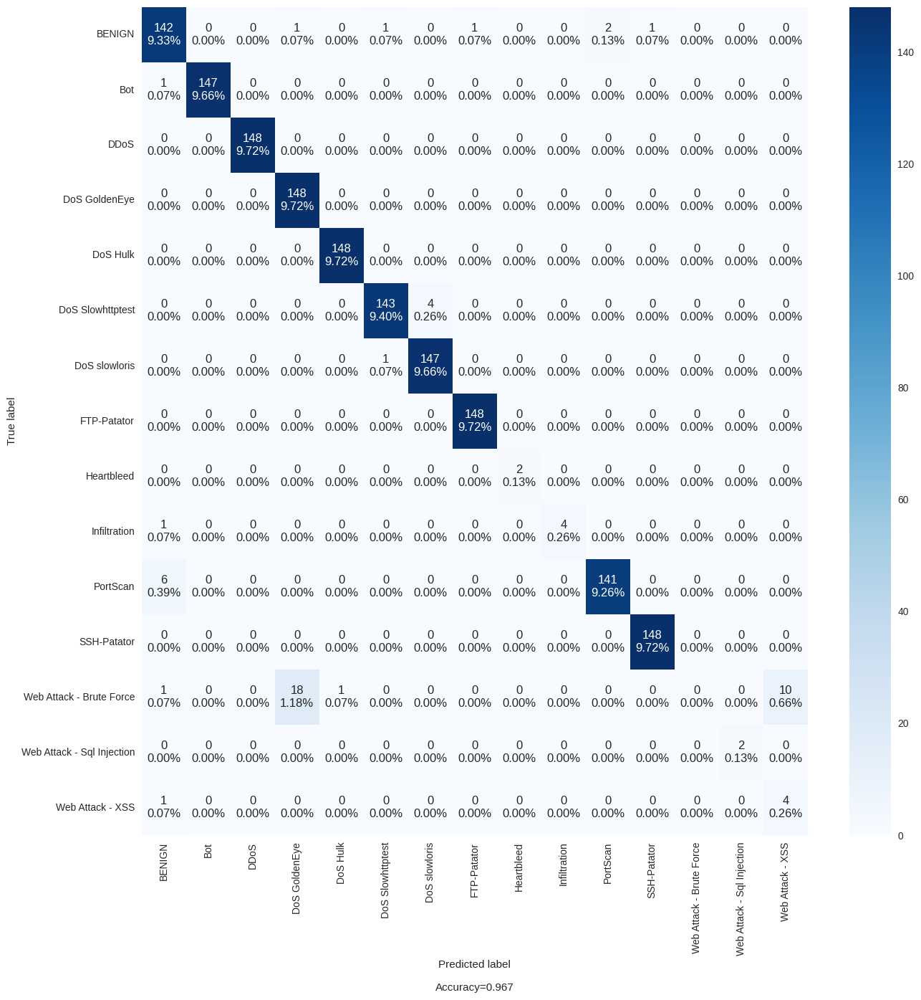

In [136]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [137]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - Sql Injection']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4695081	total: 1.07s	remaining: 41.7s
1:	learn: 0.3011399	total: 2.54s	remaining: 48.3s
2:	learn: 0.2329730	total: 3.71s	remaining: 45.7s
3:	learn: 0.1913891	total: 5.07s	remaining: 45.6s
4:	learn: 0.1628493	total: 6.29s	remaining: 44s
5:	learn: 0.1454977	total: 7.72s	remaining: 43.8s
6:	learn: 0.1321012	total: 8.91s	remaining: 42s
7:	learn: 0.1137408	total: 10.3s	remaining: 41s
8:	learn: 0.1019094	total: 11.5s	remaining: 39.5s
9:	learn: 0.0925696	total: 12.9s	remaining: 38.7s
10:	learn: 0.0851050	total: 14.1s	remaining: 37.1s
11:	learn: 0.0808145	total: 15.4s	remaining: 36s
12:	learn: 0.0768032	total: 16.6s	remaining: 34.4s
13:	learn: 0.0715003	total: 17.9s	remaining: 33.3s
14:	learn: 0.0683047	total: 18s	remaining: 30s
15:	learn: 0.0648377	total: 19.3s	remaining: 28.9s
16:	learn: 0.0623160	total: 20.6s	remaining: 27.8s
17:	learn: 0.0596455	total: 21.8s	remaining: 26.6s
18:	learn: 0.0571783	total: 23.3s	remaining: 25.7s
19:	learn: 0.0550559	total: 24.4s	remaining: 24.4s
20

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.992595,0.982260
1,PRECISION,0.992735,0.981475
2,RECALL,0.992595,0.982260
3,F1 SCORE,0.992579,0.981526


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


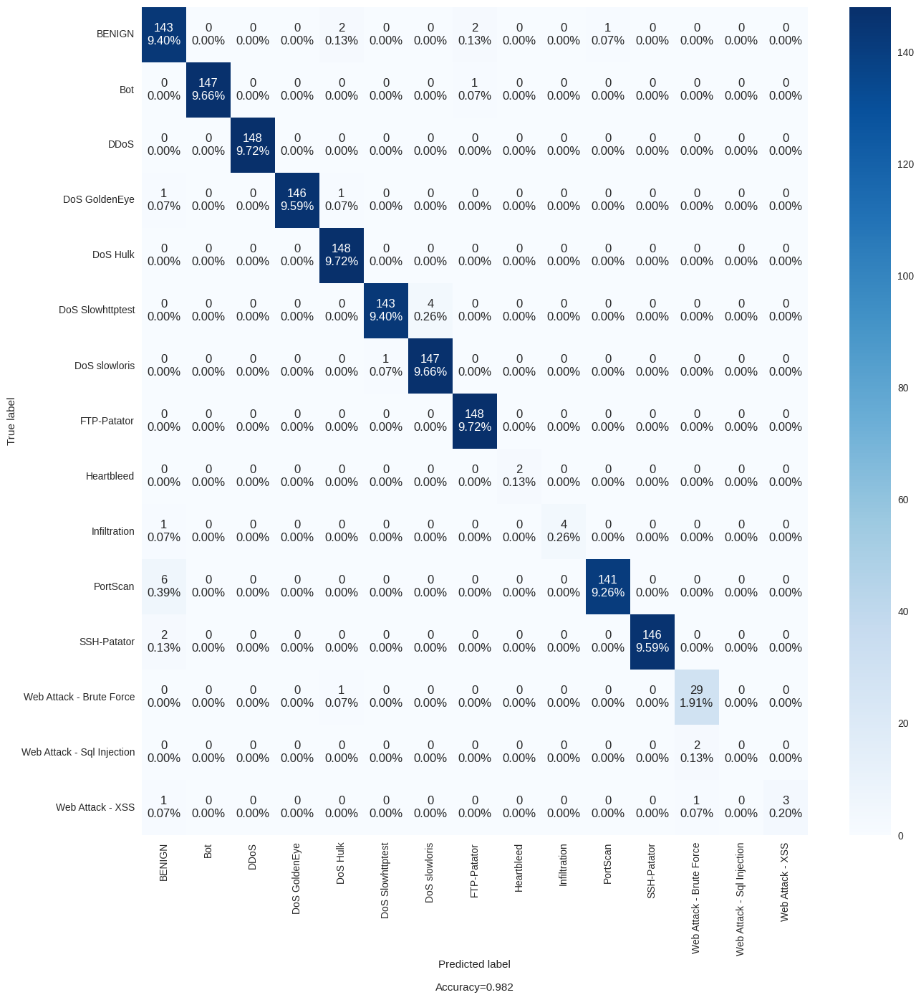

In [138]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [139]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - XSS']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4134106	total: 1.1s	remaining: 42.8s
1:	learn: 0.3062706	total: 2.46s	remaining: 46.8s
2:	learn: 0.2435895	total: 3.63s	remaining: 44.8s
3:	learn: 0.2057076	total: 4.99s	remaining: 44.9s
4:	learn: 0.1628591	total: 6.24s	remaining: 43.7s
5:	learn: 0.1360330	total: 7.66s	remaining: 43.4s
6:	learn: 0.1220207	total: 8.86s	remaining: 41.8s
7:	learn: 0.1032846	total: 10.2s	remaining: 40.9s
8:	learn: 0.0928335	total: 11.4s	remaining: 39.3s
9:	learn: 0.0851328	total: 12.8s	remaining: 38.5s
10:	learn: 0.0795235	total: 14s	remaining: 36.9s
11:	learn: 0.0753453	total: 15.4s	remaining: 35.9s
12:	learn: 0.0709905	total: 16.6s	remaining: 34.5s
13:	learn: 0.0674744	total: 18s	remaining: 33.4s
14:	learn: 0.0647175	total: 19.2s	remaining: 31.9s
15:	learn: 0.0628139	total: 19.7s	remaining: 29.5s
16:	learn: 0.0583764	total: 21.1s	remaining: 28.6s
17:	learn: 0.0564036	total: 22.3s	remaining: 27.2s
18:	learn: 0.0547937	total: 23.7s	remaining: 26.2s
19:	learn: 0.0522603	total: 25.1s	remaining: 2

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.992415,0.981603
1,PRECISION,0.992511,0.977997
2,RECALL,0.992415,0.981603
3,F1 SCORE,0.992403,0.979440


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


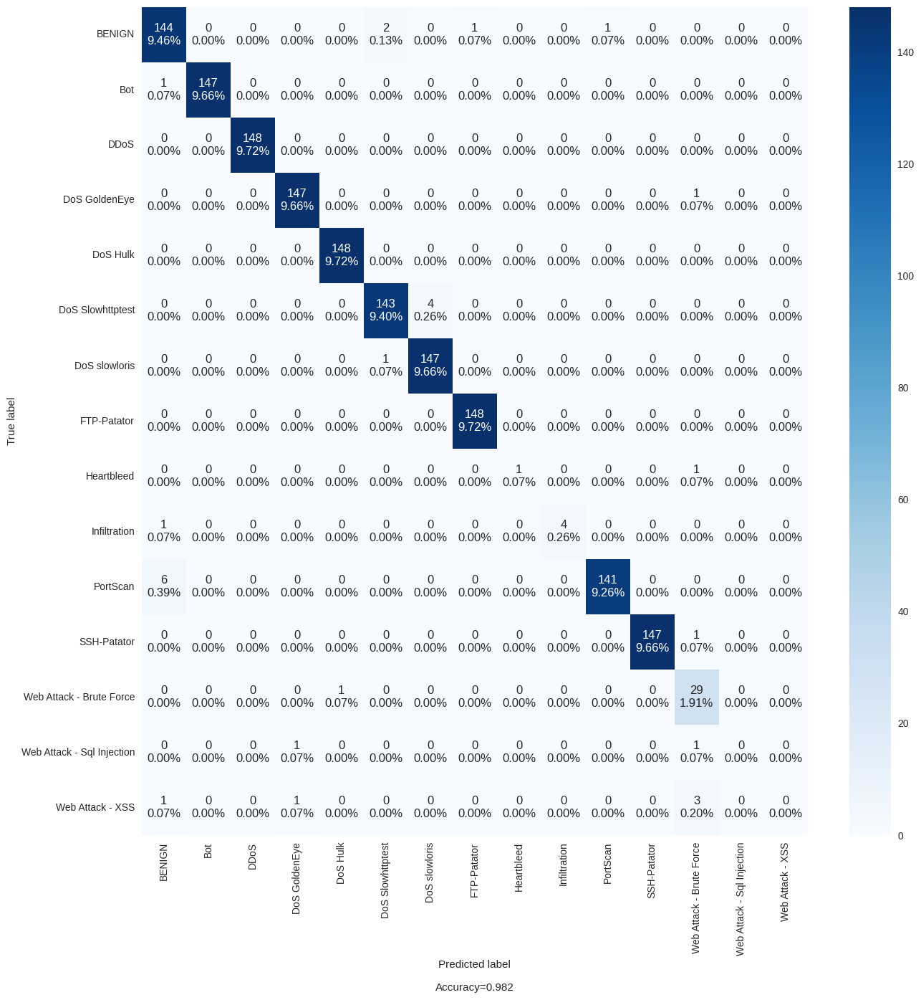

In [140]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))